In [2]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import netCDF4 as nc
import cmocean as cm

from xgcm import Grid

### Make a 2D ncfile of bathymetry
Use ISOMIP+ Ocean1 file to get dimension names more easily

In [2]:
!pwd

/Users/claireyung/mom6/MOM6-examples/ocean_only/ISOMIP/seamount-shelf


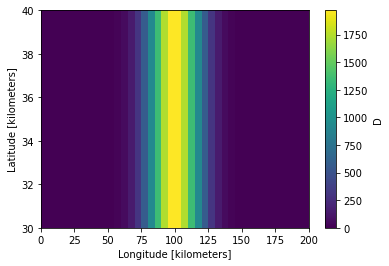

In [12]:
toposeamount = xr.open_dataset('../../seamount/z/ocean_geometry.nc')
seamountice = toposeamount.D
seamountice = 4000-seamountice
seamountice.plot()

In [190]:
seamountice.isel(lath = 0).values

array([9.54446477e-08, 1.02612330e-06, 9.73558781e-06, 8.15150788e-05,
       6.02319489e-04, 3.92761644e-03, 2.26018721e-02, 1.14781777e-01,
       5.14416238e-01, 2.03455569e+00, 7.10129711e+00, 2.18735350e+01,
       5.94584328e+01, 1.42633365e+02, 3.01954837e+02, 5.64125903e+02,
       9.30086376e+02, 1.35326769e+03, 1.73763011e+03, 1.96899287e+03,
       1.96899287e+03, 1.73763011e+03, 1.35326769e+03, 9.30086376e+02,
       5.64125903e+02, 3.01954837e+02, 1.42633365e+02, 5.94584328e+01,
       2.18735350e+01, 7.10129711e+00, 2.03455569e+00, 5.14416238e-01,
       1.14781777e-01, 2.26018721e-02, 3.92761644e-03, 6.02319489e-04,
       8.15150788e-05, 9.73558781e-06, 1.02612330e-06, 9.54446477e-08])

In [14]:
seamounticeds = xr.merge([seamountice, toposeamount.Ah])
seamounticeds

<xarray.Dataset>
Dimensions:  (lath: 2, lonh: 40)
Coordinates:
  * lath     (lath) float64 32.5 37.5
  * lonh     (lonh) float64 2.5 7.5 12.5 17.5 22.5 ... 182.5 187.5 192.5 197.5
Data variables:
    D        (lath, lonh) float64 9.544e-08 1.026e-06 ... 1.026e-06 9.544e-08
    Ah       (lath, lonh) float64 ...

In [15]:
#save as netcdf
seamounticeds.to_netcdf('INPUT/seamountice.nc')


Make Flat Ice

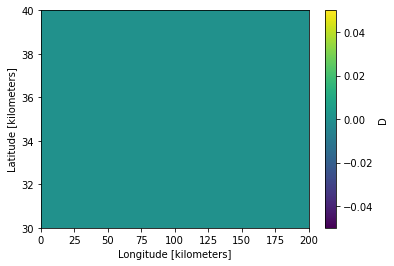

In [19]:
toposeamount = xr.open_dataset('../../seamount/z/ocean_geometry.nc')
flatice = toposeamount.D*0#+0.01
flatice.plot()
flaticeds = xr.merge([flatice, toposeamount.Ah])
flaticeds.to_netcdf('INPUT/flatice0.nc')


Make fatter seamount (by rho/rhoice = 1035/900)

In [40]:
toposeamount = xr.open_dataset('../../seamount/z/ocean_geometry.nc')
seamountice = toposeamount.D
seamountice = 4000-seamountice
seamounticeds = xr.merge([(seamountice)*1034/900, toposeamount.Ah])
seamounticeds.to_netcdf('INPUT/fatseamountice_v2.nc')


## Now run 

Saving in `archive` with `ISOMIP_IC.nc` and `prog.nc`

In [3]:
ave = False ## True means use 5 daily average rather than hourly prog
basee = '/Users/claireyung/mom6/MOM6-examples/ocean_only/ISOMIP/seamount-shelf/archive'
def open_files(label):
    base = basee 
    prog = xr.open_dataset(base + '/prog-'+label+'.nc')
    return prog
def open_IC(label):
    base = basee 
    IC = xr.open_dataset(base + '/MOM_IC-'+label+'.nc')
    return IC
def open_mom(label):
    base = basee 
    IC = xr.open_dataset(base + '/mom-'+label+'.nc')
    return IC
def open_visc(label):
    base = basee 
    IC = xr.open_dataset(base + '/visc-'+label+'.nc')
    return IC

In [3]:
! ls archive

MOM_IC-layer-isomip-drag-kvbig-symshelf-ANALYTIC_FV_PGFFalse.nc
MOM_IC-layer-isomip-drag-kvbig-symshelf-topo-ANALYTIC_FV_PGFFalse.nc
MOM_IC-layer-topo.nc
MOM_IC-layer.nc
MOM_IC-sigma-hack.nc
MOM_IC-sigma-isomip-hack.nc
MOM_IC-sigma-isomip.nc
MOM_IC-sigma.nc
MOM_IC-zstar-hack.nc
MOM_IC-zstar-isomip-drag-kvbig-REGRID_ACCELERATE_INIT-symshelf.nc
MOM_IC-zstar-isomip-drag-kvbig-symshelf-S35.nc
MOM_IC-zstar-isomip-drag-kvbig-symshelf-nonbouss-S35.nc
MOM_IC-zstar-isomip-drag-kvbig-symshelf-nonbouss.nc
MOM_IC-zstar-isomip-drag-kvbig-symshelf-topo-ANALYTIC_FV_PGFFalse.nc
MOM_IC-zstar-isomip-drag-kvbig-symshelf-topo-S35.nc
MOM_IC-zstar-isomip-drag-kvbig-symshelf-topo.nc
MOM_IC-zstar-isomip-drag-kvbig-symshelf-topo0-S35.nc
MOM_IC-zstar-isomip-drag-kvbig-symshelf-topo0.nc
MOM_IC-zstar-isomip-drag-kvbig-symshelf.nc
MOM_IC-zstar-isomip-drag-kvbig-symshelf_v2.nc
MOM_IC-zstar-isomip-drag-kvbig-topo.nc
MOM_IC-zstar-isomip-drag-topoflatice.nc
MOM_IC-zstar-isomip-hack-drag-kvbig-900s-nk100.nc
MOM_IC-zsta

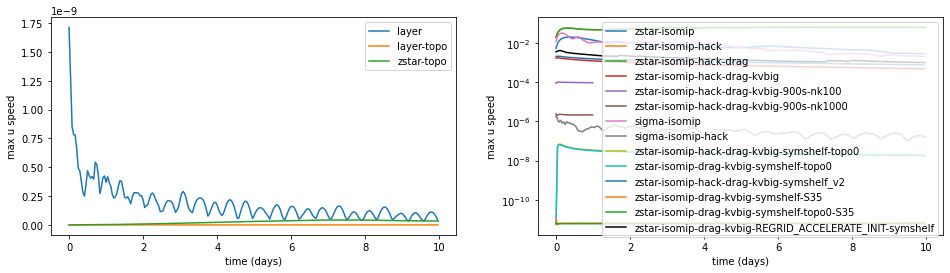

In [9]:
## Plot velocities
fig, axes = plt.subplots(ncols = 2, figsize = (16,4))

label = 'layer'
prog = open_files(label)
axes[0].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), label = 'layer') 

label = 'layer-topo'
prog = open_files(label)
axes[0].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), label = 'layer-topo') 

label = 'zstar-topo'
prog = open_files(label)
axes[0].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), label = 'zstar-topo') 

axes[0].set_ylabel('max u speed')
axes[0].set_xlabel('time (days)')

axes[0].legend()
###########

label = 'zstar-isomip'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), label = label) 

label = 'zstar-isomip-hack'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'zstar-isomip-hack-drag'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'zstar-isomip-hack-drag-kvbig'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'zstar-isomip-hack-drag-kvbig-900s-nk100'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/(24*4),np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'zstar-isomip-hack-drag-kvbig-900s-nk1000'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/(24*4),np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 

label = 'sigma-isomip'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), label = label) 

label = 'sigma-isomip-hack'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'zstar-isomip-hack-drag-kvbig-symshelf-topo0'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'zstar-isomip-drag-kvbig-symshelf-topo0'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'zstar-isomip-hack-drag-kvbig-symshelf_v2'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'zstar-isomip-drag-kvbig-symshelf-S35'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'zstar-isomip-drag-kvbig-symshelf-topo0-S35'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 


label = 'zstar-isomip-drag-kvbig-REGRID_ACCELERATE_INIT-symshelf'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label, color = 'k') 
# label = 'zstar-isomip-surfp'
# prog = open_files(label)
# axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), label = label) 

# label = 'zstar-isomip-surfp-hack'
# prog = open_files(label)
# axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
#              label = label) 

# label = 'sigmashelfzstar-nosurfpressure-nohack-minthick1e-12'
# prog = open_files(label)
# axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
#              label = 'sigmashelfzstar') 

# label = 'sigma-nosurfpressure-nohack-minthick1e-12'
# prog = open_files(label)
# axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
#              label = 'sigma') 
axes[1].set_ylabel('max u speed')
axes[1].set_xlabel('time (days)')

axes[1].legend()
axes[1].set_yscale('log')

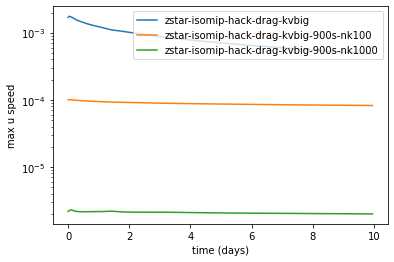

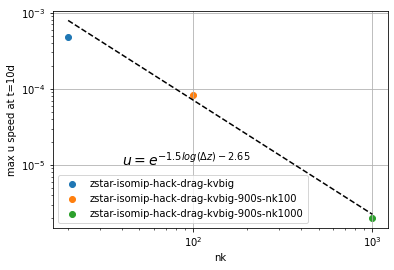

In [71]:
label = 'zstar-isomip-hack-drag-kvbig'
prog = open_files(label)
plt.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'zstar-isomip-hack-drag-kvbig-900s-nk100'
prog = open_files(label)
plt.plot(np.arange(len(prog.Time))/(24),np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'zstar-isomip-hack-drag-kvbig-900s-nk1000'
prog = open_files(label)
plt.plot(np.arange(len(prog.Time))/(24),np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
plt.ylabel('max u speed')
plt.xlabel('time (days)')

plt.legend()
plt.yscale('log')
plt.show()

label = 'zstar-isomip-hack-drag-kvbig'
prog = open_files(label)
plt.scatter([20],np.abs(prog.u).max(['zl','yh','xq'])[-1], 
             label = label) 
label = 'zstar-isomip-hack-drag-kvbig-900s-nk100'
prog = open_files(label)
plt.scatter([100],np.abs(prog.u).max(['zl','yh','xq'])[-1], 
             label = label) 
label = 'zstar-isomip-hack-drag-kvbig-900s-nk1000'
prog = open_files(label)
plt.scatter([1000],np.abs(prog.u).max(['zl','yh','xq'])[-1], 
             label = label) 
plt.ylabel('max u speed at t=10d')
plt.xlabel('nk')

nks = np.arange(20,1000)
plt.plot(nks,np.exp(-1.5*np.log(nks)-2.65), linestyle = '--',color = 'k')
plt.text(40,1e-5,'$u=e^{-1.5log(\Delta z)-2.65}$', fontsize = 14)
plt.legend()
plt.yscale('log')
plt.xscale('log')
plt.grid()
plt.show()


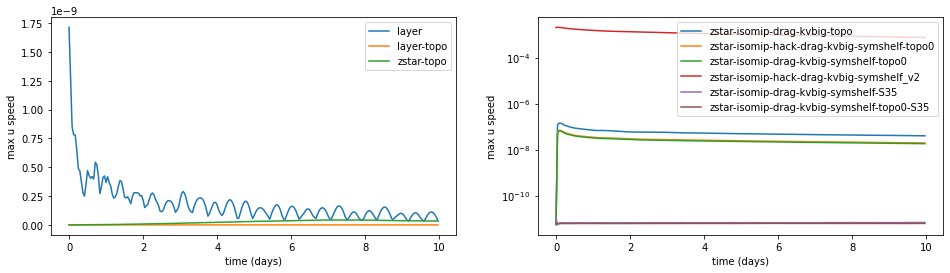

In [31]:
## Plot velocities
fig, axes = plt.subplots(ncols = 2, figsize = (16,4))

label = 'layer'
prog = open_files(label)
axes[0].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), label = 'layer') 

label = 'layer-topo'
prog = open_files(label)
axes[0].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), label = 'layer-topo') 

label = 'zstar-topo'
prog = open_files(label)
axes[0].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), label = 'zstar-topo') 

axes[0].set_ylabel('max u speed')
axes[0].set_xlabel('time (days)')

axes[0].legend()
###########
label = 'zstar-isomip-drag-kvbig-topo'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'zstar-isomip-hack-drag-kvbig-symshelf-topo0'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'zstar-isomip-drag-kvbig-symshelf-topo0'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'zstar-isomip-hack-drag-kvbig-symshelf_v2'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'zstar-isomip-drag-kvbig-symshelf-S35'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'zstar-isomip-drag-kvbig-symshelf-topo0-S35'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
# label = 'zstar-isomip-surfp'
# prog = open_files(label)
# axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), label = label) 

# label = 'zstar-isomip-surfp-hack'
# prog = open_files(label)
# axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
#              label = label) 

# label = 'sigmashelfzstar-nosurfpressure-nohack-minthick1e-12'
# prog = open_files(label)
# axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
#              label = 'sigmashelfzstar') 

# label = 'sigma-nosurfpressure-nohack-minthick1e-12'
# prog = open_files(label)
# axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
#              label = 'sigma') 
axes[1].set_ylabel('max u speed')
axes[1].set_xlabel('time (days)')

axes[1].legend()
axes[1].set_yscale('log')

In [5]:
prog

<xarray.Dataset>
Dimensions:  (xq: 41, yh: 2, zl: 20, Time: 240, xh: 40, yq: 3, zi: 21)
Coordinates:
  * xq       (xq) float64 0.0 5.0 10.0 15.0 20.0 ... 185.0 190.0 195.0 200.0
  * yh       (yh) float64 32.5 37.5
  * zl       (zl) float64 100.0 300.0 500.0 700.0 ... 3.5e+03 3.7e+03 3.9e+03
  * Time     (Time) object 0001-01-01 01:00:00 ... 0001-01-11 00:00:00
  * xh       (xh) float64 2.5 7.5 12.5 17.5 22.5 ... 182.5 187.5 192.5 197.5
  * yq       (yq) float64 30.0 35.0 40.0
  * zi       (zi) float64 0.0 200.0 400.0 600.0 ... 3.6e+03 3.8e+03 4e+03
Data variables:
    u        (Time, zl, yh, xq) float64 nan -2.405e-13 ... -2.805e-11 nan
    v        (Time, zl, yq, xh) float64 ...
    h        (Time, zl, yh, xh) float64 ...
    e        (Time, zi, yh, xh) float64 ...
    temp     (Time, zl, yh, xh) float32 ...
    salt     (Time, zl, yh, xh) float32 ...
    Rml      (Time, zl, yh, xh) float32 ...
Attributes:
    filename:   prog.nc
    title:      GOLD Experiment
    grid_type:  regular
    grid_tile:  N/A

In [4]:
def plot(ax,yy0,tt,i,variable,varname,vmin1,vmax1,cmap,ymax):
    prog = open_files(label)
    ocean_static = xr.open_dataset('ocean_geometry.nc')
    grid = Grid(prog,coords={"x":{"center":"xh","outer":"xq"},
                             "y":{"center":"yh","outer":"yq"},
                             "z":{"center":"zl","outer":"zi"}},periodic=False)
    file_name = label
    IC = open_IC(label)
    depth = grid.interp(prog.e,"x")
    lon = ocean_static.geolonb
    dataplot = variable

    xx = lon
    if (varname == "uo") or (varname == "PFu"): 
        dataplot = grid.interp(dataplot,"x")
    levels = np.linspace(vmin1, vmax1, 51)
    yy = depth[:,:,yy0,:]
    z_levels = yy.shape[1]
    yi = np.linspace(0,5000,z_levels) 
    xi, yyi = np.meshgrid(xx[yy0,:], yi) 
    #print(xi.shape)
    #print(yy[tt,...].shape)
    #print(dataplot[tt,:,yy0,:].shape)
    cax = ax.pcolormesh(xi,yy[tt,...],dataplot[tt,:,yy0,:],vmin = vmin1, vmax = vmax1, cmap = cmap)
    
    plt.colorbar(cax, ax = ax, label = varname)
    
    ## plot interface heights
    i_heights = prog.e # this is 'Interface Height Relative to Mean Sea Level'
    # do for one time
    i_heights = i_heights.isel(Time = tt)
    # take zonal mean
    i_heights = i_heights.isel(yh = yy0)#.mean('xh')

    # plot a line of layer depths, layer by layer
    nz = len(i_heights.zi)
    xh = prog.xh

    for i in range(nz):
        ax.plot(xh,i_heights[i], color = 'k', linewidth = 0.5)
    
    ax.set_ylim(ymin=-ymax,ymax=0)
    ax.set_ylabel('Depth (m)')
    ax.set_xlabel('x (km)')
    ax.set_title(varname+' , ' +label)
    


Text(0.5, 0.98, 'Time = 1 hours')

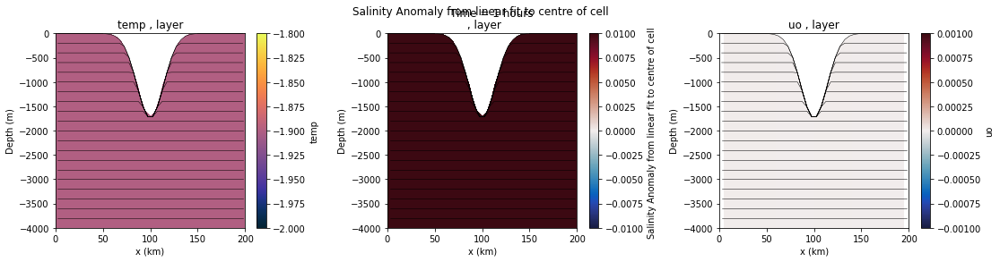

In [243]:
label = 'layer'

fig, axes = plt.subplots(ncols = 3, figsize = (18,4))
prog = open_files(label)
IC = open_IC(label)
x = 0
time = 0
ymax = 4000
plot(axes[0],x,time,0,prog.temp,"temp",-2,-1.8,cm.cm.thermal,ymax)

prog = open_files(label)
IC = open_IC(label)

ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-4000) + 33.8
plot(axes[1],x,time,0,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-2,1e-2,cm.cm.balance,ymax)
#plot(axes[1],x,time,0,prog.salt,"salt",33.7,34.6,cm.cm.haline,ymax)

prog = open_files(label)
IC = open_IC(label)

plot(axes[2],x,time,0,prog.u,"uo",-1e-3,1e-3,cm.cm.balance,ymax)

fig.subplots_adjust(wspace = 0.4)
fig.suptitle('Time = '+str(time+1)+' hours')

Text(0.5, 0.98, 'Time = 1 hours')

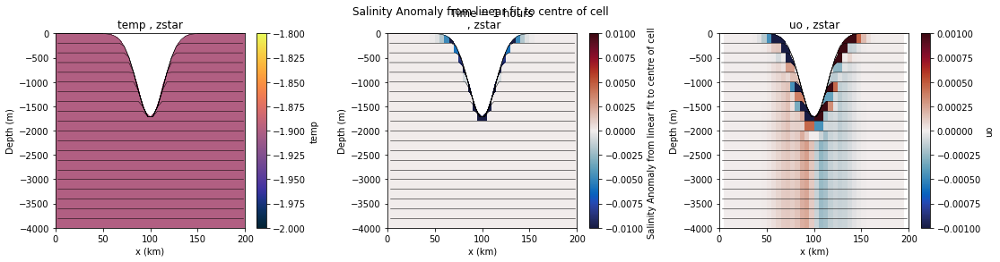

In [244]:
label = 'zstar'

fig, axes = plt.subplots(ncols = 3, figsize = (18,4))
prog = open_files(label)
IC = open_IC(label)
x = 0
time = 0
ymax = 4000
plot(axes[0],x,time,0,prog.temp,"temp",-2,-1.8,cm.cm.thermal,ymax)

prog = open_files(label)
IC = open_IC(label)

ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-4000) + 33.8
plot(axes[1],x,time,0,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-2,1e-2,cm.cm.balance,ymax)
#plot(axes[1],x,time,0,prog.salt,"salt",33.7,34.6,cm.cm.haline,ymax)

prog = open_files(label)
IC = open_IC(label)

plot(axes[2],x,time,0,prog.u,"uo",-1e-3,1e-3,cm.cm.balance,ymax)

fig.subplots_adjust(wspace = 0.4)
fig.suptitle('Time = '+str(time+1)+' hours')

Text(0.5, 0.98, 'Time = 1 hours')

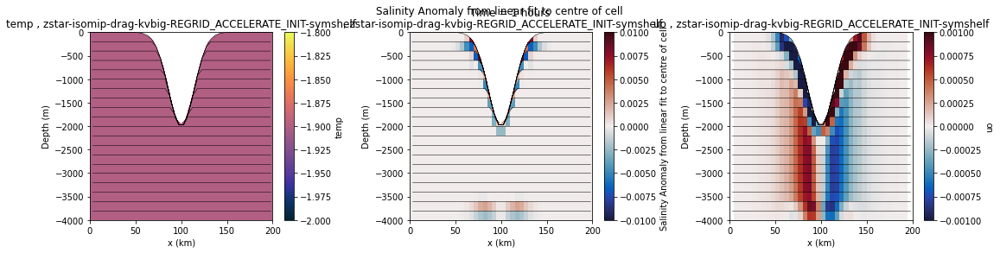

In [6]:
label = 'zstar-isomip-drag-kvbig-REGRID_ACCELERATE_INIT-symshelf'

fig, axes = plt.subplots(ncols = 3, figsize = (18,4))
prog = open_files(label)
IC = open_IC(label)
x = 0
time = 0
ymax = 4000
plot(axes[0],x,time,0,prog.temp,"temp",-2,-1.8,cm.cm.thermal,ymax)

prog = open_files(label)
IC = open_IC(label)

ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-4000) + 33.8
plot(axes[1],x,time,0,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-2,1e-2,cm.cm.balance,ymax)
#plot(axes[1],x,time,0,prog.salt,"salt",33.7,34.6,cm.cm.haline,ymax)

prog = open_files(label)
IC = open_IC(label)

plot(axes[2],x,time,0,prog.u,"uo",-1e-3,1e-3,cm.cm.balance,ymax)

fig.subplots_adjust(wspace = 0.4)
fig.suptitle('Time = '+str(time+1)+' hours')

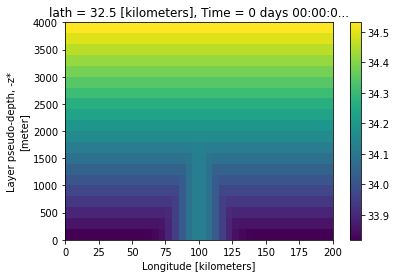

In [245]:

ideal_salt.isel(lath = 0).plot()

Text(0.5, 0.98, 'Time = 1 hours')

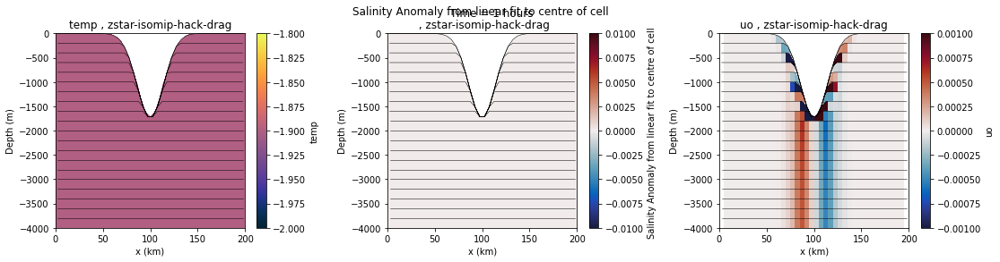

In [246]:
label = 'zstar-isomip-hack-drag'

fig, axes = plt.subplots(ncols = 3, figsize = (18,4))
prog = open_files(label)
IC = open_IC(label)
x = 0
time = 0
ymax = 4000
plot(axes[0],x,time,0,prog.temp,"temp",-2,-1.8,cm.cm.thermal,ymax)

prog = open_files(label)
IC = open_IC(label)

ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-4000) + 33.8
plot(axes[1],x,time,0,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-2,1e-2,cm.cm.balance,ymax)
#plot(axes[1],x,time,0,prog.salt,"salt",33.7,34.6,cm.cm.haline,ymax)

prog = open_files(label)
IC = open_IC(label)

plot(axes[2],x,time,0,prog.u,"uo",-1e-3,1e-3,cm.cm.balance,ymax)

fig.subplots_adjust(wspace = 0.4)
fig.suptitle('Time = '+str(time+1)+' hours')

Text(0.5, 0.98, 'Time = 1 hours')

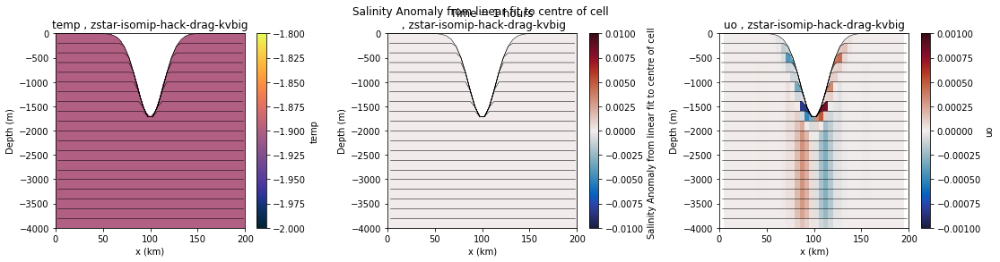

In [247]:
label = 'zstar-isomip-hack-drag-kvbig'

fig, axes = plt.subplots(ncols = 3, figsize = (18,4))
prog = open_files(label)
IC = open_IC(label)
x = 0
time = 0
ymax = 4000
plot(axes[0],x,time,0,prog.temp,"temp",-2,-1.8,cm.cm.thermal,ymax)

prog = open_files(label)
IC = open_IC(label)

ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-4000) + 33.8
plot(axes[1],x,time,0,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-2,1e-2,cm.cm.balance,ymax)
#plot(axes[1],x,time,0,prog.salt,"salt",33.7,34.6,cm.cm.haline,ymax)

prog = open_files(label)
IC = open_IC(label)

plot(axes[2],x,time,0,prog.u,"uo",-1e-3,1e-3,cm.cm.balance,ymax)

fig.subplots_adjust(wspace = 0.4)
fig.suptitle('Time = '+str(time+1)+' hours')

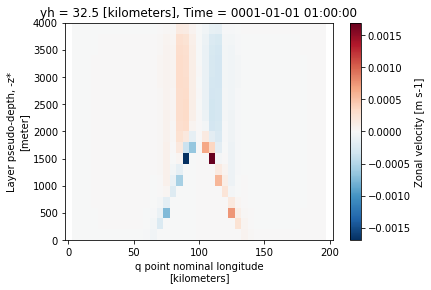

In [248]:
prog.u.isel(yh = 0,Time = 0).plot()

Text(0.5, 0.98, 'Time = 1 hours')

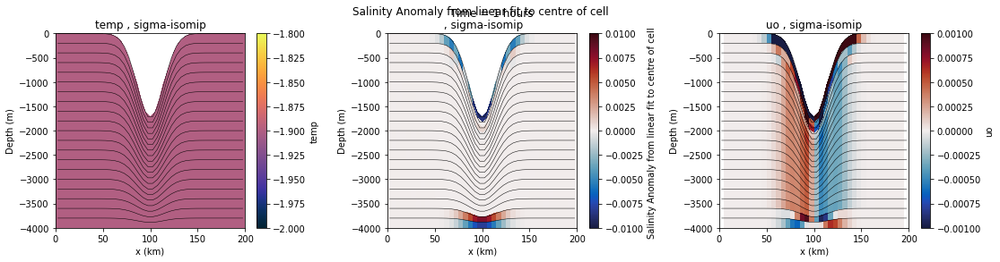

In [249]:
label = 'sigma-isomip'

fig, axes = plt.subplots(ncols = 3, figsize = (18,4))
prog = open_files(label)
IC = open_IC(label)
x = 0
time = 0
ymax = 4000
plot(axes[0],x,time,0,prog.temp,"temp",-2,-1.8,cm.cm.thermal,ymax)

prog = open_files(label)
IC = open_IC(label)

ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-4000) + 33.8
plot(axes[1],x,time,0,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-2,1e-2,cm.cm.balance,ymax)
#plot(axes[1],x,time,0,prog.salt,"salt",33.7,34.6,cm.cm.haline,ymax)

prog = open_files(label)
IC = open_IC(label)

plot(axes[2],x,time,0,prog.u,"uo",-1e-3,1e-3,cm.cm.balance,ymax)

fig.subplots_adjust(wspace = 0.4)
fig.suptitle('Time = '+str(time+1)+' hours')

Text(0.5, 0.98, 'Time = 1 hours')

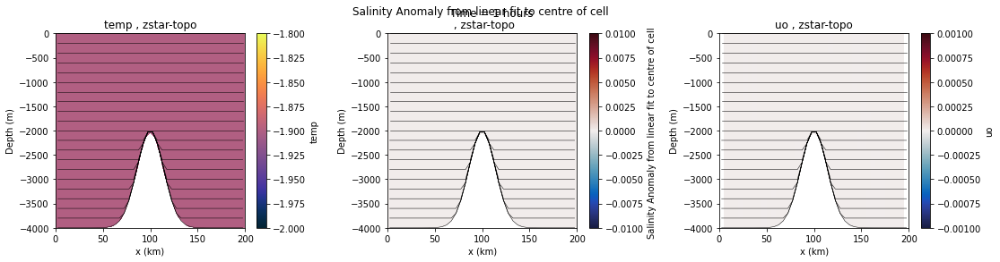

In [250]:
label = 'zstar-topo'

fig, axes = plt.subplots(ncols = 3, figsize = (18,4))
prog = open_files(label)
IC = open_IC(label)
x = 0
time = 0
ymax = 4000
plot(axes[0],x,time,0,prog.temp,"temp",-2,-1.8,cm.cm.thermal,ymax)

prog = open_files(label)
IC = open_IC(label)

ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-4000) + 33.8
plot(axes[1],x,time,0,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-2,1e-2,cm.cm.balance,ymax)
#plot(axes[1],x,time,0,prog.salt,"salt",33.7,34.6,cm.cm.haline,ymax)

prog = open_files(label)
IC = open_IC(label)

plot(axes[2],x,time,0,prog.u,"uo",-1e-3,1e-3,cm.cm.balance,ymax)

fig.subplots_adjust(wspace = 0.4)
fig.suptitle('Time = '+str(time+1)+' hours')

Text(0.5, 0.98, 'Time = 0 hours')

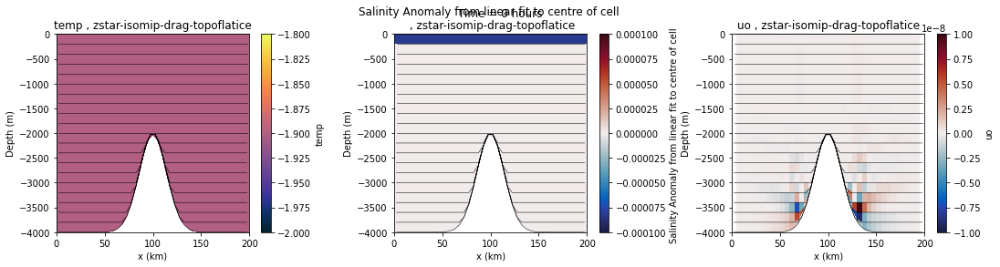

In [251]:
label = 'zstar-isomip-drag-topoflatice'
fig, axes = plt.subplots(ncols = 3, figsize = (18,4))
prog = open_files(label)
IC = open_IC(label)
x = 0
time = -1
ymax = 4000
plot(axes[0],x,time,0,prog.temp,"temp",-2,-1.8,cm.cm.thermal,ymax)

prog = open_files(label)
IC = open_IC(label)

ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-4000) + 33.8
plot(axes[1],x,time,0,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-4,1e-4,cm.cm.balance,ymax)
#plot(axes[1],x,time,0,prog.salt,"salt",33.7,34.6,cm.cm.haline,ymax)

prog = open_files(label)
IC = open_IC(label)

plot(axes[2],x,time,0,prog.u,"uo",-1e-8,1e-8,cm.cm.balance,ymax)

fig.subplots_adjust(wspace = 0.4)
fig.suptitle('Time = '+str(time+1)+' hours')

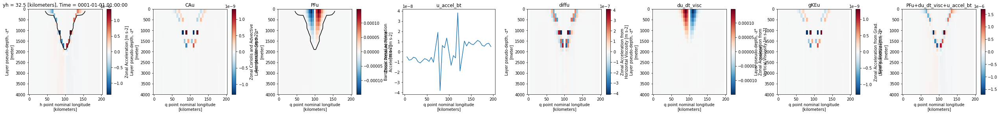

In [252]:
label = 'zstar'
mom = open_mom(label)
prog = open_files(label)
time = 0
y = 0

fig, axes = plt.subplots(ncols = 8, figsize= (44,4))
mom.dudt.isel(Time = time, yh = y).plot(ax = axes[0], yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
axes[0].set_title('dudt')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[0], yincrease = False, levels = [199], colors = 'k')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[2], yincrease = False, levels = [199], colors = 'k')

mom.CAu.isel(Time = time, yh = y).plot(ax = axes[1], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[1].set_title('CAu')
mom.PFu.isel(Time = time, yh = y).plot(ax = axes[2], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[2].set_title('PFu')
mom.u_accel_bt.isel(Time = time, yh = y).plot(ax = axes[3])
axes[3].set_title('u_accel_bt')
mom.diffu.isel(Time = time, yh = y).plot(ax = axes[4], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[4].set_title('diffu')
mom.du_dt_visc.isel(Time = time, yh = y).plot(ax = axes[5], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[5].set_title('du_dt_visc')
mom.gKEu.isel(Time = time, yh = y).plot(ax = axes[6], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[6].set_title('gKEu')
(mom.du_dt_visc+mom.PFu+mom.u_accel_bt).isel(Time = time, yh = y).plot(ax = axes[7], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[7].set_title('PFu+du_dt_visc+u_accel_bt')


fig.subplots_adjust(wspace = 0.35)

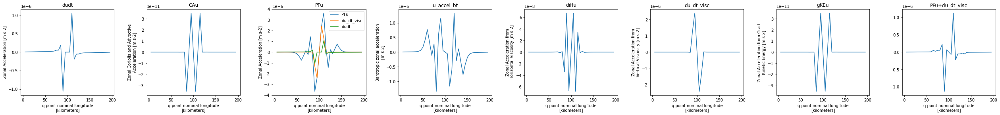

In [253]:
label = 'zstar-isomip-hack-drag-kvbig-900s'
mom = open_mom(label)
prog = open_files(label)
time = 0
y = 0

fig, axes = plt.subplots(ncols = 8, figsize= (44,4))
mom.dudt.isel(Time = time, yh = y).sel(zl = 1500, method = 'nearest').plot(ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
axes[0].set_title('dudt')
# prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[0], yincrease = False, levels = [199], colors = 'k')
# prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[2], yincrease = False, levels = [199], colors = 'k')

mom.CAu.isel(Time = time, yh = y).sel(zl = 1500, method = 'nearest').plot(ax = axes[1])#, yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[1].set_title('CAu')
mom.PFu.isel(Time = time, yh = y).sel(zl = 1500, method = 'nearest').plot(ax = axes[2], label = 'PFu')#, yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
(-1*mom.du_dt_visc).isel(Time = time, yh = y).sel(zl = 1500, method = 'nearest').plot(ax = axes[2], label = 'du_dt_visc')#, yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
mom.dudt.isel(Time = time, yh = y).sel(zl = 1500, method = 'nearest').plot(ax = axes[2], label = 'dudt')#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
axes[2].legend()
axes[2].set_title('PFu')
mom.u_accel_bt.isel(Time = time, yh = y).plot(ax = axes[3])
axes[3].set_title('u_accel_bt')
mom.diffu.isel(Time = time, yh = y).sel(zl = 1500, method = 'nearest').plot(ax = axes[4])#, yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[4].set_title('diffu')
mom.du_dt_visc.isel(Time = time, yh = y).sel(zl = 1500, method = 'nearest').plot(ax = axes[5])#, yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[5].set_title('du_dt_visc')
mom.gKEu.isel(Time = time, yh = y).sel(zl = 1500, method = 'nearest').plot(ax = axes[6])#, yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[6].set_title('gKEu')
(mom.du_dt_visc+mom.PFu-(mom.du_dt_visc+mom.PFu).isel(zl=0)).isel(Time = time, yh = y).sel(zl = 1500, method = 'nearest').plot(ax = axes[7])#, yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[7].set_title('PFu+du_dt_visc')


fig.subplots_adjust(wspace = 0.35)

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


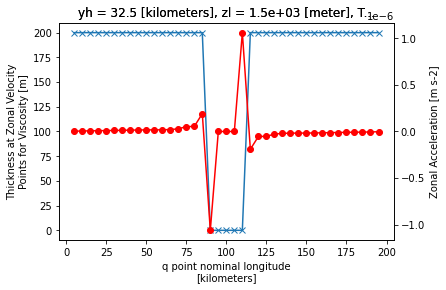

In [254]:
fig, ax = plt.subplots()
visc = xr.open_dataset('visc.nc')
visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = 1500, method = 'nearest').plot(marker = 'x')
ax2 = ax.twinx()
mom.dudt.isel(Time = time, yh = y).sel(zl = 1500, method = 'nearest').plot(ax = ax2, color = 'r', marker = 'o')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
#yincrease = False)

In [255]:
visc.au_visc

<xarray.DataArray 'au_visc' (Time: 960, zi: 21, yh: 2, xq: 41)>
[1653120 values with dtype=float32]
Coordinates:
  * xq       (xq) float64 0.0 5.0 10.0 15.0 20.0 ... 185.0 190.0 195.0 200.0
  * yh       (yh) float64 32.5 37.5
  * Time     (Time) object 0001-01-01 00:07:30 ... 0001-01-10 23:52:30
  * zi       (zi) float64 0.0 200.0 399.9 ... 3.599e+03 3.799e+03 3.999e+03
Attributes:
    long_name:      Zonal Viscous Vertical Coupling Coefficient
    units:          m s-1
    cell_methods:   zi:point yh:mean xq:point time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    interp_method:  none

In [256]:
visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = 1500, method = 'nearest')

<xarray.DataArray 'Hu_visc' (xq: 41)>
[41 values with dtype=float32]
Coordinates:
  * xq       (xq) float64 0.0 5.0 10.0 15.0 20.0 ... 185.0 190.0 195.0 200.0
    yh       float64 32.5
    zl       float64 1.5e+03
    Time     object 0001-01-01 00:07:30
Attributes:
    long_name:      Thickness at Zonal Velocity Points for Viscosity
    units:          m
    cell_methods:   zl:mean yh:mean xq:point time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    interp_method:  none

In [257]:
visc.au_visc.isel(Time = 0, yh = 0).sel(zi = 1500, method = 'nearest')

<xarray.DataArray 'au_visc' (xq: 41)>
[41 values with dtype=float32]
Coordinates:
  * xq       (xq) float64 0.0 5.0 10.0 15.0 20.0 ... 185.0 190.0 195.0 200.0
    yh       float64 32.5
    Time     object 0001-01-01 00:07:30
    zi       float64 1.6e+03
Attributes:
    long_name:      Zonal Viscous Vertical Coupling Coefficient
    units:          m s-1
    cell_methods:   zi:point yh:mean xq:point time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    interp_method:  none

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


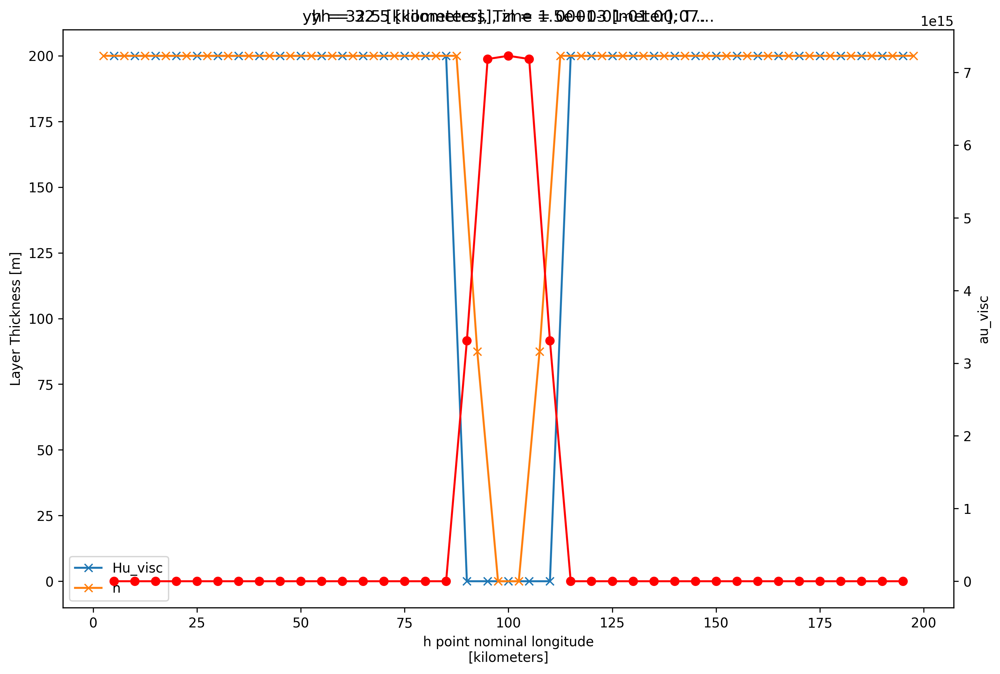

In [258]:
fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
visc = xr.open_dataset('visc.nc')
visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = 1500, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
prog.h.isel(Time = 0, yh = 0).sel(zl = 1500, method = 'nearest').plot(marker = 'x', label = 'h')

ax2 = ax.twinx()
(visc.au_visc.isel(Time = 0, yh = 0).sel(zi = 1400, method = 'nearest')*900).plot(ax = ax2, color = 'r', marker = 'o')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
#yincrease = False)
ax.legend()

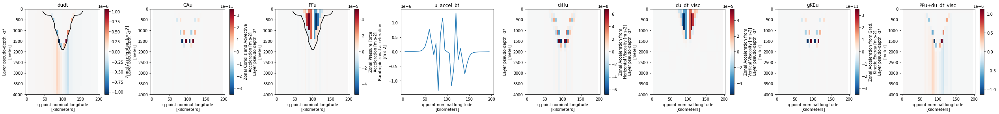

In [259]:
label = 'zstar-isomip-hack-drag-kvbig-900s'
mom = open_mom(label)
prog = open_files(label)
time = 0
y = 0

fig, axes = plt.subplots(ncols = 8, figsize= (44,4))
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[0], yincrease = False, levels = [199], colors = 'k')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[2], yincrease = False, levels = [199], colors = 'k')
mom.dudt.isel(Time = time, yh = y).plot(ax = axes[0], yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
axes[0].set_title('dudt')

mom.CAu.isel(Time = time, yh = y).plot(ax = axes[1], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[1].set_title('CAu')
mom.PFu.isel(Time = time, yh = y).plot(ax = axes[2], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[2].set_title('PFu')
mom.u_accel_bt.isel(Time = time, yh = y).plot(ax = axes[3])
axes[3].set_title('u_accel_bt')
mom.diffu.isel(Time = time, yh = y).plot(ax = axes[4], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[4].set_title('diffu')
mom.du_dt_visc.isel(Time = time, yh = y).plot(ax = axes[5], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[5].set_title('du_dt_visc')
mom.gKEu.isel(Time = time, yh = y).plot(ax = axes[6], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[6].set_title('gKEu')
(mom.du_dt_visc+mom.PFu-(mom.du_dt_visc+mom.PFu).isel(zl=0)).isel(Time = time, yh = y).plot(ax = axes[7], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[7].set_title('PFu+du_dt_visc')


fig.subplots_adjust(wspace = 0.35)

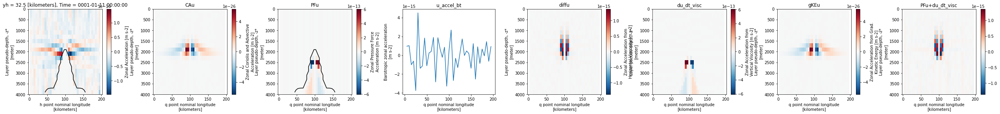

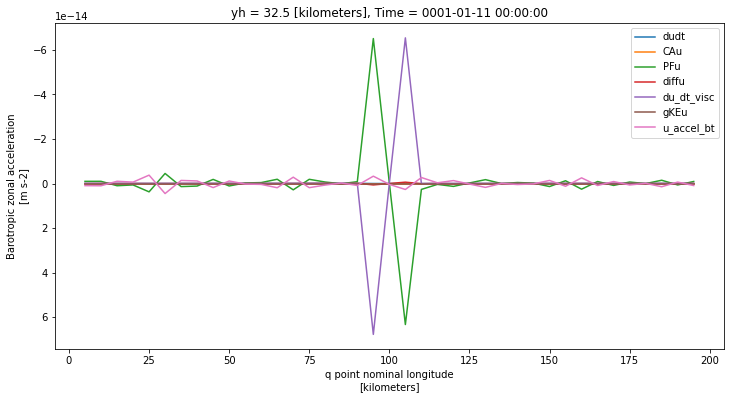

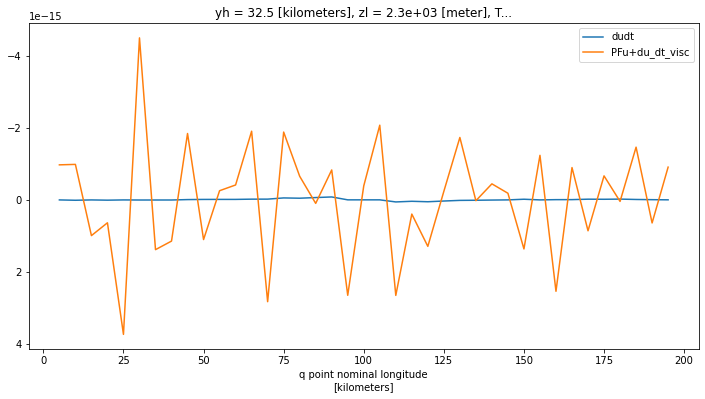

In [260]:
label = 'zstar-topo'
mom = open_mom(label)
prog = open_files(label)
time = -1
y = 0

fig, axes = plt.subplots(ncols = 8, figsize= (44,4))
mom.dudt.isel(Time = time, yh = y).plot(ax = axes[0], yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
axes[0].set_title('dudt')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[0], yincrease = False, levels = [199], colors = 'k')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[2], yincrease = False, levels = [199], colors = 'k')

mom.CAu.isel(Time = time, yh = y).plot(ax = axes[1], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[1].set_title('CAu')
mom.PFu.isel(Time = time, yh = y).plot(ax = axes[2], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[2].set_title('PFu')
mom.u_accel_bt.isel(Time = time, yh = y).plot(ax = axes[3])
axes[3].set_title('u_accel_bt')
mom.diffu.isel(Time = time, yh = y).plot(ax = axes[4], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[4].set_title('diffu')
mom.du_dt_visc.isel(Time = time, yh = y).plot(ax = axes[5], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[5].set_title('du_dt_visc')
mom.gKEu.isel(Time = time, yh = y).plot(ax = axes[6], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[6].set_title('gKEu')
(mom.du_dt_visc+mom.PFu-(mom.du_dt_visc+mom.PFu).isel(zl=0)).isel(Time = time, yh = y).plot(ax = axes[7], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[7].set_title('PFu+du_dt_visc')


fig.subplots_adjust(wspace = 0.35)
plt.show()
depth = 2200
fig, ax = plt.subplots(figsize = (12,6))
for term in ['dudt','CAu','PFu','diffu','du_dt_visc','gKEu']:
    mom[term].isel(Time = time, yh = y).sel(zl = depth, method = 'nearest').plot(yincrease = False, label = term)
term = 'u_accel_bt'
mom[term].isel(Time = time, yh = y).plot(yincrease = False, label = term)

plt.legend()
plt.show()

fig.subplots_adjust(wspace = 0.35)
plt.show()
depth = 2200
fig, ax = plt.subplots(figsize = (12,6))
mom.dudt.isel(Time = time, yh = y).sel(zl = depth, method = 'nearest').plot(yincrease = False, label = 'dudt')
(mom.PFu+mom.du_dt_visc).isel(Time = time, yh = y).sel(zl = depth, method = 'nearest').plot(yincrease = False, label = 'PFu+du_dt_visc')



plt.legend()
plt.show()

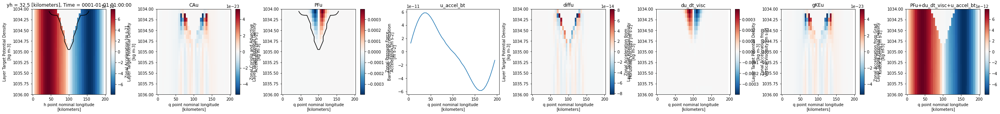

In [261]:
label = 'layer'
mom = open_mom(label)
prog = open_files(label)
time = 0
y = 0

fig, axes = plt.subplots(ncols = 8, figsize= (44,4))
mom.dudt.isel(Time = time, yh = y).plot(ax = axes[0], yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
axes[0].set_title('dudt')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[0], yincrease = False, levels = [199], colors = 'k')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[2], yincrease = False, levels = [199], colors = 'k')

mom.CAu.isel(Time = time, yh = y).plot(ax = axes[1], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[1].set_title('CAu')
mom.PFu.isel(Time = time, yh = y).plot(ax = axes[2], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[2].set_title('PFu')
mom.u_accel_bt.isel(Time = time, yh = y).plot(ax = axes[3])
axes[3].set_title('u_accel_bt')
mom.diffu.isel(Time = time, yh = y).plot(ax = axes[4], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[4].set_title('diffu')
mom.du_dt_visc.isel(Time = time, yh = y).plot(ax = axes[5], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[5].set_title('du_dt_visc')
mom.gKEu.isel(Time = time, yh = y).plot(ax = axes[6], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[6].set_title('gKEu')
(mom.du_dt_visc+mom.PFu+mom.u_accel_bt).isel(Time = time, yh = y).plot(ax = axes[7], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[7].set_title('PFu+du_dt_visc+u_accel_bt')


fig.subplots_adjust(wspace = 0.35)

Text(0.5, 0.98, 'Time = 1 hours')

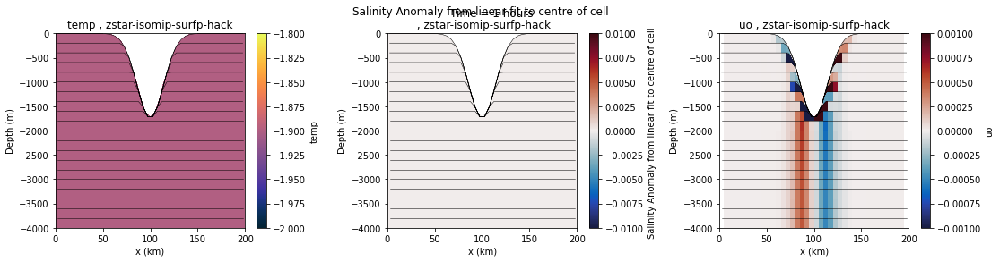

In [262]:
label = 'zstar-isomip-surfp-hack'

fig, axes = plt.subplots(ncols = 3, figsize = (18,4))
prog = open_files(label)
IC = open_IC(label)
x = 0
time = 0#24*5-1
ymax = 4000
plot(axes[0],x,time,0,prog.temp,"temp",-2,-1.8,cm.cm.thermal,ymax)

prog = open_files(label)
IC = open_IC(label)

#plot(axes[1],x,time,0,prog.salt,"salt",33.7,34.6,cm.cm.haline,ymax)
ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-4000) + 33.8
plot(axes[1],x,time,0,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-2,1e-2,cm.cm.balance,ymax)


prog = open_files(label)
IC = open_IC(label)

plot(axes[2],x,time,0,prog.u,"uo",-1e-3,1e-3,cm.cm.balance,ymax)

fig.subplots_adjust(wspace = 0.4)
fig.suptitle('Time = '+str(time+1)+' hours')

# Now use HACKMODE

after running with `THICKNESS_CONFIG = "ISOMIP"` make ncfile

In [18]:
def make_thickness_file(filename):
    
    ic = xr.open_dataset('MOM_IC.nc')
    _, nz, ny, nx = ic.h.data.shape

    new_thick = nc.Dataset(filename, "w", format="NETCDF4")
    new_thick.createDimension("nz", nz)
    new_thick.createDimension("ny", ny)
    new_thick.createDimension("nx", nx)
    new_thick.createVariable("h","f8",("nz","ny","nx"))

    new_thick["h"][:,:,:] = ic.h.data#*1035
    new_thick.close()


In [17]:
make_thickness_file('INPUT/zstar-isomip-symshelf-nonbouss.nc')

Now run with hack version of MOM6 and `THICKNESS_CONFIG = "thickness_simpleshelf2_pfile.nc"` by changing `MOM_override` 

(TODO: make the two runs and editing MOM_override happen automatically with a bash script)

Now plot the results and compare to the original with the salt/thickness bug.

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/plot/dataarray_plot.py:2021: UserWarning: No contour levels were found within the data range.
  primitive = ax.contour(x, y, z, **kwargs)


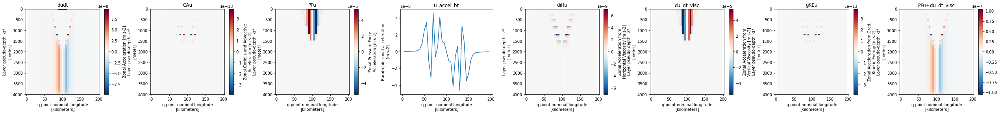

In [263]:
label = 'zstar-isomip-hack-drag-kvbig-900s-nk100'
mom = open_mom(label)
prog = open_files(label)
time = 0
y = 0

fig, axes = plt.subplots(ncols = 8, figsize= (44,4))
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[0], yincrease = False, levels = [199], colors = 'k')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[2], yincrease = False, levels = [199], colors = 'k')
mom.dudt.isel(Time = time, yh = y).plot(ax = axes[0], yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
axes[0].set_title('dudt')

mom.CAu.isel(Time = time, yh = y).plot(ax = axes[1], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[1].set_title('CAu')
mom.PFu.isel(Time = time, yh = y).plot(ax = axes[2], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[2].set_title('PFu')
mom.u_accel_bt.isel(Time = time, yh = y).plot(ax = axes[3])
axes[3].set_title('u_accel_bt')
mom.diffu.isel(Time = time, yh = y).plot(ax = axes[4], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[4].set_title('diffu')
mom.du_dt_visc.isel(Time = time, yh = y).plot(ax = axes[5], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[5].set_title('du_dt_visc')
mom.gKEu.isel(Time = time, yh = y).plot(ax = axes[6], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[6].set_title('gKEu')
(mom.du_dt_visc+mom.PFu-(mom.du_dt_visc+mom.PFu).isel(zl=0)).isel(Time = time, yh = y).plot(ax = axes[7], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[7].set_title('PFu+du_dt_visc')


fig.subplots_adjust(wspace = 0.35)

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


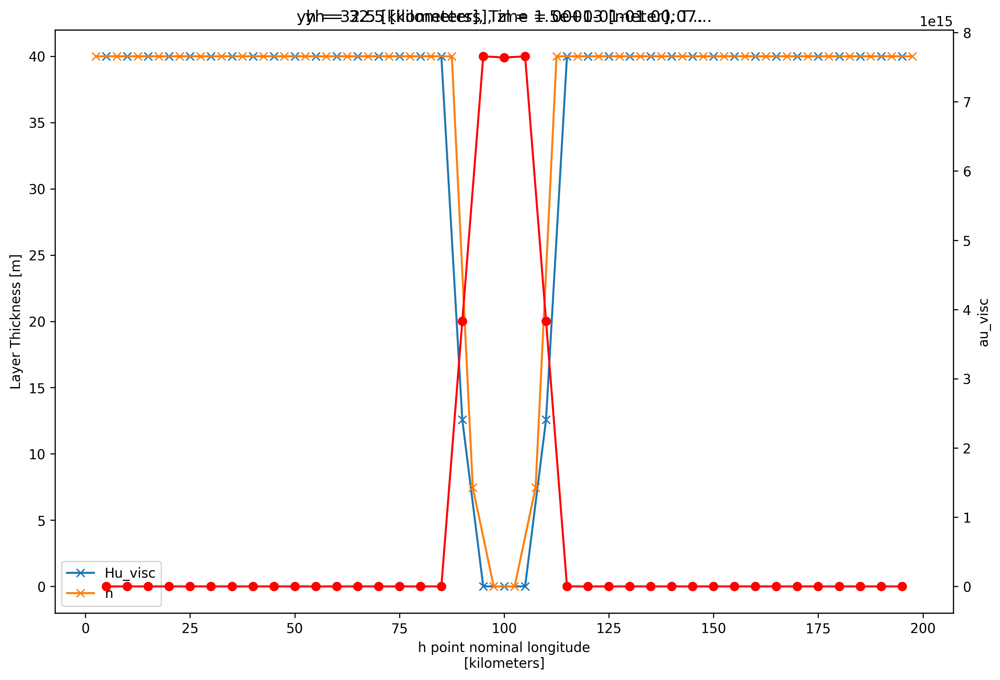

In [264]:
fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
visc = xr.open_dataset('archive/visc-'+label+'.nc')
visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = 1500, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
prog.h.isel(Time = 0, yh = 0).sel(zl = 1500, method = 'nearest').plot(marker = 'x', label = 'h')

ax2 = ax.twinx()
(visc.au_visc.isel(Time = 0, yh = 0).sel(zi = 1400, method = 'nearest')*900).plot(ax = ax2, color = 'r', marker = 'o')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
#yincrease = False)
ax.legend()

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


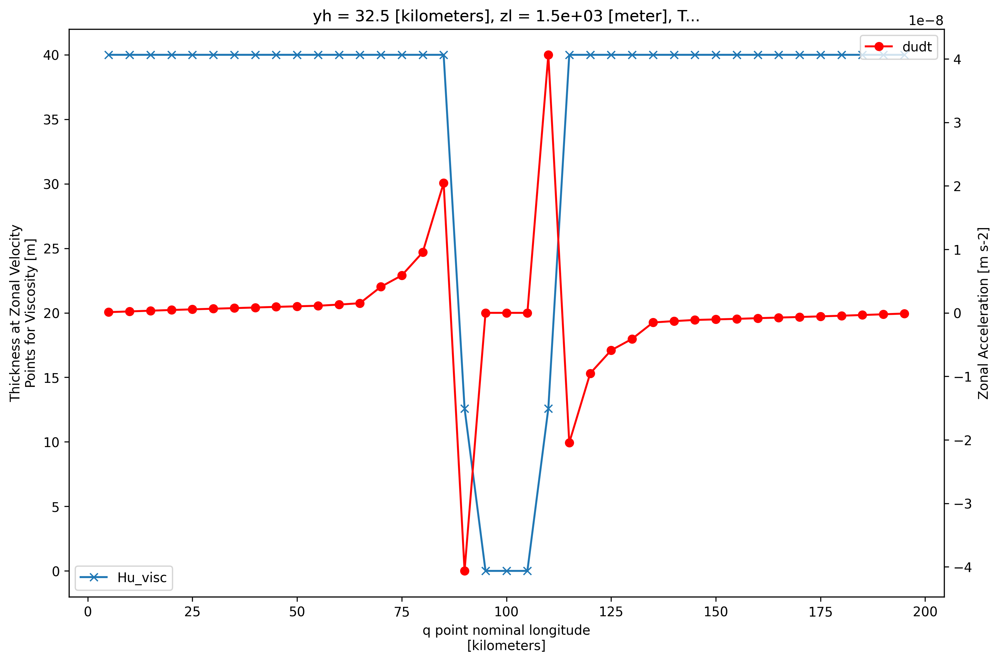

In [265]:
fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
visc = xr.open_dataset('archive/visc-'+label+'.nc')
visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = 1500, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
ax2 = ax.twinx()
mom.dudt.isel(Time = 0, yh = y).sel(zl = 1500, method = 'nearest').plot(ax = ax2, color = 'r', marker = 'o', label = 'dudt')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
#yincrease = False)
ax.legend()
ax2.legend()

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/plot/dataarray_plot.py:2021: UserWarning: No contour levels were found within the data range.
  primitive = ax.contour(x, y, z, **kwargs)


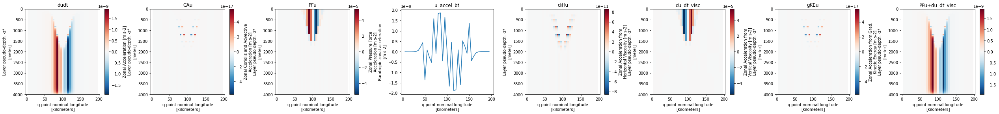

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


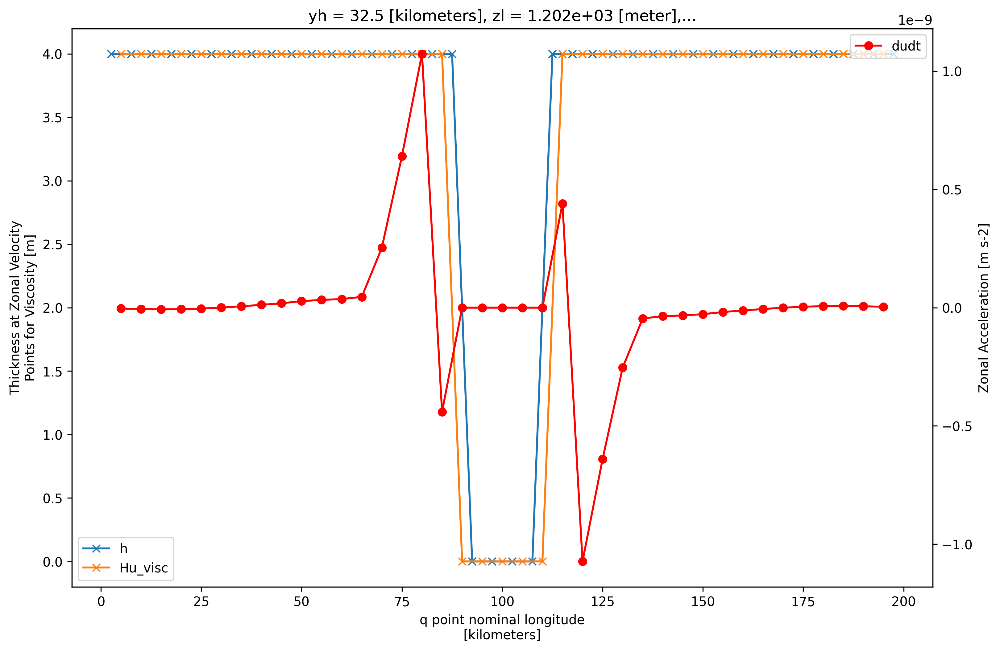

In [266]:
label = 'zstar-isomip-hack-drag-kvbig-900s-nk1000'
mom = open_mom(label)
prog = open_files(label)
time = 0
y = 0

fig, axes = plt.subplots(ncols = 8, figsize= (44,4))
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[0], yincrease = False, levels = [199], colors = 'k')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[2], yincrease = False, levels = [199], colors = 'k')
mom.dudt.isel(Time = time, yh = y).plot(ax = axes[0], yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
axes[0].set_title('dudt')

mom.CAu.isel(Time = time, yh = y).plot(ax = axes[1], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[1].set_title('CAu')
mom.PFu.isel(Time = time, yh = y).plot(ax = axes[2], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[2].set_title('PFu')
mom.u_accel_bt.isel(Time = time, yh = y).plot(ax = axes[3])
axes[3].set_title('u_accel_bt')
mom.diffu.isel(Time = time, yh = y).plot(ax = axes[4], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[4].set_title('diffu')
mom.du_dt_visc.isel(Time = time, yh = y).plot(ax = axes[5], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[5].set_title('du_dt_visc')
mom.gKEu.isel(Time = time, yh = y).plot(ax = axes[6], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[6].set_title('gKEu')
(mom.du_dt_visc+mom.PFu-(mom.du_dt_visc+mom.PFu).isel(zl=0)).isel(Time = time, yh = y).plot(ax = axes[7], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[7].set_title('PFu+du_dt_visc')


fig.subplots_adjust(wspace = 0.35)
plt.show()


fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
visc = xr.open_dataset('archive/visc-'+label+'.nc')
prog.h.isel(Time = 0, yh = 0).sel(zl = 1200, method = 'nearest').plot(marker = 'x', label = 'h')

visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = 1200, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
ax2 = ax.twinx()
mom.dudt.isel(Time = 0, yh = y).sel(zl = 1200, method = 'nearest').plot(ax = ax2, color = 'r', marker = 'o', label = 'dudt')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
#yincrease = False)
ax.legend()
ax2.legend()

plt.show()

# fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
# visc = xr.open_dataset('archive/visc-'+label+'.nc')
# visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = 1200, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
# ax2 = ax.twinx()
# mom.dudt.isel(Time = 0, yh = y).sel(zl = 1200, method = 'nearest').plot(ax = ax2, color = 'r', marker = 'o', label = 'dudt')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
# #yincrease = False)
# ax.legend()
# ax2.legend()


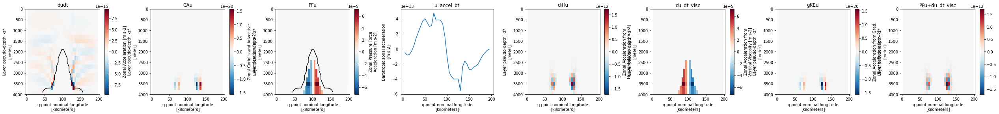

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


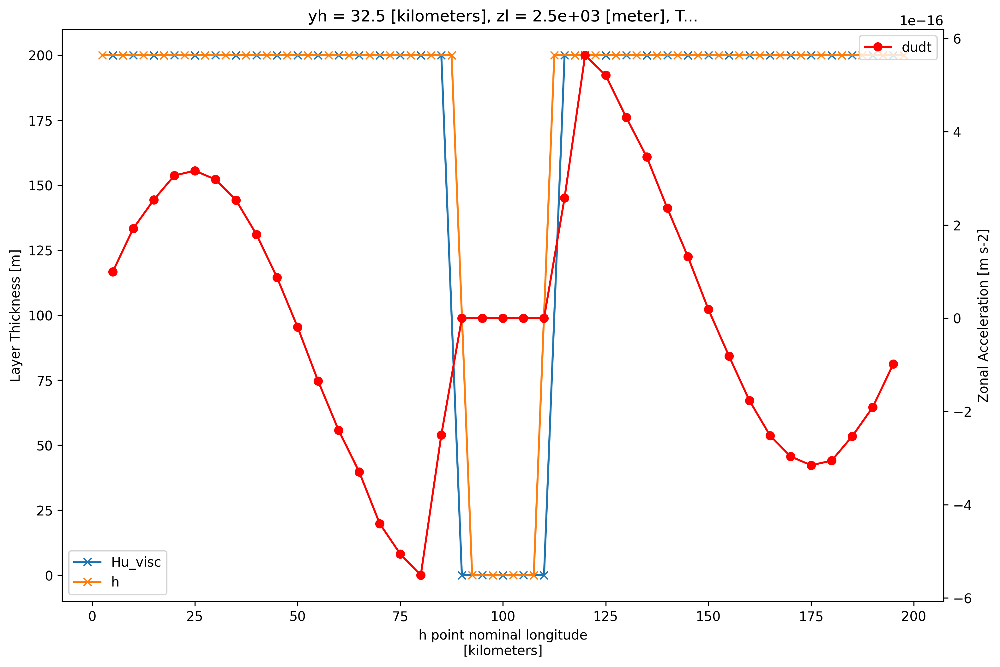

[-0.87055879 -0.87055879 -0.87055879 -0.87055879 -0.87055879 -0.87055879
 -0.87055879 -0.87055879 -0.87055879 -0.87055879 -0.87055879 -0.87055879
 -0.87055879 -0.87055879 -0.87055879 -0.87055879 -0.87055879 -0.87055879
 -0.87055879 -0.87055879 -0.87055879 -0.87055879 -0.87055879 -0.87055879
 -0.87055879 -0.87055879 -0.87055879 -0.87055879 -0.87055879 -0.87055879
 -0.87055879 -0.87055879 -0.87055879 -0.87055879 -0.87055879 -0.87055879
 -0.87055879 -0.87055879 -0.87055879 -0.87055879]


Text(0.5, 1.0, 'SSH')

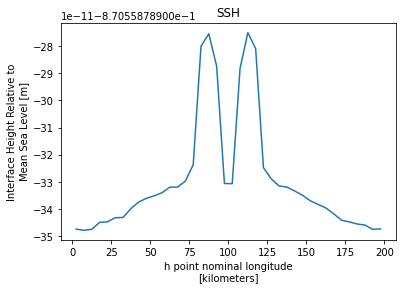

In [267]:
label = 'zstar-isomip-drag-topoflatice'
mom = open_mom(label)
prog = open_files(label)
time = -1
y = 0

fig, axes = plt.subplots(ncols = 8, figsize= (44,4))
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[0], yincrease = False, levels = [199], colors = 'k')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[2], yincrease = False, levels = [199], colors = 'k')
mom.dudt.isel(Time = time, yh = y).plot(ax = axes[0], yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
axes[0].set_title('dudt')

mom.CAu.isel(Time = time, yh = y).plot(ax = axes[1], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[1].set_title('CAu')
mom.PFu.isel(Time = time, yh = y).plot(ax = axes[2], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[2].set_title('PFu')
mom.u_accel_bt.isel(Time = time, yh = y).plot(ax = axes[3])
axes[3].set_title('u_accel_bt')
mom.diffu.isel(Time = time, yh = y).plot(ax = axes[4], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[4].set_title('diffu')
mom.du_dt_visc.isel(Time = time, yh = y).plot(ax = axes[5], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[5].set_title('du_dt_visc')
mom.gKEu.isel(Time = time, yh = y).plot(ax = axes[6], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[6].set_title('gKEu')
(mom.du_dt_visc+mom.PFu-(mom.du_dt_visc+mom.PFu).isel(zl=0)).isel(Time = time, yh = y).plot(ax = axes[7], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[7].set_title('PFu+du_dt_visc')


fig.subplots_adjust(wspace = 0.35)
plt.show()

zl = 2500

fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
visc = xr.open_dataset('archive/visc-'+label+'.nc')
visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = zl, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
prog.h.isel(Time = 0, yh = 0).sel(zl = zl, method = 'nearest').plot(marker = 'x', label = 'h')
ax2 = ax.twinx()
mom.dudt.isel(Time = 0, yh = y).sel(zl = zl, method = 'nearest').plot(ax = ax2, color = 'r', marker = 'o', label = 'dudt')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
#yincrease = False)
ax.legend()
ax2.legend()

plt.show()

# fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
# visc = xr.open_dataset('archive/visc-'+label+'.nc')
# visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = 2000, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
# ax2 = ax.twinx()
# mom.dudt.isel(Time = 0, yh = y).sel(zl = 2000, method = 'nearest').plot(ax = ax2, color = 'r', marker = 'o', label = 'dudt')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
# #yincrease = False)
# ax.legend()
# ax2.legend()
prog.e.isel(zi = 0, Time = 0, yh = 0).plot()
print(prog.e.isel(zi = 0, Time = 0, yh = 0).values)
plt.title('SSH')

In [268]:
900*1/1035

0.8695652173913043

In [269]:
4000-0.87056

3999.12944

to do: make symmetric seamount and seamount ice shelf.

I think I can't get it quite symmetric because ice shelf draft not exactly 900/1035*thick

be careful about what executable i use


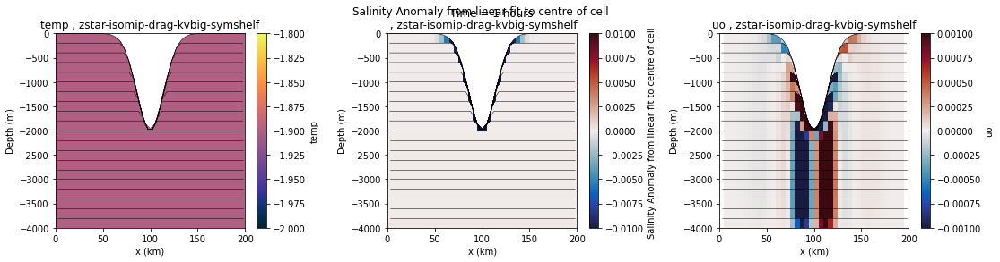

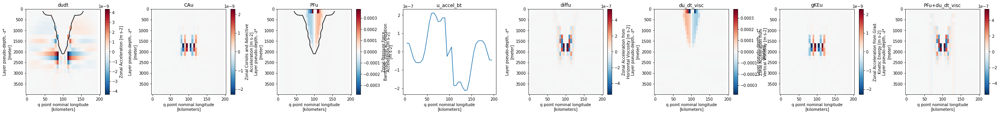

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


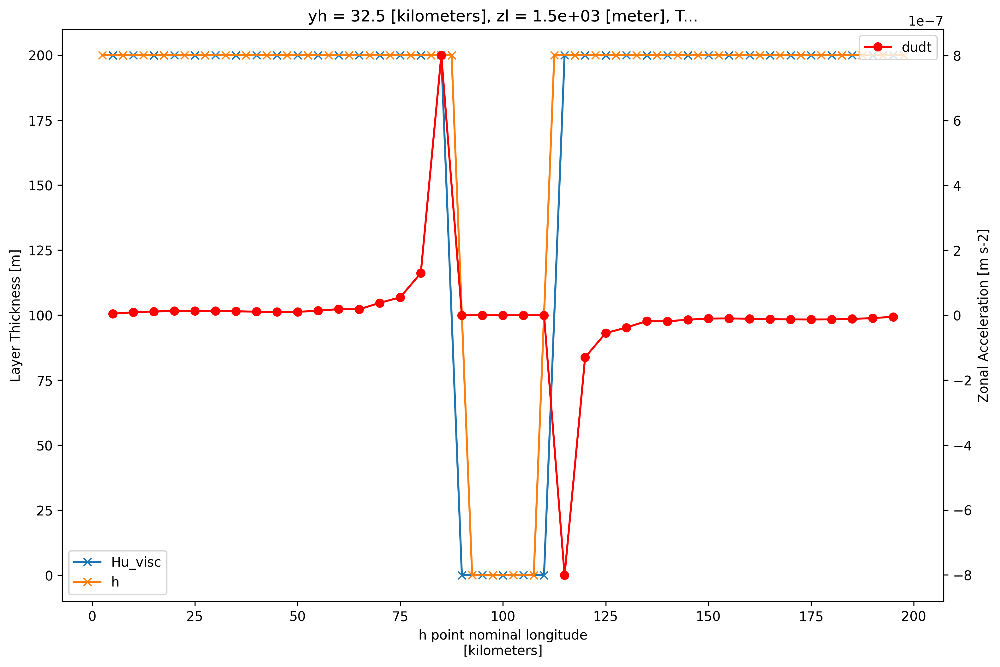

[-1.06573513e-03 -1.01167518e-03 -9.59307547e-04 -1.01280101e-03
 -1.56567638e-03 -4.94726477e-03 -2.36863411e-02 -1.15991608e-01
 -5.16062851e-01 -2.03784349e+00 -7.11016464e+00 -2.18989559e+01
 -5.95264036e+01 -1.42795939e+02 -3.02295388e+02 -5.64750203e+02
 -9.31085061e+02 -1.35466933e+03 -1.73936914e+03 -1.97092289e+03
 -1.97092289e+03 -1.73936914e+03 -1.35466933e+03 -9.31085061e+02
 -5.64750203e+02 -3.02295388e+02 -1.42795939e+02 -5.95264036e+01
 -2.18989559e+01 -7.11016464e+00 -2.03784349e+00 -5.16062851e-01
 -1.15991608e-01 -2.36863411e-02 -4.94726476e-03 -1.56567638e-03
 -1.01280100e-03 -9.59307544e-04 -1.01167518e-03 -1.06573513e-03]


Text(0.5, 1.0, 'SSH')

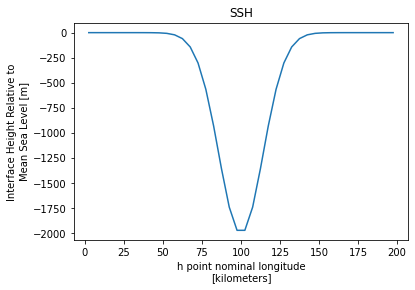

In [270]:
label = 'zstar-isomip-drag-kvbig-symshelf'


fig, axes = plt.subplots(ncols = 3, figsize = (18,4))
prog = open_files(label)
IC = open_IC(label)
x = 0
time = 0#24*5-1
ymax = 4000
plot(axes[0],x,time,0,prog.temp,"temp",-2,-1.8,cm.cm.thermal,ymax)

prog = open_files(label)
IC = open_IC(label)

#plot(axes[1],x,time,0,prog.salt,"salt",33.7,34.6,cm.cm.haline,ymax)
ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-4000) + 33.8
plot(axes[1],x,time,0,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-2,1e-2,cm.cm.balance,ymax)


prog = open_files(label)
IC = open_IC(label)

plot(axes[2],x,time,0,prog.u,"uo",-1e-3,1e-3,cm.cm.balance,ymax)

fig.subplots_adjust(wspace = 0.4)
fig.suptitle('Time = '+str(time+1)+' hours')
plt.show()

mom = open_mom(label)
prog = open_files(label)
time = -1
y = 0

fig, axes = plt.subplots(ncols = 8, figsize= (44,4))
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[0], yincrease = False, levels = [199], colors = 'k')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[2], yincrease = False, levels = [199], colors = 'k')
mom.dudt.isel(Time = time, yh = y).plot(ax = axes[0], yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
axes[0].set_title('dudt')

mom.CAu.isel(Time = time, yh = y).plot(ax = axes[1], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[1].set_title('CAu')
mom.PFu.isel(Time = time, yh = y).plot(ax = axes[2], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[2].set_title('PFu')
mom.u_accel_bt.isel(Time = time, yh = y).plot(ax = axes[3])
axes[3].set_title('u_accel_bt')
mom.diffu.isel(Time = time, yh = y).plot(ax = axes[4], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[4].set_title('diffu')
mom.du_dt_visc.isel(Time = time, yh = y).plot(ax = axes[5], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[5].set_title('du_dt_visc')
mom.gKEu.isel(Time = time, yh = y).plot(ax = axes[6], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[6].set_title('gKEu')
(mom.du_dt_visc+mom.PFu-(mom.du_dt_visc+mom.PFu).isel(zl=0)).isel(Time = time, yh = y).plot(ax = axes[7], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[7].set_title('PFu+du_dt_visc')


fig.subplots_adjust(wspace = 0.35)
plt.show()

zl = 1500

fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
visc = xr.open_dataset('archive/visc-'+label+'.nc')
visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = zl, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
prog.h.isel(Time = 0, yh = 0).sel(zl = zl, method = 'nearest').plot(marker = 'x', label = 'h')
ax2 = ax.twinx()
mom.dudt.isel(Time = 0, yh = y).sel(zl = zl, method = 'nearest').plot(ax = ax2, color = 'r', marker = 'o', label = 'dudt')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
#yincrease = False)
ax.legend()
ax2.legend()

plt.show()

# fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
# visc = xr.open_dataset('archive/visc-'+label+'.nc')
# visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = 2000, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
# ax2 = ax.twinx()
# mom.dudt.isel(Time = 0, yh = y).sel(zl = 2000, method = 'nearest').plot(ax = ax2, color = 'r', marker = 'o', label = 'dudt')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
# #yincrease = False)
# ax.legend()
# ax2.legend()
prog.e.isel(zi = 0, Time = 0, yh = 0).plot()
print(prog.e.isel(zi = 0, Time = 0, yh = 0).values)
plt.title('SSH')

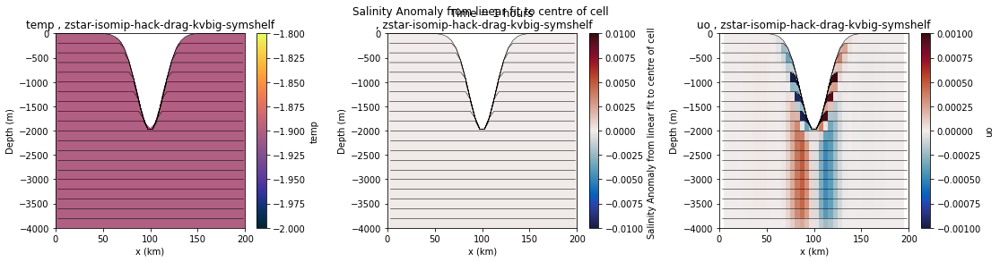

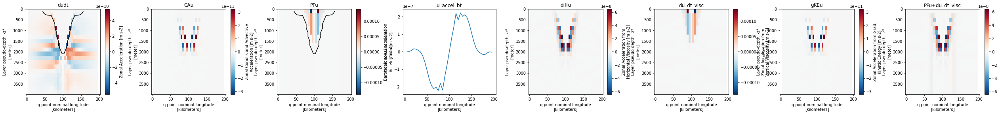

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


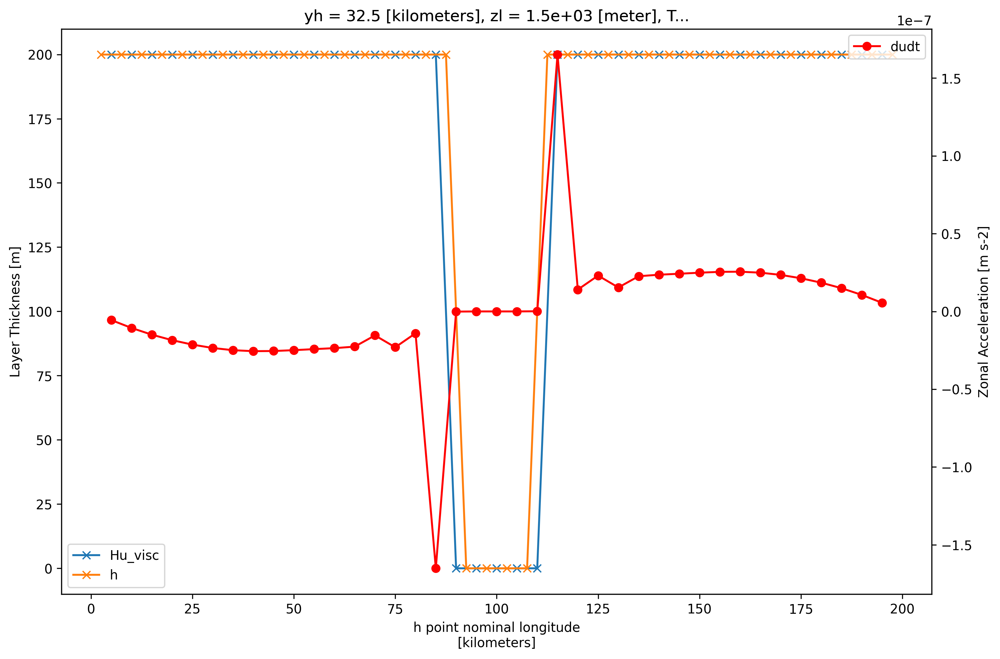

[ 1.39669846e-03  1.38602621e-03  1.35850728e-03  1.26472899e-03
  7.17711755e-04 -2.65067221e-03 -2.14041335e-02 -1.13766901e-01
 -5.13967036e-01 -2.03601518e+00 -7.10883695e+00 -2.18984471e+01
 -5.95270004e+01 -1.42797268e+02 -3.02297549e+02 -5.64752597e+02
 -9.31088496e+02 -1.35467352e+03 -1.73937438e+03 -1.97092784e+03
 -1.97092784e+03 -1.73937438e+03 -1.35467352e+03 -9.31088496e+02
 -5.64752597e+02 -3.02297549e+02 -1.42797268e+02 -5.95270004e+01
 -2.18984471e+01 -7.10883695e+00 -2.03601518e+00 -5.13967036e-01
 -1.13766901e-01 -2.14041335e-02 -2.65067221e-03  7.17711757e-04
  1.26472899e-03  1.35850728e-03  1.38602621e-03  1.39669846e-03]


Text(0.5, 1.0, 'SSH')

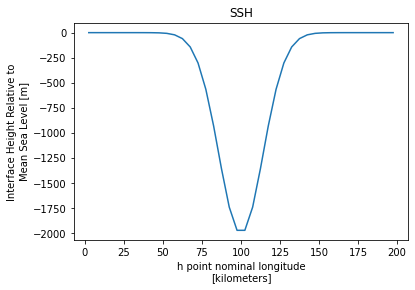

In [271]:
label = 'zstar-isomip-hack-drag-kvbig-symshelf'


fig, axes = plt.subplots(ncols = 3, figsize = (18,4))
prog = open_files(label)
IC = open_IC(label)
x = 0
time = 0#24*5-1
ymax = 4000
plot(axes[0],x,time,0,prog.temp,"temp",-2,-1.8,cm.cm.thermal,ymax)

prog = open_files(label)
IC = open_IC(label)

#plot(axes[1],x,time,0,prog.salt,"salt",33.7,34.6,cm.cm.haline,ymax)
ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-4000) + 33.8
plot(axes[1],x,time,0,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-2,1e-2,cm.cm.balance,ymax)


prog = open_files(label)
IC = open_IC(label)

plot(axes[2],x,time,0,prog.u,"uo",-1e-3,1e-3,cm.cm.balance,ymax)

fig.subplots_adjust(wspace = 0.4)
fig.suptitle('Time = '+str(time+1)+' hours')
plt.show()

mom = open_mom(label)
prog = open_files(label)
time = -1
y = 0

fig, axes = plt.subplots(ncols = 8, figsize= (44,4))
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[0], yincrease = False, levels = [199], colors = 'k')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[2], yincrease = False, levels = [199], colors = 'k')
mom.dudt.isel(Time = time, yh = y).plot(ax = axes[0], yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
axes[0].set_title('dudt')

mom.CAu.isel(Time = time, yh = y).plot(ax = axes[1], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[1].set_title('CAu')
mom.PFu.isel(Time = time, yh = y).plot(ax = axes[2], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[2].set_title('PFu')
mom.u_accel_bt.isel(Time = time, yh = y).plot(ax = axes[3])
axes[3].set_title('u_accel_bt')
mom.diffu.isel(Time = time, yh = y).plot(ax = axes[4], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[4].set_title('diffu')
mom.du_dt_visc.isel(Time = time, yh = y).plot(ax = axes[5], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[5].set_title('du_dt_visc')
mom.gKEu.isel(Time = time, yh = y).plot(ax = axes[6], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[6].set_title('gKEu')
(mom.du_dt_visc+mom.PFu-(mom.du_dt_visc+mom.PFu).isel(zl=0)).isel(Time = time, yh = y).plot(ax = axes[7], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[7].set_title('PFu+du_dt_visc')


fig.subplots_adjust(wspace = 0.35)
plt.show()

zl = 1500

fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
visc = xr.open_dataset('archive/visc-'+label+'.nc')
visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = zl, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
prog.h.isel(Time = 0, yh = 0).sel(zl = zl, method = 'nearest').plot(marker = 'x', label = 'h')
ax2 = ax.twinx()
mom.dudt.isel(Time = 0, yh = y).sel(zl = zl, method = 'nearest').plot(ax = ax2, color = 'r', marker = 'o', label = 'dudt')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
#yincrease = False)
ax.legend()
ax2.legend()

plt.show()

# fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
# visc = xr.open_dataset('archive/visc-'+label+'.nc')
# visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = 2000, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
# ax2 = ax.twinx()
# mom.dudt.isel(Time = 0, yh = y).sel(zl = 2000, method = 'nearest').plot(ax = ax2, color = 'r', marker = 'o', label = 'dudt')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
# #yincrease = False)
# ax.legend()
# ax2.legend()
prog.e.isel(zi = 0, Time = 0, yh = 0).plot()
print(prog.e.isel(zi = 0, Time = 0, yh = 0).values)
plt.title('SSH')

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


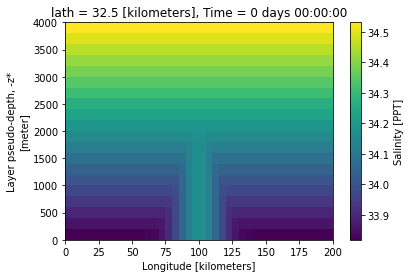

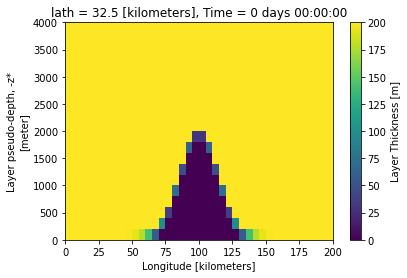

In [8]:
label1 = 'zstar-isomip-hack-drag-kvbig-symshelf_v2'
label2 = 'zstar-isomip-hack-drag-kvbig-symshelf-topo'

IC1 = open_IC(label1)
IC2 = open_IC(label2)
prog1 = open_files(label1)
prog2 = open_files(label2)
visc1 = open_visc(label1)
visc2 = open_visc(label2)
mom1 = open_mom(label1)
mom2 = open_mom(label2)

IC1.Salt.isel(lath = 0).plot()
plt.show()
IC1.h.isel(lath = 0).plot()
plt.show()

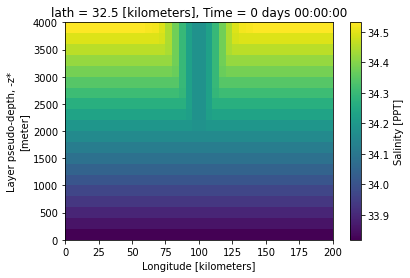

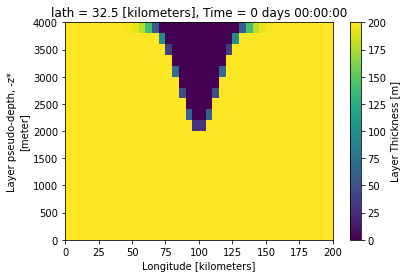

In [9]:
IC2.Salt.isel(lath = 0).plot()
plt.show()
IC2.h.isel(lath = 0).plot()
plt.show()

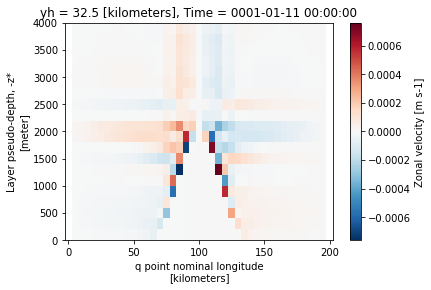

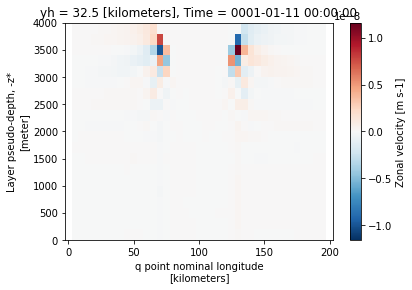

In [10]:
prog1.u.isel(Time = -1, yh = 0).plot()
plt.show()
prog2.u.isel(Time = -1, yh = 0).plot()
plt.show()


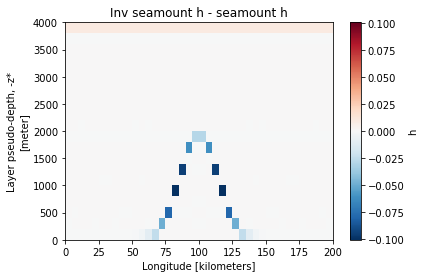

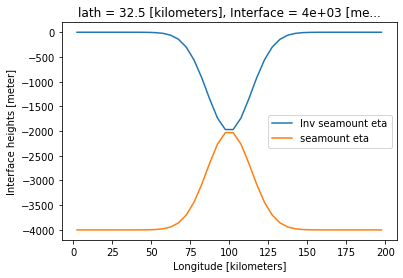

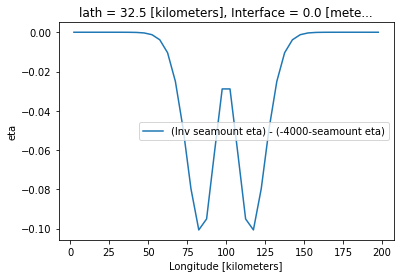

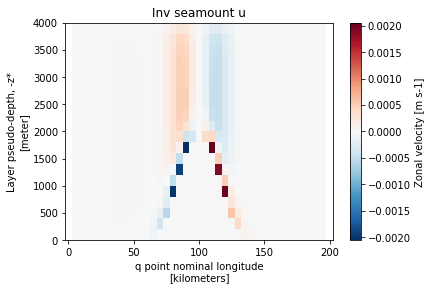

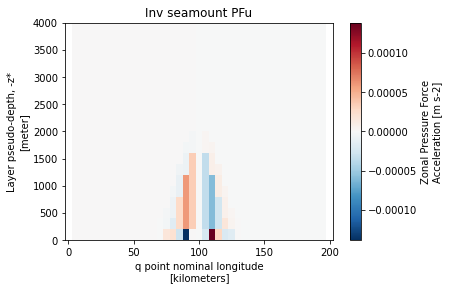

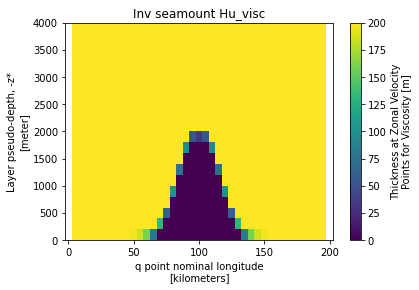

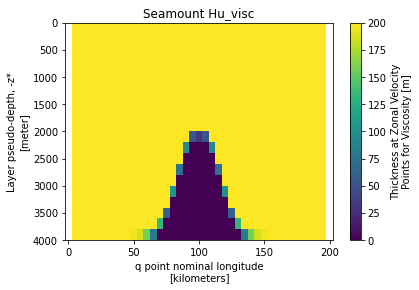

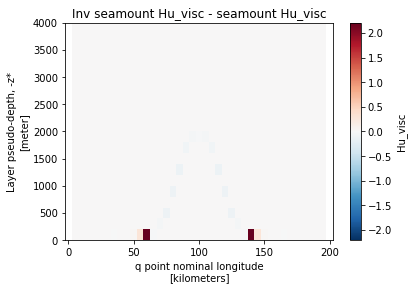

In [12]:
(IC1.h.isel(lath = 0,Time = 0)-np.flip(IC2.h.isel(lath = 0,Time = 0).values,axis = 0)).plot()
plt.title('Inv seamount h - seamount h')
plt.show()
IC1.eta.isel(lath = 0,Time = 0,Interface=0).plot(label = 'Inv seamount eta')
IC2.eta.isel(lath = 0,Time = 0,Interface=-1).plot(label = 'seamount eta')
plt.legend()
plt.show()

(IC1.eta.isel(lath = 0,Time = 0,Interface=0)-(-4000-IC2.eta.isel(lath = 0,Time = 0,Interface=-1)).values).plot(
    label = '(Inv seamount eta) - (-4000-seamount eta)')
plt.legend()
plt.show()

(prog1.u.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount u')
plt.show()

(mom1.PFu.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount PFu')
plt.show()


(visc1.Hu_visc.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount Hu_visc')
plt.show()

(visc2.Hu_visc.isel(yh = 0,Time = 0)).plot(yincrease = False)
plt.title('Seamount Hu_visc')
plt.show()


(visc1.Hu_visc.isel(yh = 0,Time = 0)-np.flip(visc2.Hu_visc.isel(yh = 0,Time = 0).values,axis = 0)).plot()
plt.title('Inv seamount Hu_visc - seamount Hu_visc')
plt.show()


Text(0.5, 1.0, 'Inv seamount S - seamount S')

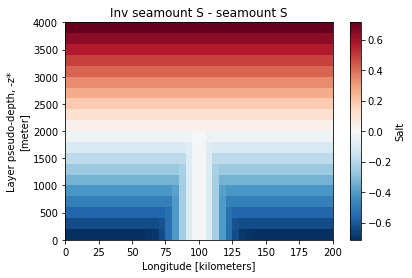

In [8]:
(IC1.Salt.isel(lath = 0,Time = 0)-np.flip(IC2.Salt.isel(lath = 0,Time = 0).values,axis = 0)).plot()
plt.title('Inv seamount S - seamount S')

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


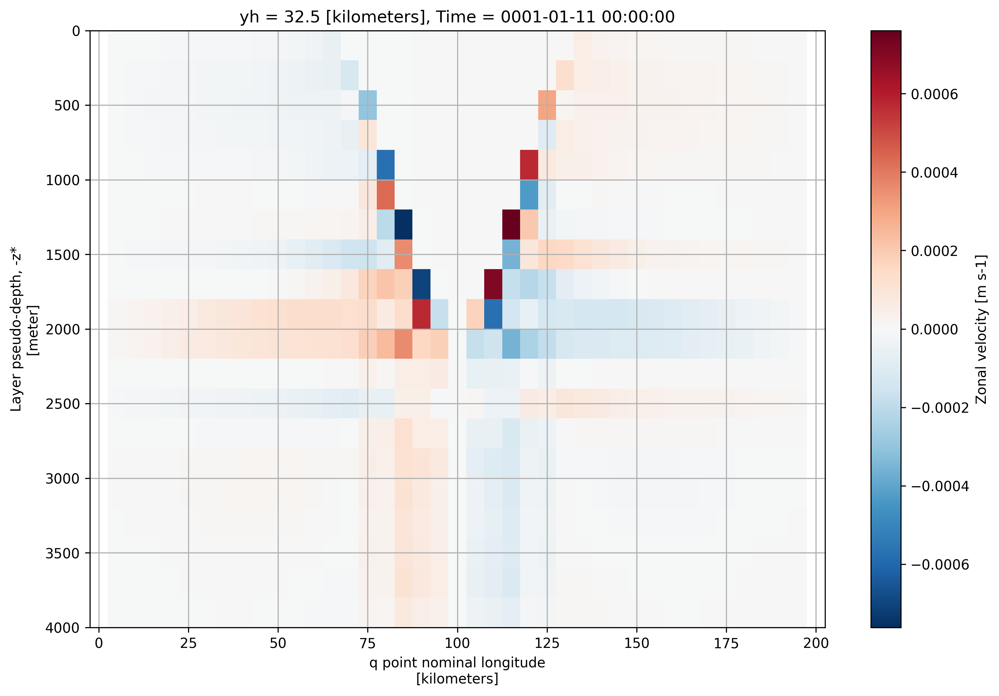

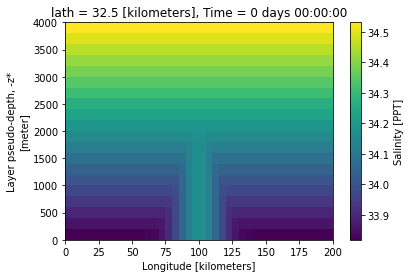

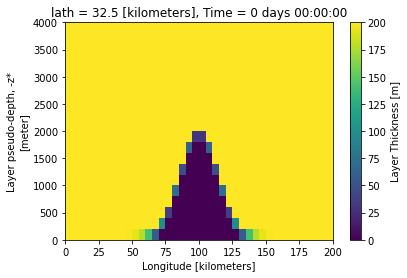

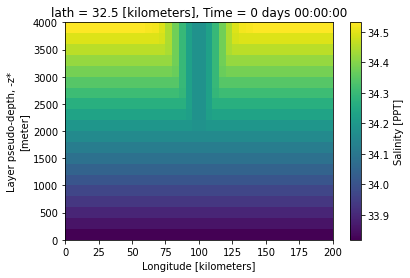

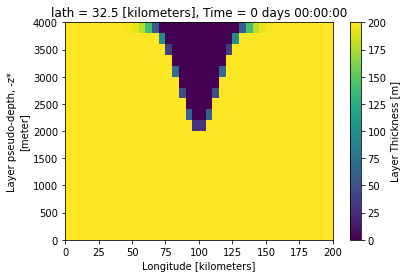

...

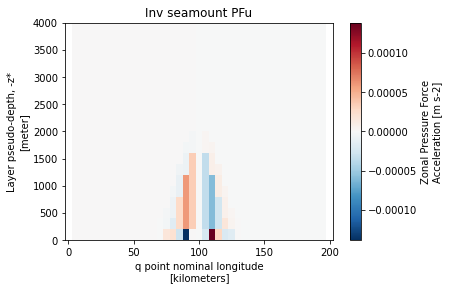

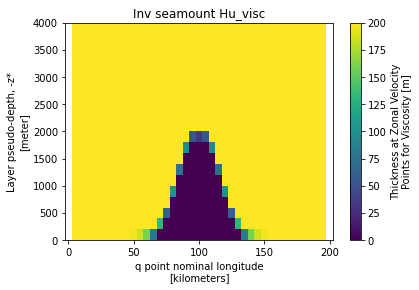

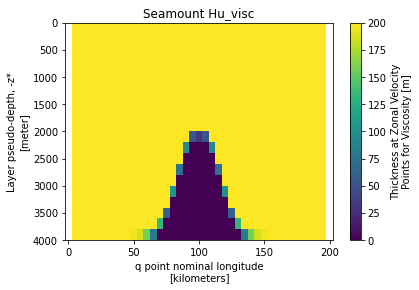

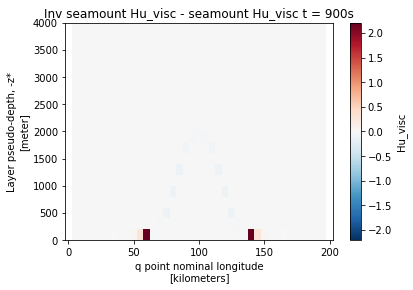

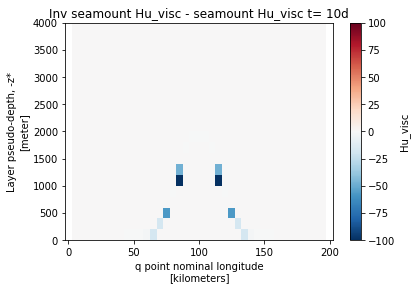

In [73]:
label1 = 'zstar-isomip-hack-drag-kvbig-symshelf_v2' # this has rho_0 = 1034 instead of 1035
label2 = 'zstar-isomip-hack-drag-kvbig-symshelf-topo0'#this has zero thickness for top ice shelf

IC1 = open_IC(label1)
IC2 = open_IC(label2)
prog1 = open_files(label1)
prog2 = open_files(label2)
visc1 = open_visc(label1)
visc2 = open_visc(label2)
mom1 = open_mom(label1)
mom2 = open_mom(label2)
fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
prog1.u.isel(Time = -1, yh = y).plot(yincrease = False)
plt.grid()
plt.show()

IC1.Salt.isel(lath = 0).plot()
plt.show()
IC1.h.isel(lath = 0).plot()
plt.show()
IC2.Salt.isel(lath = 0).plot()
plt.show()
IC2.h.isel(lath = 0).plot()
plt.show()
prog1.u.isel(Time = -1, yh = 0).plot()
plt.show()
prog2.u.isel(Time = -1, yh = 0).plot()
plt.show()
(IC1.h.isel(lath = 0,Time = 0)-np.flip(IC2.h.isel(lath = 0,Time = 0).values,axis = 0)).plot()
plt.title('Inv seamount h - seamount h')
plt.show()
IC1.eta.isel(lath = 0,Time = 0,Interface=0).plot(label = 'Inv seamount eta')
IC2.eta.isel(lath = 0,Time = 0,Interface=-1).plot(label = 'seamount eta')
plt.legend()
plt.show()

(IC1.eta.isel(lath = 0,Time = 0,Interface=0)-(-4000-IC2.eta.isel(lath = 0,Time = 0,Interface=-1)).values).plot(
    label = '(Inv seamount eta) - (-4000-seamount eta)')
plt.legend()
plt.show()

(prog1.u.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount u')
plt.show()

(mom1.PFu.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount PFu')
plt.show()


(visc1.Hu_visc.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount Hu_visc')
plt.show()
(visc2.Hu_visc.isel(yh = 0,Time = 0)).plot(yincrease = False)
plt.title('Seamount Hu_visc')
plt.show()

(visc1.Hu_visc.isel(yh = 0,Time = 0)-np.flip(visc2.Hu_visc.isel(yh = 0,Time = 0).values,axis = 0)).plot()
plt.title('Inv seamount Hu_visc - seamount Hu_visc t = 900s')
plt.show()

(visc1.Hu_visc.isel(yh = 0,Time = -1)-np.flip(visc2.Hu_visc.isel(yh = 0,Time = -1).values,axis = 0)).plot()
plt.title('Inv seamount Hu_visc - seamount Hu_visc t= 10d')
plt.show()


/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


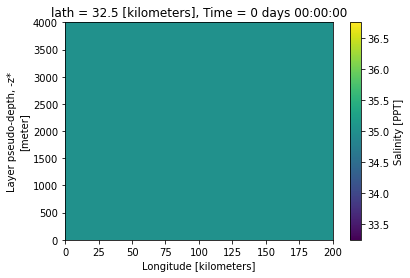

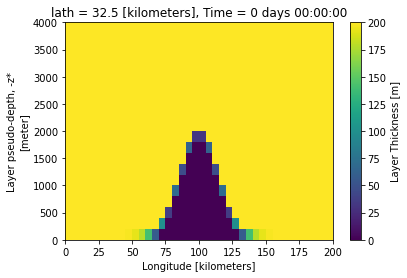

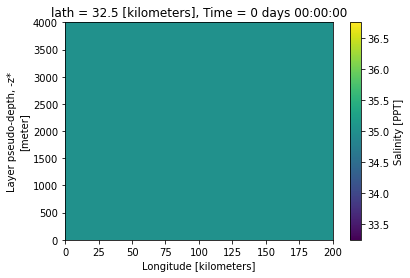

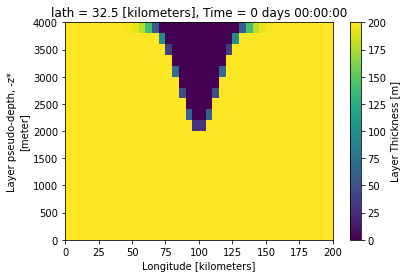

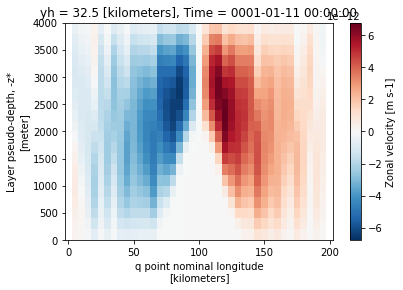

...

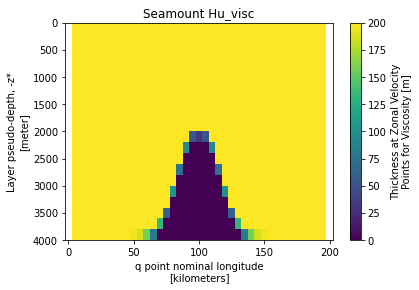

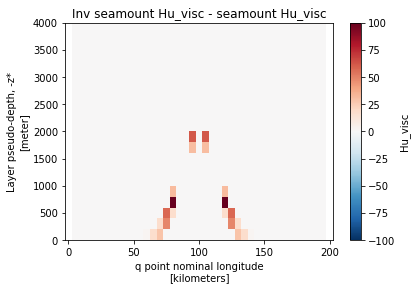

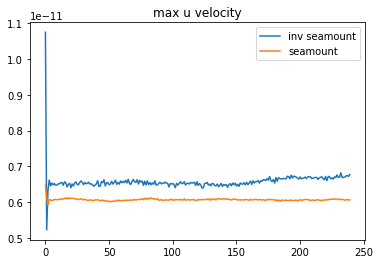

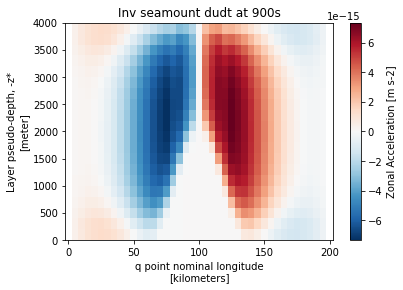

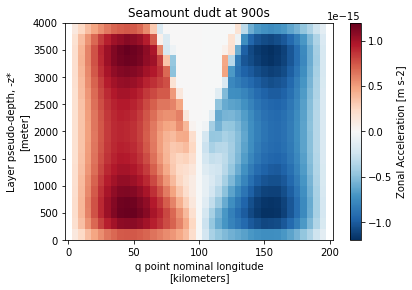

In [29]:
label1 = 'zstar-isomip-drag-kvbig-symshelf-S35'
label2 = 'zstar-isomip-drag-kvbig-symshelf-topo0-S35'

IC1 = open_IC(label1)
IC2 = open_IC(label2)
prog1 = open_files(label1)
prog2 = open_files(label2)
visc1 = open_visc(label1)
visc2 = open_visc(label2)
mom1 = open_mom(label1)
mom2 = open_mom(label2)

IC1.Salt.isel(lath = 0).plot()
plt.show()
IC1.h.isel(lath = 0).plot()
plt.show()
IC2.Salt.isel(lath = 0).plot()
plt.show()
IC2.h.isel(lath = 0).plot()
plt.show()
prog1.u.isel(Time = -1, yh = 0).plot()
plt.show()
prog2.u.isel(Time = -1, yh = 0).plot()
plt.show()
(IC1.h.isel(lath = 0,Time = 0)-np.flip(IC2.h.isel(lath = 0,Time = 0).values,axis = 0)).plot()
plt.title('Inv seamount h - seamount h')
plt.show()
IC1.eta.isel(lath = 0,Time = 0,Interface=0).plot(label = 'Inv seamount eta')
IC2.eta.isel(lath = 0,Time = 0,Interface=-1).plot(label = 'seamount eta')
plt.legend()
plt.show()

(IC1.eta.isel(lath = 0,Time = 0,Interface=0)-(-4000-IC2.eta.isel(lath = 0,Time = 0,Interface=-1)).values).plot(
    label = '(Inv seamount eta) - (-4000-seamount eta)')
plt.legend()
plt.show()

(prog1.u.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount u')
plt.show()

(mom1.PFu.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount PFu')
plt.show()


(visc1.Hu_visc.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount Hu_visc')
plt.show()
(visc2.Hu_visc.isel(yh = 0,Time = 0)).plot(yincrease = False)
plt.title('Seamount Hu_visc')
plt.show()

(visc1.Hu_visc.isel(yh = 0,Time = 0)-np.flip(visc2.Hu_visc.isel(yh = 0,Time = 0).values,axis = 0)).plot()
plt.title('Inv seamount Hu_visc - seamount Hu_visc')
plt.show()

plt.plot(np.arange(len(prog1.Time)),prog1.u.max(['xq','yh','zl']),label = 'inv seamount')
plt.plot(np.arange(len(prog2.Time)),prog2.u.max(['xq','yh','zl']),label = 'seamount')
plt.legend()
plt.title('max u velocity')
plt.show()

mom1.dudt.isel(Time = 0, yh = 0).plot()
plt.title('Inv seamount dudt at 900s')
plt.show()
mom2.dudt.isel(Time = 0, yh = 0).plot()
plt.title('Seamount dudt at 900s')
plt.show()


In [5]:
IC1

<xarray.Dataset>
Dimensions:          (lath: 2, lonh: 40, latq: 3, lonq: 41, Layer: 20,
                      Interface: 21, Time: 1)
Coordinates:
  * lath             (lath) float64 32.5 37.5
  * lonh             (lonh) float64 2.5 7.5 12.5 17.5 ... 187.5 192.5 197.5
  * latq             (latq) float64 30.0 35.0 40.0
  * lonq             (lonq) float64 0.0 5.0 10.0 15.0 ... 190.0 195.0 200.0
  * Layer            (Layer) float64 100.0 300.0 500.0 ... 3.7e+03 3.9e+03
  * Interface        (Interface) float64 0.0 200.0 400.0 ... 3.8e+03 4e+03
  * Time             (Time) timedelta64[ns] 00:00:00
Data variables: (12/22)
    Temp             (Time, Layer, lath, lonh) float64 ...
    Salt             (Time, Layer, lath, lonh) float64 ...
    h                (Time, Layer, lath, lonh) float64 ...
    u                (Time, Layer, lath, lonq) float64 ...
    v                (Time, Layer, latq, lonh) float64 ...
    p_surf_EOS       (Time, lath, lonh) float64 ...
    ...               ...
    ubtav            (Time, lath, lonq) float64 ...
    vbtav            (Time, latq, lonh) float64 ...
    DTBT             (Time) timedelta64[ns] ...
    u_taux_shelf     (Time, lath, lonq) float64 ...
    v_tauy_shelf     (Time, latq, lonh) float64 ...
    eta              (Time, Interface, lath, lonh) float64 ...
Attributes:
    filename:  ./MOM_IC.nc

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


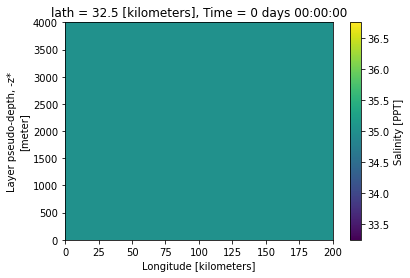

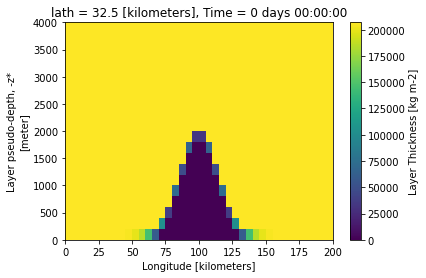

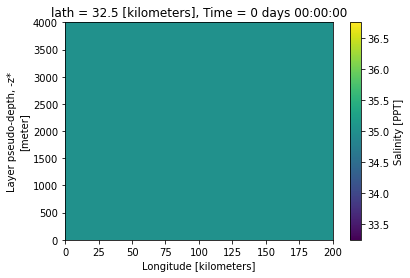

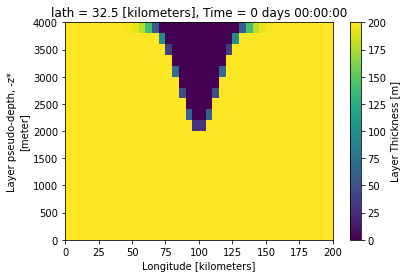

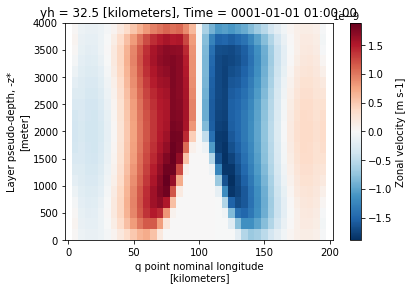

...

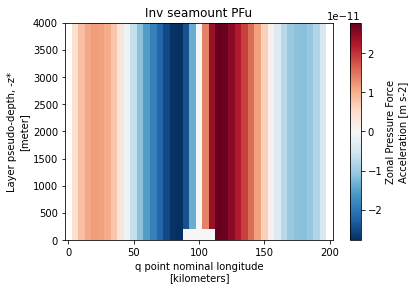

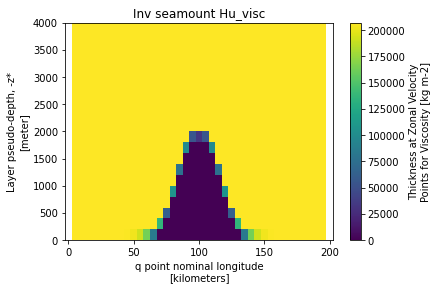

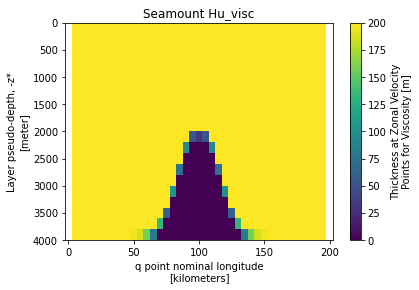

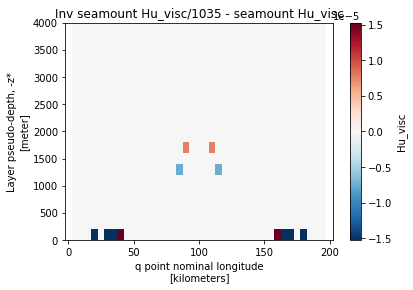

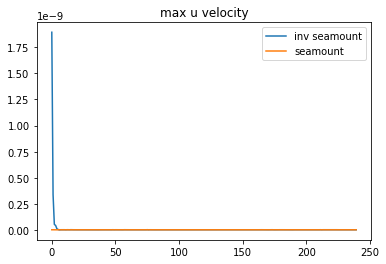

In [24]:
label1 = 'zstar-isomip-drag-kvbig-symshelf-nonbouss-S35'
label2 = 'zstar-isomip-drag-kvbig-symshelf-topo0-S35'

IC1 = open_IC(label1)
IC2 = open_IC(label2)
prog1 = open_files(label1)
prog2 = open_files(label2)
visc1 = open_visc(label1)
visc2 = open_visc(label2)
mom1 = open_mom(label1)
mom2 = open_mom(label2)

IC1.Salt.isel(lath = 0).plot()
plt.show()
IC1.h.isel(lath = 0).plot()
plt.show()
IC2.Salt.isel(lath = 0).plot()
plt.show()
IC2.h.isel(lath = 0).plot()
plt.show()
prog1.u.isel(Time = 0, yh = 0).plot()
plt.show()
prog2.u.isel(Time = 0, yh = 0).plot()
plt.show()
(IC1.h.isel(lath = 0,Time = 0)/1035-np.flip(IC2.h.isel(lath = 0,Time = 0).values,axis = 0)).plot()
plt.title('Inv seamount h/1035 - seamount h')
plt.show()
IC1.eta.isel(lath = 0,Time = 0,Interface=0).plot(label = 'Inv seamount eta')
IC2.eta.isel(lath = 0,Time = 0,Interface=-1).plot(label = 'seamount eta')
plt.legend()
plt.show()

(IC1.eta.isel(lath = 0,Time = 0,Interface=0)-(-4000-IC2.eta.isel(lath = 0,Time = 0,Interface=-1)).values).plot(
    label = '(Inv seamount eta) - (-4000-seamount eta)')
plt.legend()
plt.show()

(prog1.u.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount u')
plt.show()

(mom1.PFu.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount PFu')
plt.show()


(visc1.Hu_visc.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount Hu_visc')
plt.show()
(visc2.Hu_visc.isel(yh = 0,Time = 0)).plot(yincrease = False)
plt.title('Seamount Hu_visc')
plt.show()

(visc1.Hu_visc.isel(yh = 0,Time = 0)/1035-np.flip(visc2.Hu_visc.isel(yh = 0,Time = 0).values,axis = 0)).plot()
plt.title('Inv seamount Hu_visc/1035 - seamount Hu_visc')
plt.show()

plt.plot(np.arange(len(prog1.Time)),prog1.u.max(['xq','yh','zl']),label = 'inv seamount')
plt.plot(np.arange(len(prog2.Time)),prog2.u.max(['xq','yh','zl']),label = 'seamount')
plt.legend()
plt.title('max u velocity')
plt.show()


/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


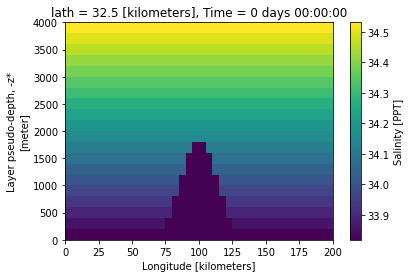

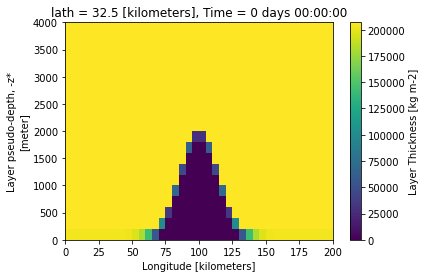

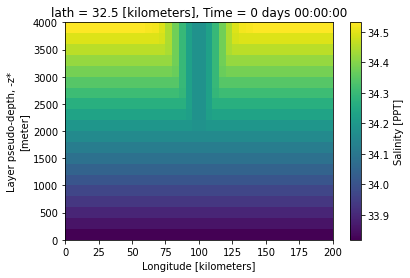

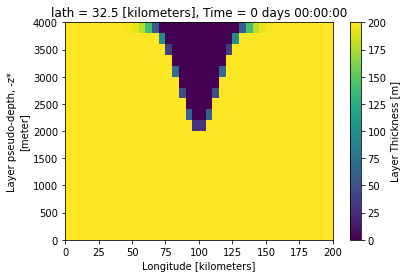

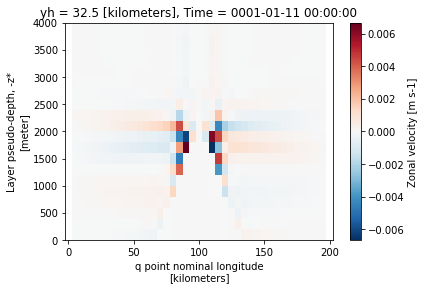

...

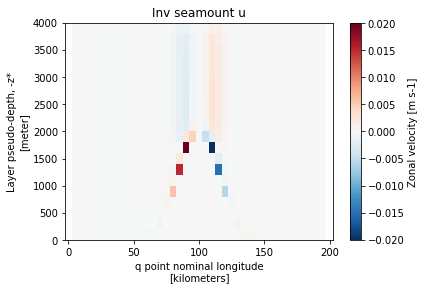

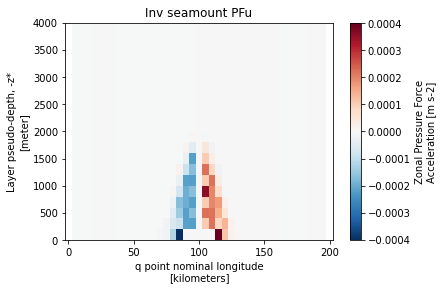

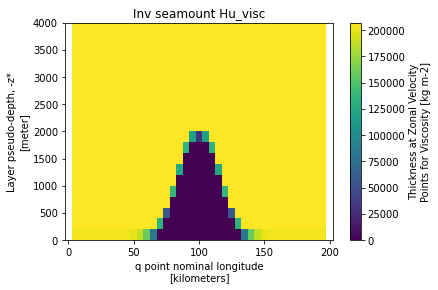

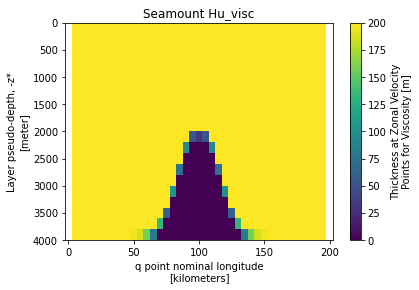

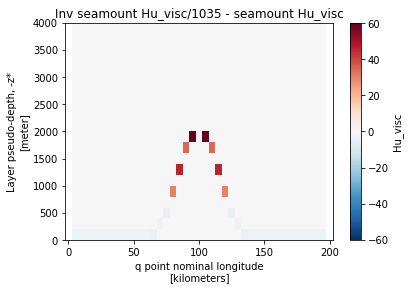

In [9]:
label1 = 'zstar-isomip-drag-kvbig-symshelf-nonbouss'
label2 = 'zstar-isomip-drag-kvbig-symshelf-topo0'

IC1 = open_IC(label1)
IC2 = open_IC(label2)
prog1 = open_files(label1)
prog2 = open_files(label2)
visc1 = open_visc(label1)
visc2 = open_visc(label2)
mom1 = open_mom(label1)
mom2 = open_mom(label2)

IC1.Salt.isel(lath = 0).plot()
plt.show()
IC1.h.isel(lath = 0).plot()
plt.show()
IC2.Salt.isel(lath = 0).plot()
plt.show()
IC2.h.isel(lath = 0).plot()
plt.show()
prog1.u.isel(Time = -1, yh = 0).plot()
plt.show()
prog2.u.isel(Time = -1, yh = 0).plot()
plt.show()
(IC1.h.isel(lath = 0,Time = 0)/1035-np.flip(IC2.h.isel(lath = 0,Time = 0).values,axis = 0)).plot()
plt.title('Inv seamount h/1035 - seamount h')
plt.show()
IC1.eta.isel(lath = 0,Time = 0,Interface=0).plot(label = 'Inv seamount eta')
IC2.eta.isel(lath = 0,Time = 0,Interface=-1).plot(label = 'seamount eta')
plt.legend()
plt.show()

(IC1.eta.isel(lath = 0,Time = 0,Interface=0)-(-4000-IC2.eta.isel(lath = 0,Time = 0,Interface=-1)).values).plot(
    label = '(Inv seamount eta) - (-4000-seamount eta)')
plt.legend()
plt.show()

(prog1.u.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount u')
plt.show()

(mom1.PFu.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount PFu')
plt.show()


(visc1.Hu_visc.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount Hu_visc')
plt.show()
(visc2.Hu_visc.isel(yh = 0,Time = 0)).plot(yincrease = False)
plt.title('Seamount Hu_visc')
plt.show()

(visc1.Hu_visc.isel(yh = 0,Time = 0)/1035-np.flip(visc2.Hu_visc.isel(yh = 0,Time = 0).values,axis = 0)).plot()
plt.title('Inv seamount Hu_visc/1035 - seamount Hu_visc')
plt.show()


In [ ]:
label1 = 'zstar-isomip-drag-kvbig-symshelf'
label2 = 'zstar-isomip-drag-kvbig-symshelf-topo'

IC1 = open_IC(label1)
IC2 = open_IC(label2)
prog1 = open_files(label1)
prog2 = open_files(label2)
visc1 = open_visc(label1)
visc2 = open_visc(label2)
mom1 = open_mom(label1)
mom2 = open_mom(label2)

IC1.Salt.isel(lath = 0).plot()
plt.show()
IC1.h.isel(lath = 0).plot()
plt.show()
IC2.Salt.isel(lath = 0).plot()
plt.show()
IC2.h.isel(lath = 0).plot()
plt.show()
prog1.u.isel(Time = -1, yh = 0).plot()
plt.show()
prog2.u.isel(Time = -1, yh = 0).plot()
plt.show()
(IC1.h.isel(lath = 0,Time = 0)-np.flip(IC2.h.isel(lath = 0,Time = 0).values,axis = 0)).plot()
plt.title('Inv seamount h - seamount h')
plt.show()
IC1.eta.isel(lath = 0,Time = 0,Interface=0).plot(label = 'Inv seamount eta')
IC2.eta.isel(lath = 0,Time = 0,Interface=-1).plot(label = 'seamount eta')
plt.legend()
plt.show()

(IC1.eta.isel(lath = 0,Time = 0,Interface=0)-(-4000-IC2.eta.isel(lath = 0,Time = 0,Interface=-1)).values).plot(
    label = '(Inv seamount eta) - (-4000-seamount eta)')
plt.legend()
plt.show()

(prog1.u.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount u')
plt.show()

(mom1.PFu.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount PFu')
plt.show()


(visc1.Hu_visc.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount Hu_visc')
plt.show()
(visc2.Hu_visc.isel(yh = 0,Time = 0)).plot(yincrease = False)
plt.title('Seamount Hu_visc')
plt.show()

(visc1.Hu_visc.isel(yh = 0,Time = 0)-np.flip(visc2.Hu_visc.isel(yh = 0,Time = 0).values,axis = 0)).plot()
plt.title('Inv seamount Hu_visc - seamount Hu_visc')
plt.show()

np.log10(visc1.au_visc.isel(yh = 0,Time = 0)-np.flip(visc2.au_visc.isel(yh = 0,Time = 0).values,axis = 0)).plot()
plt.title('Inv seamount au_visc - seamount au_visc')
plt.show()


/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


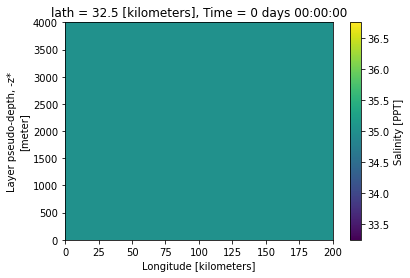

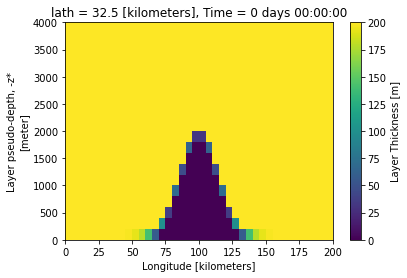

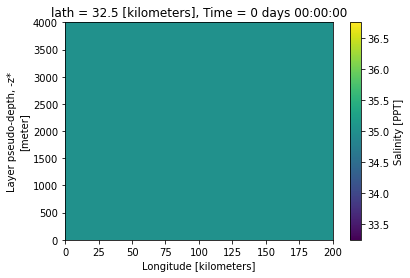

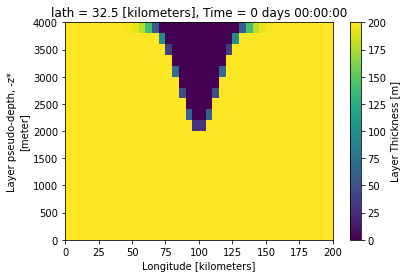

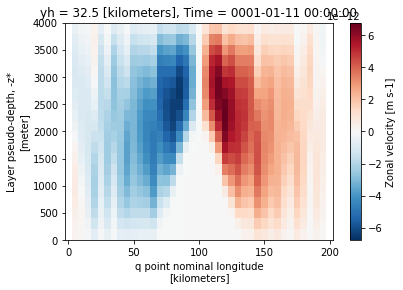

...

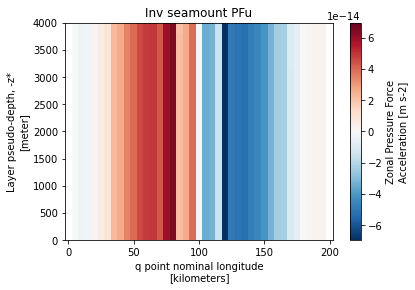

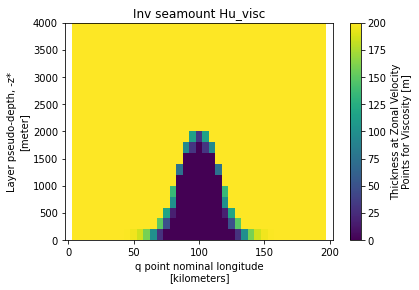

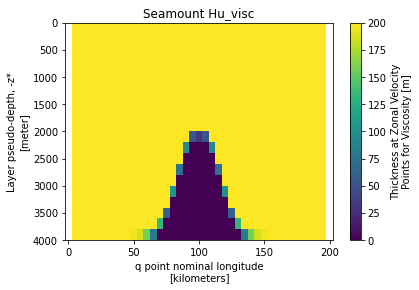

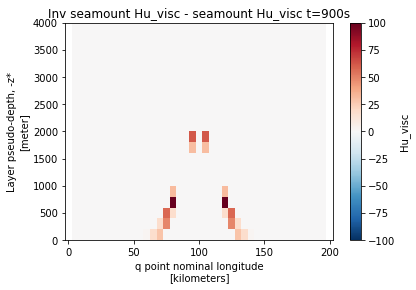

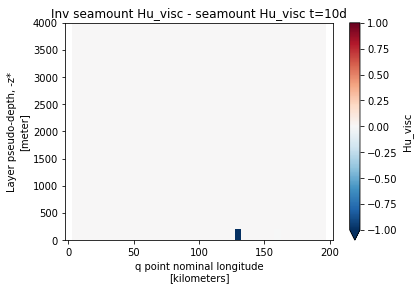

In [40]:
label1 = 'zstar-isomip-drag-kvbig-symshelf-S35'
label2 = 'zstar-isomip-drag-kvbig-symshelf-topo0-S35'

IC1 = open_IC(label1)
IC2 = open_IC(label2)
prog1 = open_files(label1)
prog2 = open_files(label2)
visc1 = open_visc(label1)
visc2 = open_visc(label2)
mom1 = open_mom(label1)
mom2 = open_mom(label2)

IC1.Salt.isel(lath = 0).plot()
plt.show()
IC1.h.isel(lath = 0).plot()
plt.show()
IC2.Salt.isel(lath = 0).plot()
plt.show()
IC2.h.isel(lath = 0).plot()
plt.show()
prog1.u.isel(Time = -1, yh = 0).plot()
plt.show()
prog2.u.isel(Time = -1, yh = 0).plot()
plt.show()
(IC1.h.isel(lath = 0,Time = 0)-np.flip(IC2.h.isel(lath = 0,Time = 0).values,axis = 0)).plot()
plt.title('Inv seamount h - seamount h')
plt.show()
IC1.eta.isel(lath = 0,Time = 0,Interface=0).plot(label = 'Inv seamount eta')
IC2.eta.isel(lath = 0,Time = 0,Interface=-1).plot(label = 'seamount eta')
plt.legend()
plt.show()

(IC1.eta.isel(lath = 0,Time = 0,Interface=0)-(-4000-IC2.eta.isel(lath = 0,Time = 0,Interface=-1)).values).plot(
    label = '(Inv seamount eta) - (-4000-seamount eta)')
plt.legend()
plt.show()

(prog1.u.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount u')
plt.show()

(mom1.PFu.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount PFu')
plt.show()


(visc1.Hu_visc.isel(yh = 0,Time = 0)).plot()
plt.title('Inv seamount Hu_visc')
plt.show()
(visc2.Hu_visc.isel(yh = 0,Time = 0)).plot(yincrease = False)
plt.title('Seamount Hu_visc')
plt.show()

(visc1.Hu_visc.isel(yh = 0,Time = 0)-np.flip(visc2.Hu_visc.isel(yh = 0,Time = 0).values,axis = 0)).plot()
plt.title('Inv seamount Hu_visc - seamount Hu_visc t=900s')
plt.show()

(visc1.Hu_visc.isel(yh = 0,Time = -1)-np.flip(visc2.Hu_visc.isel(yh = 0,Time = -1).values,axis = 0)).plot(vmax = 1)
plt.title('Inv seamount Hu_visc - seamount Hu_visc t=10d')
plt.show()


In [27]:
prog1.Rml.max().values

array(1035.)

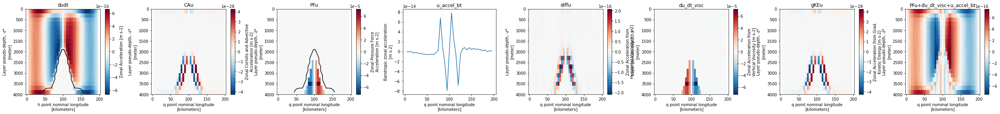

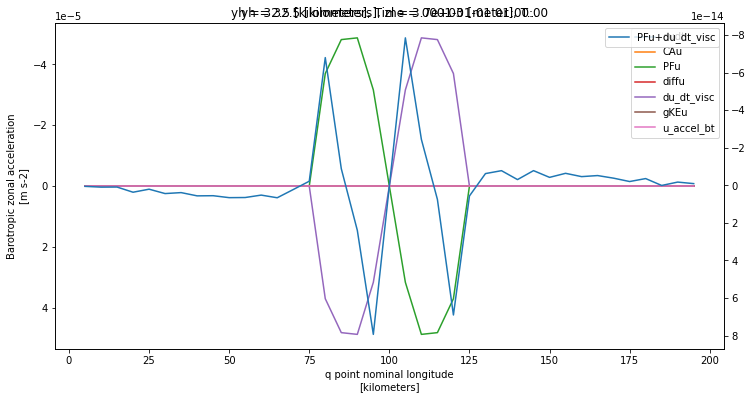

In [30]:
label = 'zstar-isomip-hack-drag-kvbig-symshelf-topo0'
mom = open_mom(label)
prog = open_files(label)
time = 0
y = 0

fig, axes = plt.subplots(ncols = 8, figsize= (44,4))
mom.dudt.isel(Time = time, yh = y).plot(ax = axes[0], yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[0], yincrease = False, levels = [199], colors = 'k')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[2], yincrease = False, levels = [199], colors = 'k')
axes[0].set_title('dudt')

mom.CAu.isel(Time = time, yh = y).plot(ax = axes[1], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[1].set_title('CAu')
mom.PFu.isel(Time = time, yh = y).plot(ax = axes[2], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[2].set_title('PFu')
mom.u_accel_bt.isel(Time = time, yh = y).plot(ax = axes[3])
axes[3].set_title('u_accel_bt')
mom.diffu.isel(Time = time, yh = y).plot(ax = axes[4], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[4].set_title('diffu')
mom.du_dt_visc.isel(Time = time, yh = y).plot(ax = axes[5], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[5].set_title('du_dt_visc')
mom.gKEu.isel(Time = time, yh = y).plot(ax = axes[6], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[6].set_title('gKEu')
(mom.du_dt_visc+mom.PFu+mom.u_accel_bt).isel(Time = time, yh = y).plot(ax = axes[7], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[7].set_title('PFu+du_dt_visc+u_accel_bt')


fig.subplots_adjust(wspace = 0.35)
plt.show()

depth = 3600
fig, ax = plt.subplots(figsize = (12,6))
for term in ['dudt','CAu','PFu','diffu','du_dt_visc','gKEu']:
    mom[term].isel(Time = time, yh = y).sel(zl = depth, method = 'nearest').plot(yincrease = False, label = term)
term = 'u_accel_bt'
mom[term].isel(Time = time, yh = y).plot(yincrease = False, label = term)
plt.legend()
ax2 = ax.twinx()
(mom['du_dt_visc']+mom['PFu']).isel(Time = time, yh = y).sel(zl = depth, method = 'nearest').plot(ax = ax2,yincrease = False, label = 'PFu+du_dt_visc')
plt.legend()

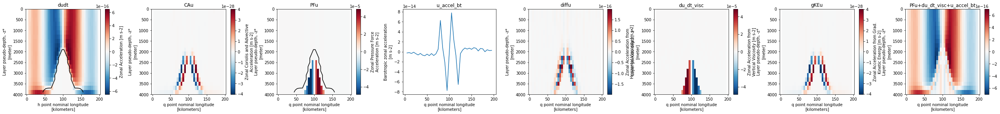

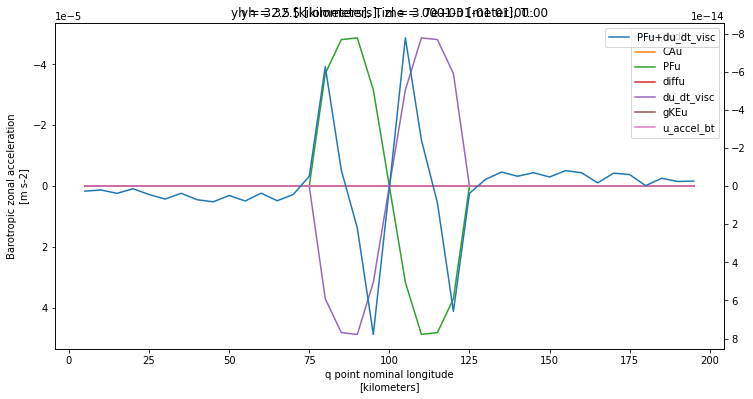

In [29]:
label = 'zstar-isomip-drag-kvbig-topo'
mom = open_mom(label)
prog = open_files(label)
time = 0
y = 0

fig, axes = plt.subplots(ncols = 8, figsize= (44,4))
mom.dudt.isel(Time = time, yh = y).plot(ax = axes[0], yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[0], yincrease = False, levels = [199], colors = 'k')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[2], yincrease = False, levels = [199], colors = 'k')
axes[0].set_title('dudt')

mom.CAu.isel(Time = time, yh = y).plot(ax = axes[1], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[1].set_title('CAu')
mom.PFu.isel(Time = time, yh = y).plot(ax = axes[2], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[2].set_title('PFu')
mom.u_accel_bt.isel(Time = time, yh = y).plot(ax = axes[3])
axes[3].set_title('u_accel_bt')
mom.diffu.isel(Time = time, yh = y).plot(ax = axes[4], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[4].set_title('diffu')
mom.du_dt_visc.isel(Time = time, yh = y).plot(ax = axes[5], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[5].set_title('du_dt_visc')
mom.gKEu.isel(Time = time, yh = y).plot(ax = axes[6], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[6].set_title('gKEu')
(mom.du_dt_visc+mom.PFu+mom.u_accel_bt).isel(Time = time, yh = y).plot(ax = axes[7], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[7].set_title('PFu+du_dt_visc+u_accel_bt')


fig.subplots_adjust(wspace = 0.35)
plt.show()

depth = 3600
fig, ax = plt.subplots(figsize = (12,6))
for term in ['dudt','CAu','PFu','diffu','du_dt_visc','gKEu']:
    mom[term].isel(Time = time, yh = y).sel(zl = depth, method = 'nearest').plot(yincrease = False, label = term)
term = 'u_accel_bt'
mom[term].isel(Time = time, yh = y).plot(yincrease = False, label = term)
plt.legend()
ax2 = ax.twinx()
(mom['du_dt_visc']+mom['PFu']).isel(Time = time, yh = y).sel(zl = depth, method = 'nearest').plot(ax = ax2,yincrease = False, label = 'PFu+du_dt_visc')
plt.legend()

# Let's explore a very symmetric Boussinesq seamount case

Non-Bouss has even more similar layer thicknesses, but harder to compare with rho_0 factor.

Here, salinity is constant, so hack mode not needed.

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


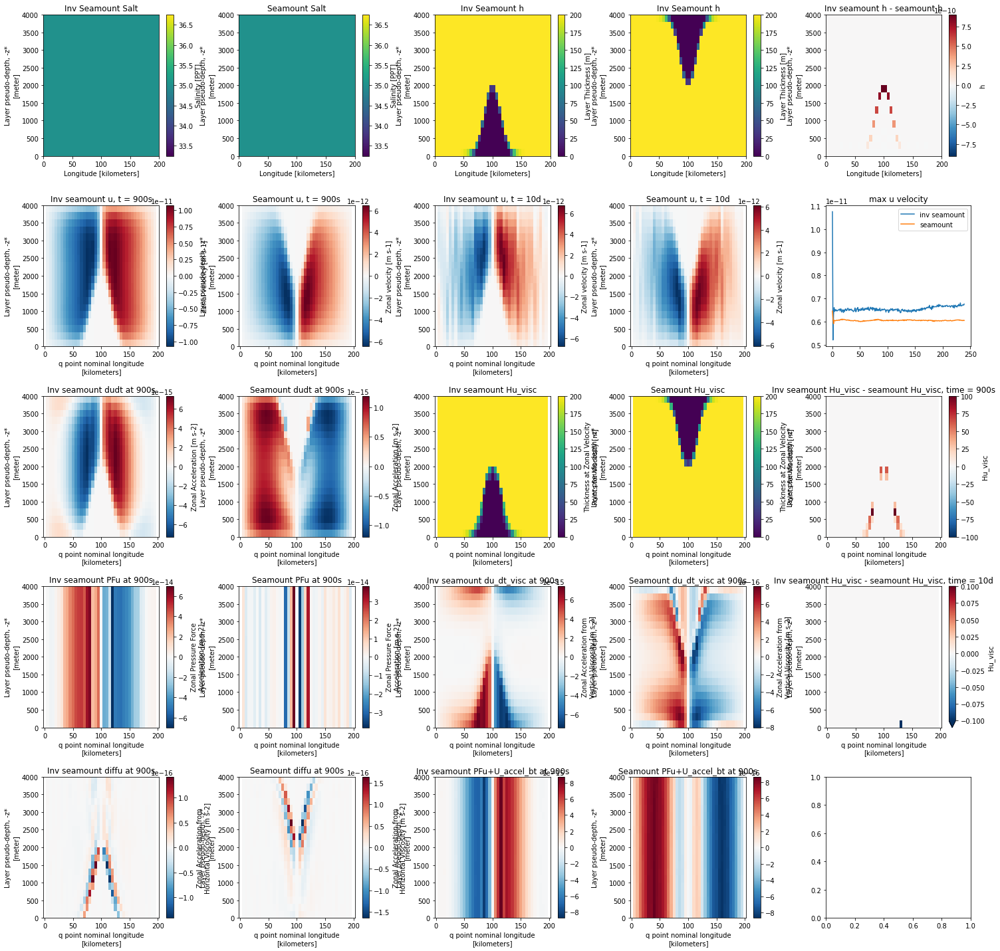

In [46]:
label1 = 'zstar-isomip-drag-kvbig-symshelf-S35'
label2 = 'zstar-isomip-drag-kvbig-symshelf-topo0-S35'

IC1 = open_IC(label1)
IC2 = open_IC(label2)
prog1 = open_files(label1)
prog2 = open_files(label2)
visc1 = open_visc(label1)
visc2 = open_visc(label2)
mom1 = open_mom(label1)
mom2 = open_mom(label2)

fig, axes = plt.subplots(nrows = 5, ncols = 5, figsize = (25,25))
IC1.Salt.isel(lath = 0).plot(ax = axes[0,0])
axes[0,0].set_title('Inv Seamount Salt')
IC1.h.isel(lath = 0).plot(ax = axes[0,2])
axes[0,2].set_title('Inv Seamount h')
IC2.Salt.isel(lath = 0).plot(ax = axes[0,1])
axes[0,1].set_title('Seamount Salt')
IC2.h.isel(lath = 0).plot(ax = axes[0,3])
axes[0,3].set_title('Inv Seamount h')
(IC1.h.isel(lath = 0,Time = 0)-np.flip(IC2.h.isel(lath = 0,Time = 0).values,axis = 0)).plot(ax = axes[0,4])
axes[0,4].set_title('Inv seamount h - seamount h')

(prog1.u.isel(yh = 0,Time = 0)).plot(ax = axes[1,0])
axes[1,0].set_title('Inv seamount u, t = 900s')

(prog2.u.isel(yh = 0,Time = 0)).plot(ax = axes[1,1])
axes[1,1].set_title('Seamount u, t = 900s')

(prog1.u.isel(yh = 0,Time = -1)).plot(ax = axes[1,2])
axes[1,2].set_title('Inv seamount u, t = 10d')

(prog2.u.isel(yh = 0,Time = -1)).plot(ax = axes[1,3])
axes[1,3].set_title('Seamount u, t = 10d')

axes[1,4].plot(np.arange(len(prog1.Time)),prog1.u.max(['xq','yh','zl']),label = 'inv seamount')
axes[1,4].plot(np.arange(len(prog2.Time)),prog2.u.max(['xq','yh','zl']),label = 'seamount')
axes[1,4].legend()
axes[1,4].set_title('max u velocity')


(visc1.Hu_visc.isel(yh = 0,Time = 0)).plot(ax = axes[2,2])
axes[2,2].set_title('Inv seamount Hu_visc')
(visc2.Hu_visc.isel(yh = 0,Time = 0)).plot(ax = axes[2,3])
axes[2,3].set_title('Seamount Hu_visc')
(visc1.Hu_visc.isel(yh = 0,Time = 0)-np.flip(visc2.Hu_visc.isel(yh = 0,Time = 0).values,axis = 0)).plot(ax = axes[2,4])
axes[2,4].set_title('Inv seamount Hu_visc - seamount Hu_visc, time = 900s')
(visc1.Hu_visc.isel(yh = 0,Time = -1)-np.flip(visc2.Hu_visc.isel(yh = 0,Time = -1).values,axis = 0)).plot(ax = axes[3,4], vmax = 0.1)
axes[3,4].set_title('Inv seamount Hu_visc - seamount Hu_visc, time = 10d')


mom1.dudt.isel(Time = 0, yh = 0).plot(ax = axes[2,0])
axes[2,0].set_title('Inv seamount dudt at 900s')
mom2.dudt.isel(Time = 0, yh = 0).plot(ax = axes[2,1])
axes[2,1].set_title('Seamount dudt at 900s')

mom1.PFu.isel(Time = 0, yh = 0).plot(ax = axes[3,0])
axes[3,0].set_title('Inv seamount PFu at 900s')
mom2.PFu.isel(Time = 0, yh = 0).plot(ax = axes[3,1])
axes[3,1].set_title('Seamount PFu at 900s')

mom1.du_dt_visc.isel(Time = 0, yh = 0).plot(ax = axes[3,2])
axes[3,2].set_title('Inv seamount du_dt_visc at 900s')
mom2.du_dt_visc.isel(Time = 0, yh = 0).plot(ax = axes[3,3])
axes[3,3].set_title('Seamount du_dt_visc at 900s')

mom1.diffu.isel(Time = 0, yh = 0).plot(ax = axes[4,0])
axes[4,0].set_title('Inv seamount diffu at 900s')
mom2.diffu.isel(Time = 0, yh = 0).plot(ax = axes[4,1])
axes[4,1].set_title('Seamount diffu at 900s')

(mom1.PFu+mom1.u_accel_bt).isel(Time = 0, yh = 0).plot(ax = axes[4,2])
axes[4,2].set_title('Inv seamount PFu+U_accel_bt at 900s')
(mom2.PFu+mom2.u_accel_bt).isel(Time = 0, yh = 0).plot(ax = axes[4,3])
axes[4,3].set_title('Seamount PFu+U_accel_bt at 900s')

fig.subplots_adjust(wspace=0.35, hspace=0.35)


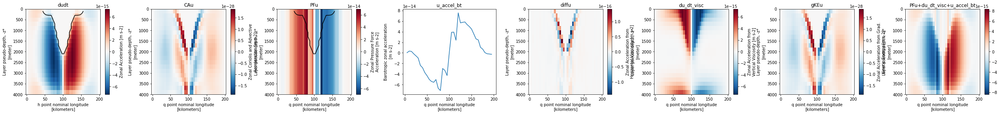

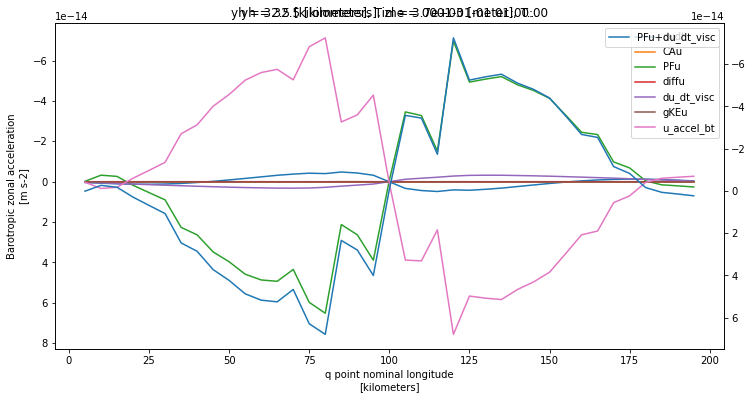

In [43]:
label = 'zstar-isomip-drag-kvbig-symshelf-S35'
mom = open_mom(label)
prog = open_files(label)
time = 0
y = 0

fig, axes = plt.subplots(ncols = 8, figsize= (44,4))
mom.dudt.isel(Time = time, yh = y).plot(ax = axes[0], yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[0], yincrease = False, levels = [199], colors = 'k')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[2], yincrease = False, levels = [199], colors = 'k')
axes[0].set_title('dudt')

mom.CAu.isel(Time = time, yh = y).plot(ax = axes[1], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[1].set_title('CAu')
mom.PFu.isel(Time = time, yh = y).plot(ax = axes[2], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[2].set_title('PFu')
mom.u_accel_bt.isel(Time = time, yh = y).plot(ax = axes[3])
axes[3].set_title('u_accel_bt')
mom.diffu.isel(Time = time, yh = y).plot(ax = axes[4], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[4].set_title('diffu')
mom.du_dt_visc.isel(Time = time, yh = y).plot(ax = axes[5], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[5].set_title('du_dt_visc')
mom.gKEu.isel(Time = time, yh = y).plot(ax = axes[6], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[6].set_title('gKEu')
(mom.du_dt_visc+mom.PFu+mom.u_accel_bt).isel(Time = time, yh = y).plot(ax = axes[7], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[7].set_title('PFu+du_dt_visc+u_accel_bt')


fig.subplots_adjust(wspace = 0.35)
plt.show()

depth = 3600
fig, ax = plt.subplots(figsize = (12,6))
for term in ['dudt','CAu','PFu','diffu','du_dt_visc','gKEu']:
    mom[term].isel(Time = time, yh = y).sel(zl = depth, method = 'nearest').plot(yincrease = False, label = term)
term = 'u_accel_bt'
mom[term].isel(Time = time, yh = y).plot(yincrease = False, label = term)
plt.legend()
ax2 = ax.twinx()
(mom['du_dt_visc']+mom['PFu']).isel(Time = time, yh = y).sel(zl = depth, method = 'nearest').plot(ax = ax2,yincrease = False, label = 'PFu+du_dt_visc')
plt.legend()

# Now do stratified version

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


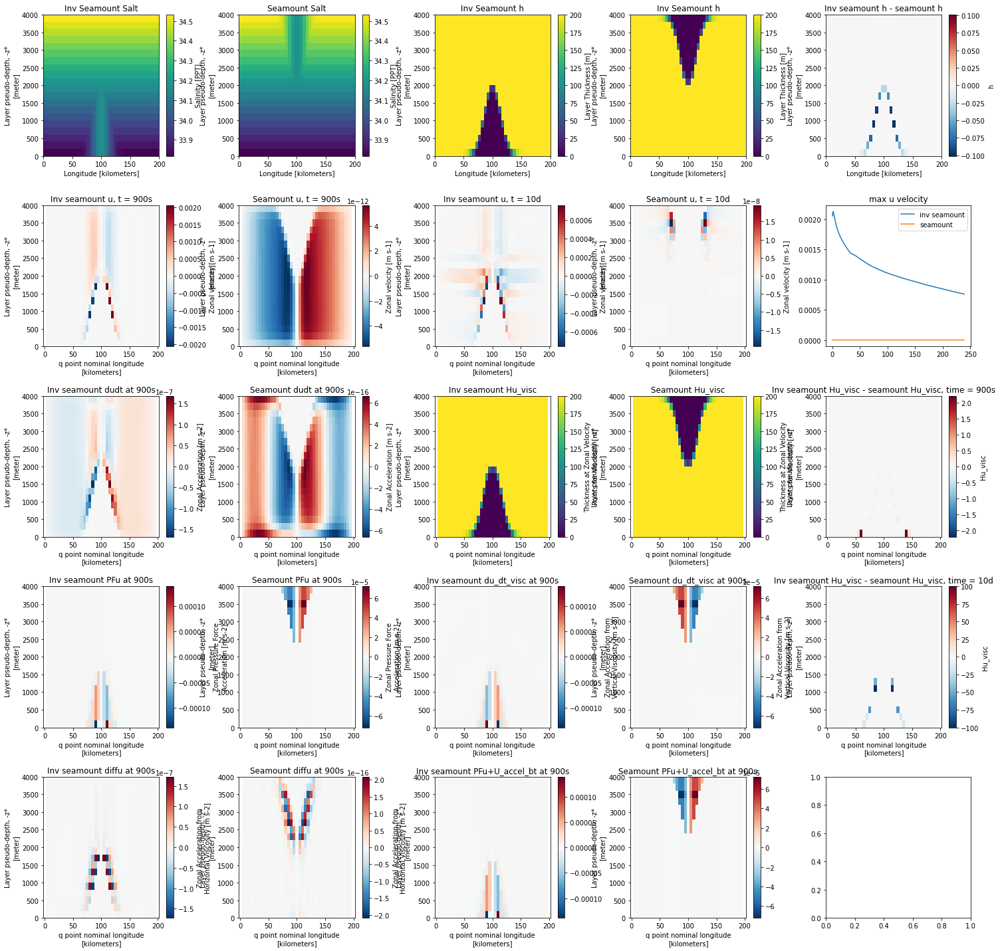

In [48]:
label1 = 'zstar-isomip-hack-drag-kvbig-symshelf_v2'
label2 = 'zstar-isomip-hack-drag-kvbig-symshelf-topo0'

IC1 = open_IC(label1)
IC2 = open_IC(label2)
prog1 = open_files(label1)
prog2 = open_files(label2)
visc1 = open_visc(label1)
visc2 = open_visc(label2)
mom1 = open_mom(label1)
mom2 = open_mom(label2)

fig, axes = plt.subplots(nrows = 5, ncols = 5, figsize = (25,25))
IC1.Salt.isel(lath = 0).plot(ax = axes[0,0])
axes[0,0].set_title('Inv Seamount Salt')
IC1.h.isel(lath = 0).plot(ax = axes[0,2])
axes[0,2].set_title('Inv Seamount h')
IC2.Salt.isel(lath = 0).plot(ax = axes[0,1])
axes[0,1].set_title('Seamount Salt')
IC2.h.isel(lath = 0).plot(ax = axes[0,3])
axes[0,3].set_title('Inv Seamount h')
(IC1.h.isel(lath = 0,Time = 0)-np.flip(IC2.h.isel(lath = 0,Time = 0).values,axis = 0)).plot(ax = axes[0,4])
axes[0,4].set_title('Inv seamount h - seamount h')

(prog1.u.isel(yh = 0,Time = 0)).plot(ax = axes[1,0])
axes[1,0].set_title('Inv seamount u, t = 900s')

(prog2.u.isel(yh = 0,Time = 0)).plot(ax = axes[1,1])
axes[1,1].set_title('Seamount u, t = 900s')

(prog1.u.isel(yh = 0,Time = -1)).plot(ax = axes[1,2])
axes[1,2].set_title('Inv seamount u, t = 10d')

(prog2.u.isel(yh = 0,Time = -1)).plot(ax = axes[1,3])
axes[1,3].set_title('Seamount u, t = 10d')

axes[1,4].plot(np.arange(len(prog1.Time)),prog1.u.max(['xq','yh','zl']),label = 'inv seamount')
axes[1,4].plot(np.arange(len(prog2.Time)),prog2.u.max(['xq','yh','zl']),label = 'seamount')
axes[1,4].legend()
axes[1,4].set_title('max u velocity')


(visc1.Hu_visc.isel(yh = 0,Time = 0)).plot(ax = axes[2,2])
axes[2,2].set_title('Inv seamount Hu_visc')
(visc2.Hu_visc.isel(yh = 0,Time = 0)).plot(ax = axes[2,3])
axes[2,3].set_title('Seamount Hu_visc')
(visc1.Hu_visc.isel(yh = 0,Time = 0)-np.flip(visc2.Hu_visc.isel(yh = 0,Time = 0).values,axis = 0)).plot(ax = axes[2,4])
axes[2,4].set_title('Inv seamount Hu_visc - seamount Hu_visc, time = 900s')
(visc1.Hu_visc.isel(yh = 0,Time = -1)-np.flip(visc2.Hu_visc.isel(yh = 0,Time = -1).values,axis = 0)).plot(ax = axes[3,4])
axes[3,4].set_title('Inv seamount Hu_visc - seamount Hu_visc, time = 10d')


mom1.dudt.isel(Time = 0, yh = 0).plot(ax = axes[2,0])
axes[2,0].set_title('Inv seamount dudt at 900s')
mom2.dudt.isel(Time = 0, yh = 0).plot(ax = axes[2,1])
axes[2,1].set_title('Seamount dudt at 900s')

mom1.PFu.isel(Time = 0, yh = 0).plot(ax = axes[3,0])
axes[3,0].set_title('Inv seamount PFu at 900s')
mom2.PFu.isel(Time = 0, yh = 0).plot(ax = axes[3,1])
axes[3,1].set_title('Seamount PFu at 900s')

mom1.du_dt_visc.isel(Time = 0, yh = 0).plot(ax = axes[3,2])
axes[3,2].set_title('Inv seamount du_dt_visc at 900s')
mom2.du_dt_visc.isel(Time = 0, yh = 0).plot(ax = axes[3,3])
axes[3,3].set_title('Seamount du_dt_visc at 900s')

mom1.diffu.isel(Time = 0, yh = 0).plot(ax = axes[4,0])
axes[4,0].set_title('Inv seamount diffu at 900s')
mom2.diffu.isel(Time = 0, yh = 0).plot(ax = axes[4,1])
axes[4,1].set_title('Seamount diffu at 900s')

(mom1.PFu+mom1.u_accel_bt).isel(Time = 0, yh = 0).plot(ax = axes[4,2])
axes[4,2].set_title('Inv seamount PFu+U_accel_bt at 900s')
(mom2.PFu+mom2.u_accel_bt).isel(Time = 0, yh = 0).plot(ax = axes[4,3])
axes[4,3].set_title('Seamount PFu+U_accel_bt at 900s')

fig.subplots_adjust(wspace=0.35, hspace=0.35)


# DT convergence

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/

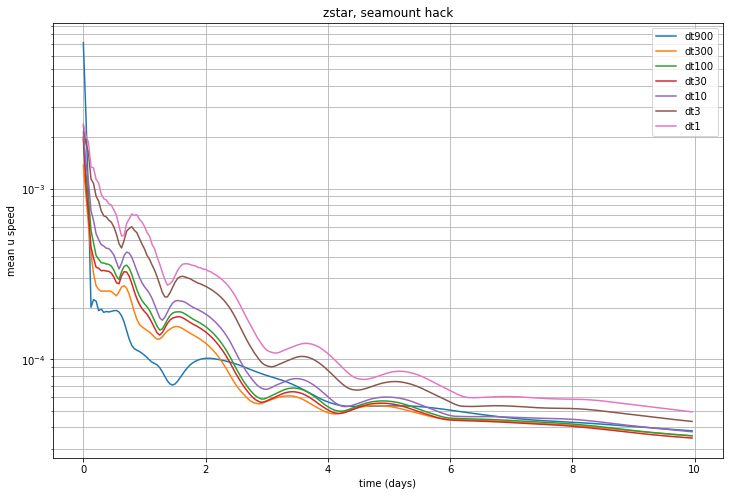

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/

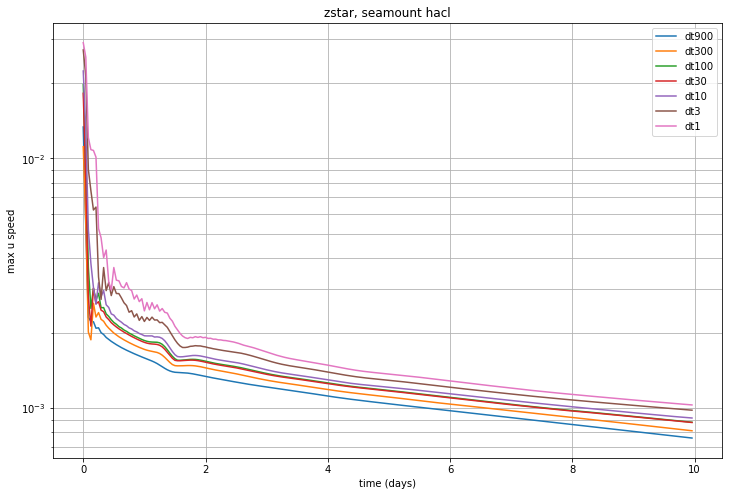

In [60]:
## Plot velocities
def open_files2(label):
    base = 'dt-archive'
    prog = xr.open_dataset(base + '/progmean-'+label+'.nc')
    return prog

fig, axes = plt.subplots(ncols = 1, figsize = (12,8))

label = 'dt900'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
          label = label) 
label = 'dt300'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
          label = label) 
label = 'dt100'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
          label = label) 
label = 'dt30'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
          label = label) 
label = 'dt10'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
          label = label) 
label = 'dt3'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
          label = label) 
label = 'dt1'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
          label = label) 


axes.set_ylabel('mean u speed')
axes.set_xlabel('time (days)')
axes.set_yscale('log')
#axes.set_ylim(1e-11,1e-2)
axes.set_title('zstar, seamount hack')
axes.legend()
axes.grid(which = "both")

plt.show()
fig, axes = plt.subplots(ncols = 1, figsize = (12,8))

label = 'dt900'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
label = 'dt300'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
label = 'dt100'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
label = 'dt30'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
label = 'dt10'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
label = 'dt3'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
label = 'dt1'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 


axes.set_ylabel('max u speed')
axes.set_xlabel('time (days)')
axes.set_yscale('log')
#axes.set_ylim(1e-11,1e-2)
axes.set_title('zstar, seamount hacl')
axes.grid(which = "both")
axes.legend()
#axes.set_ylim(1.55e-5,1.6e-5)

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/

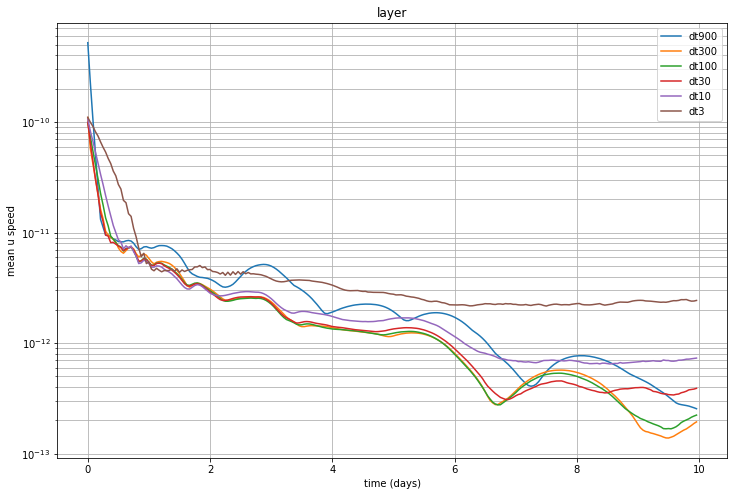

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/

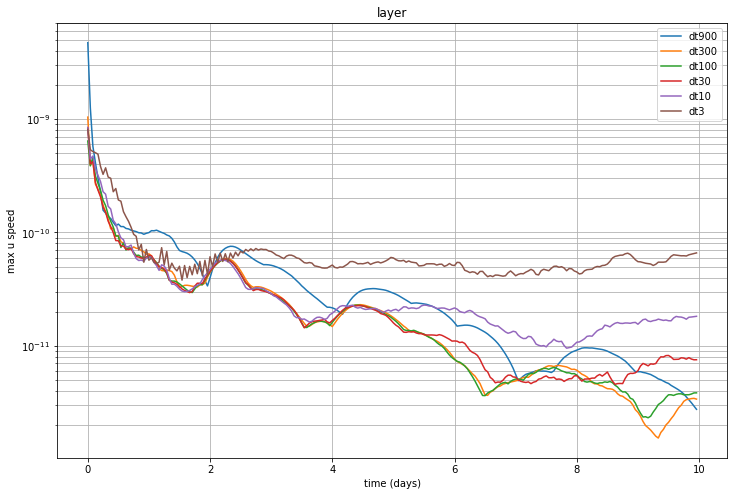

In [19]:
## Plot velocities
def open_files2(label):
    base = 'dt-archive'
    prog = xr.open_dataset(base + '/progmean-layer-'+label+'.nc')
    return prog

fig, axes = plt.subplots(ncols = 1, figsize = (12,8))

label = 'dt900'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
          label = label) 
label = 'dt300'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
          label = label) 
label = 'dt100'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
          label = label) 
label = 'dt30'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
          label = label) 
label = 'dt10'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
          label = label) 
label = 'dt3'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
          label = label) 
# label = 'dt1'
# prog = open_files2(label)
# axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
#           label = label) 


axes.set_ylabel('mean u speed')
axes.set_xlabel('time (days)')
axes.set_yscale('log')
#axes.set_ylim(1e-11,1e-2)
axes.set_title('layer')
axes.legend()
axes.grid(which = "both")

plt.show()
fig, axes = plt.subplots(ncols = 1, figsize = (12,8))

label = 'dt900'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
label = 'dt300'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
label = 'dt100'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
label = 'dt30'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
label = 'dt10'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
label = 'dt3'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
# label = 'dt1'
# prog = open_files2(label)
# axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
#           label = label) 


axes.set_ylabel('max u speed')
axes.set_xlabel('time (days)')
axes.set_yscale('log')
#axes.set_ylim(1e-11,1e-2)
axes.set_title('layer')
axes.grid(which = "both")
axes.legend()
#axes.set_ylim(1.55e-5,1.6e-5)

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/

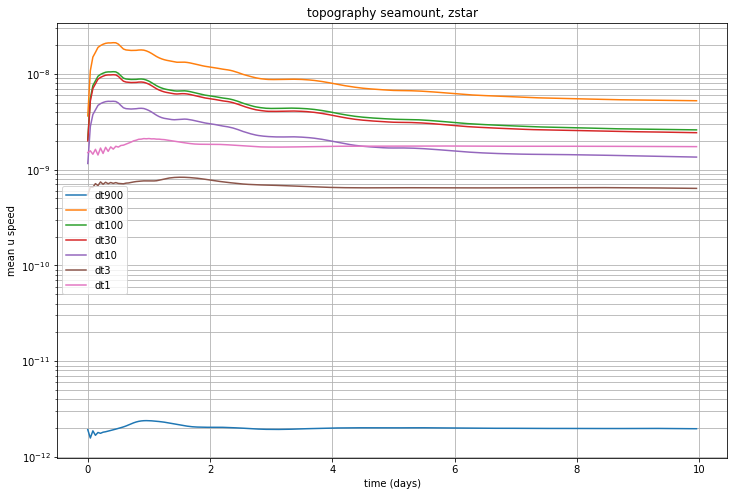

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/

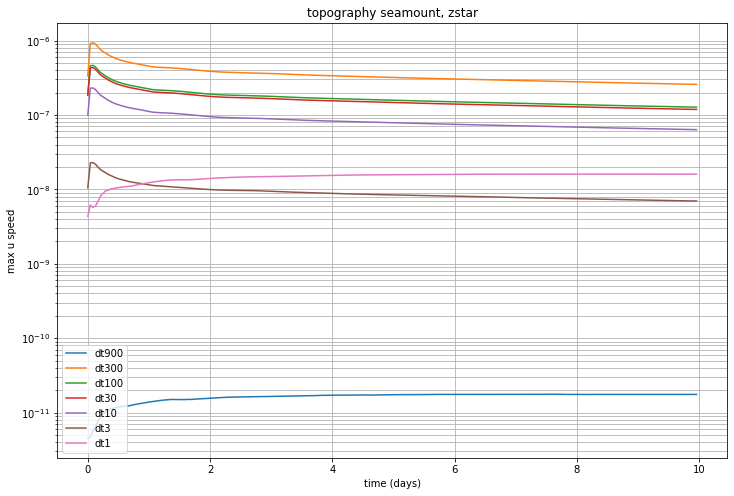

In [21]:
## Plot velocities
def open_files2(label):
    base = 'dt-archive'
    prog = xr.open_dataset(base + '/progmean-invzstar-'+label+'.nc')
    return prog

fig, axes = plt.subplots(ncols = 1, figsize = (12,8))

label = 'dt900'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
          label = label) 
label = 'dt300'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
          label = label) 
label = 'dt100'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
          label = label) 
label = 'dt30'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
          label = label) 
label = 'dt10'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
          label = label) 
label = 'dt3'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
          label = label) 
label = 'dt1'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).mean(['zl','yh','xq']), 
          label = label) 


axes.set_ylabel('mean u speed')
axes.set_xlabel('time (days)')
axes.set_yscale('log')
#axes.set_ylim(1e-11,1e-2)
axes.set_title('topography seamount, zstar')
axes.legend()
axes.grid(which = "both")

plt.show()
fig, axes = plt.subplots(ncols = 1, figsize = (12,8))

label = 'dt900'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
label = 'dt300'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
label = 'dt100'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
label = 'dt30'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
label = 'dt10'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
label = 'dt3'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
label = 'dt1'
prog = open_files2(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 


axes.set_ylabel('max u speed')
axes.set_xlabel('time (days)')
axes.set_yscale('log')
#axes.set_ylim(1e-11,1e-2)
axes.set_title('topography seamount, zstar')
axes.grid(which = "both")
axes.legend()
#axes.set_ylim(1.55e-5,1.6e-5)

# Try ANALYTIC_FV_PGE = False

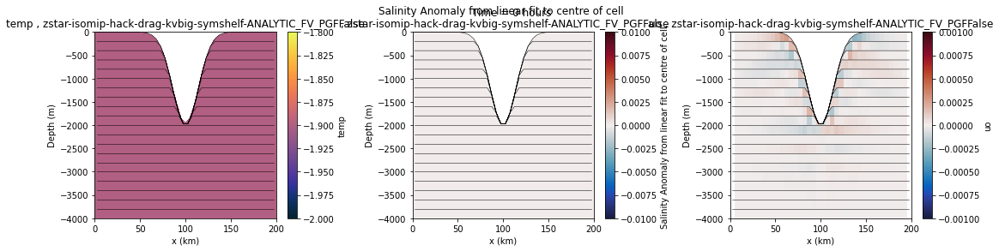

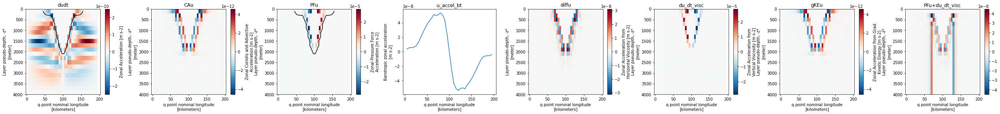

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


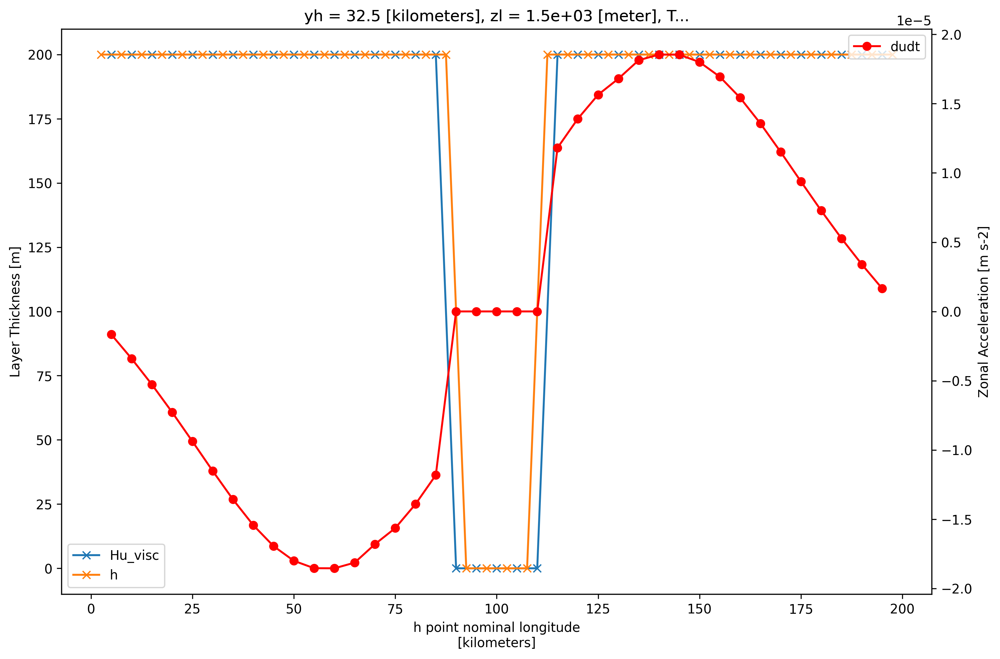

Text(0.5, 1.0, 'u_max')

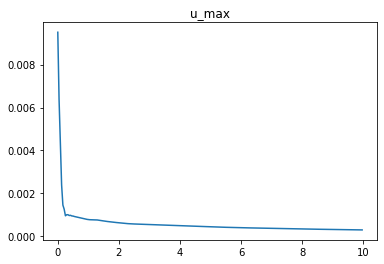

In [65]:
label = 'zstar-isomip-hack-drag-kvbig-symshelf-ANALYTIC_FV_PGFFalse'


fig, axes = plt.subplots(ncols = 3, figsize = (18,4))
prog = open_files(label)
IC = open_IC(label)
x = 0
time = -1#24*5-1
ymax = 4000
plot(axes[0],x,time,0,prog.temp,"temp",-2,-1.8,cm.cm.thermal,ymax)

prog = open_files(label)
IC = open_IC(label)

#plot(axes[1],x,time,0,prog.salt,"salt",33.7,34.6,cm.cm.haline,ymax)
ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-4000) + 33.8
plot(axes[1],x,time,0,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-2,1e-2,cm.cm.balance,ymax)


prog = open_files(label)
IC = open_IC(label)

plot(axes[2],x,time,0,prog.u,"uo",-1e-3,1e-3,cm.cm.balance,ymax)

fig.subplots_adjust(wspace = 0.4)
fig.suptitle('Time = '+str(time+1)+' hours')
plt.show()

mom = open_mom(label)
prog = open_files(label)
time = -1
y = 0

fig, axes = plt.subplots(ncols = 8, figsize= (44,4))
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[0], yincrease = False, levels = [199], colors = 'k')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[2], yincrease = False, levels = [199], colors = 'k')
mom.dudt.isel(Time = time, yh = y).plot(ax = axes[0], yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
axes[0].set_title('dudt')

mom.CAu.isel(Time = time, yh = y).plot(ax = axes[1], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[1].set_title('CAu')
mom.PFu.isel(Time = time, yh = y).plot(ax = axes[2], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[2].set_title('PFu')
mom.u_accel_bt.isel(Time = time, yh = y).plot(ax = axes[3])
axes[3].set_title('u_accel_bt')
mom.diffu.isel(Time = time, yh = y).plot(ax = axes[4], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[4].set_title('diffu')
mom.du_dt_visc.isel(Time = time, yh = y).plot(ax = axes[5], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[5].set_title('du_dt_visc')
mom.gKEu.isel(Time = time, yh = y).plot(ax = axes[6], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[6].set_title('gKEu')
(mom.du_dt_visc+mom.PFu-(mom.du_dt_visc+mom.PFu).isel(zl=0)).isel(Time = time, yh = y).plot(ax = axes[7], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[7].set_title('PFu+du_dt_visc')


fig.subplots_adjust(wspace = 0.35)
plt.show()

zl = 1500

fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
visc = xr.open_dataset('archive/visc-'+label+'.nc')
visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = zl, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
prog.h.isel(Time = 0, yh = 0).sel(zl = zl, method = 'nearest').plot(marker = 'x', label = 'h')
ax2 = ax.twinx()
mom.dudt.isel(Time = 0, yh = y).sel(zl = zl, method = 'nearest').plot(ax = ax2, color = 'r', marker = 'o', label = 'dudt')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
#yincrease = False)
ax.legend()
ax2.legend()

plt.show()

# fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
# visc = xr.open_dataset('archive/visc-'+label+'.nc')
# visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = 2000, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
# ax2 = ax.twinx()
# mom.dudt.isel(Time = 0, yh = y).sel(zl = 2000, method = 'nearest').plot(ax = ax2, color = 'r', marker = 'o', label = 'dudt')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
# #yincrease = False)
# ax.legend()
# ax2.legend()
plt.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
plt.title('u_max')


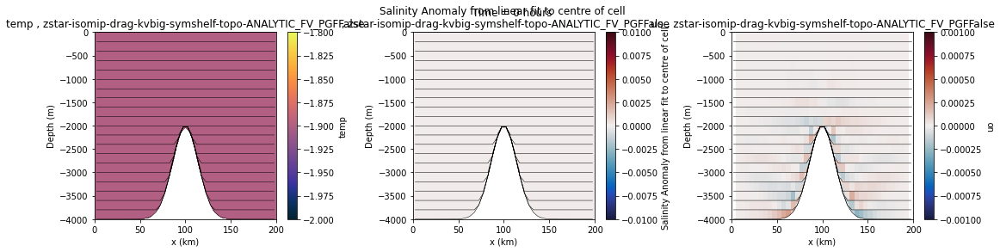

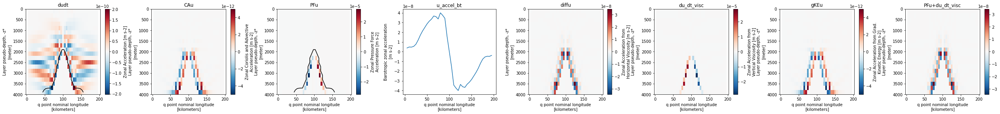

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


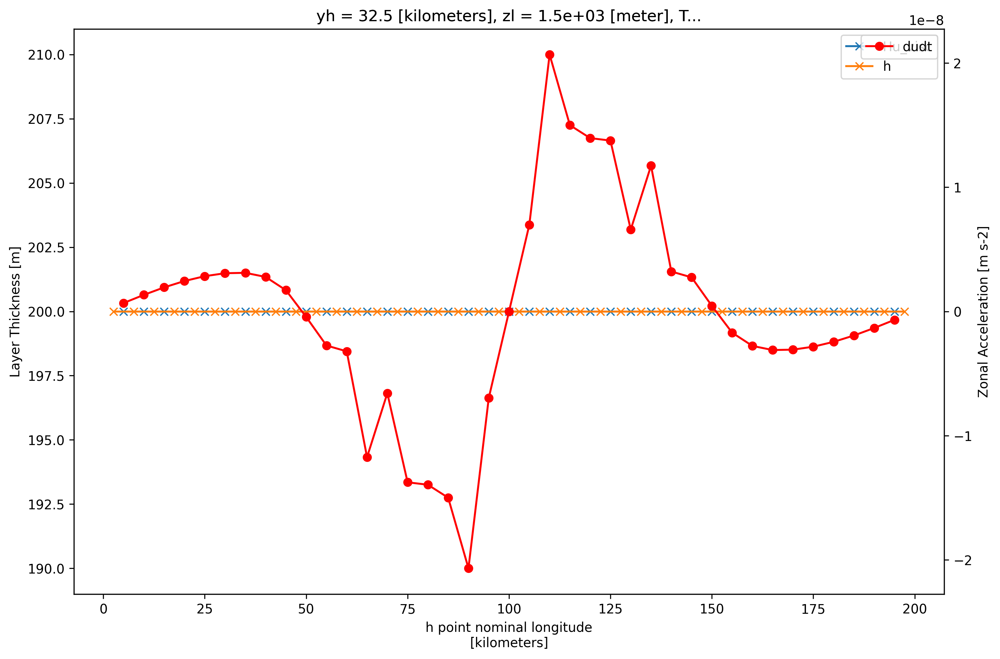

Text(0.5, 1.0, 'u_max')

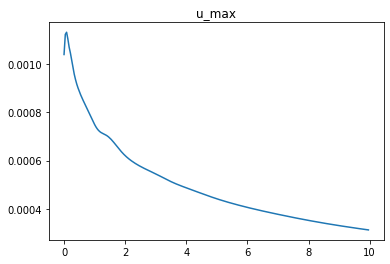

In [18]:
label = 'zstar-isomip-drag-kvbig-symshelf-topo-ANALYTIC_FV_PGFFalse'


fig, axes = plt.subplots(ncols = 3, figsize = (18,4))
prog = open_files(label)
IC = open_IC(label)
x = 0
time = -1#24*5-1
ymax = 4000
plot(axes[0],x,time,0,prog.temp,"temp",-2,-1.8,cm.cm.thermal,ymax)

prog = open_files(label)
IC = open_IC(label)

#plot(axes[1],x,time,0,prog.salt,"salt",33.7,34.6,cm.cm.haline,ymax)
ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-4000) + 33.8
plot(axes[1],x,time,0,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-2,1e-2,cm.cm.balance,ymax)


prog = open_files(label)
IC = open_IC(label)

plot(axes[2],x,time,0,prog.u,"uo",-1e-3,1e-3,cm.cm.balance,ymax)

fig.subplots_adjust(wspace = 0.4)
fig.suptitle('Time = '+str(time+1)+' hours')
plt.show()

mom = open_mom(label)
prog = open_files(label)
time = -1
y = 0

fig, axes = plt.subplots(ncols = 8, figsize= (44,4))
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[0], yincrease = False, levels = [199], colors = 'k')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[2], yincrease = False, levels = [199], colors = 'k')
mom.dudt.isel(Time = time, yh = y).plot(ax = axes[0], yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
axes[0].set_title('dudt')

mom.CAu.isel(Time = time, yh = y).plot(ax = axes[1], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[1].set_title('CAu')
mom.PFu.isel(Time = time, yh = y).plot(ax = axes[2], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[2].set_title('PFu')
mom.u_accel_bt.isel(Time = time, yh = y).plot(ax = axes[3])
axes[3].set_title('u_accel_bt')
mom.diffu.isel(Time = time, yh = y).plot(ax = axes[4], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[4].set_title('diffu')
mom.du_dt_visc.isel(Time = time, yh = y).plot(ax = axes[5], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[5].set_title('du_dt_visc')
mom.gKEu.isel(Time = time, yh = y).plot(ax = axes[6], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[6].set_title('gKEu')
(mom.du_dt_visc+mom.PFu-(mom.du_dt_visc+mom.PFu).isel(zl=0)).isel(Time = time, yh = y).plot(ax = axes[7], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[7].set_title('PFu+du_dt_visc')


fig.subplots_adjust(wspace = 0.35)
plt.show()

zl = 1500

fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
visc = xr.open_dataset('archive/visc-'+label+'.nc')
visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = zl, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
prog.h.isel(Time = 0, yh = 0).sel(zl = zl, method = 'nearest').plot(marker = 'x', label = 'h')
ax2 = ax.twinx()
mom.dudt.isel(Time = 0, yh = y).sel(zl = zl, method = 'nearest').plot(ax = ax2, color = 'r', marker = 'o', label = 'dudt')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
#yincrease = False)
ax.legend()
ax2.legend()

plt.show()

# fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
# visc = xr.open_dataset('archive/visc-'+label+'.nc')
# visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = 2000, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
# ax2 = ax.twinx()
# mom.dudt.isel(Time = 0, yh = y).sel(zl = 2000, method = 'nearest').plot(ax = ax2, color = 'r', marker = 'o', label = 'dudt')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
# #yincrease = False)
# ax.legend()
# ax2.legend()
plt.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
plt.title('u_max')


(1e-14, 0.1)

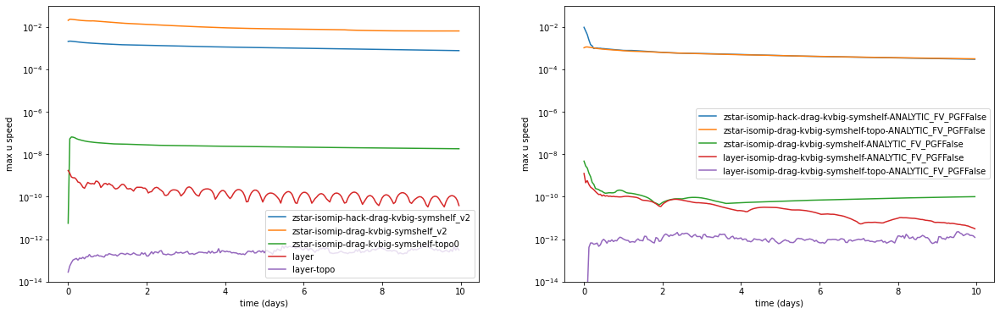

In [3]:
## Plot velocities
fig, axes = plt.subplots(ncols = 2, figsize = (20,6))
label = 'zstar-isomip-hack-drag-kvbig-symshelf_v2'
prog = open_files(label)
axes[0].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'zstar-isomip-drag-kvbig-symshelf_v2'
prog = open_files(label)
axes[0].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'zstar-isomip-drag-kvbig-symshelf-topo0'
prog = open_files(label)
axes[0].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'layer'
prog = open_files(label)
axes[0].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'layer-topo'
prog = open_files(label)
axes[0].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 


axes[0].set_ylabel('max u speed')
axes[0].set_xlabel('time (days)')
axes[0].set_yscale('log')
axes[0].legend()
axes[0].set_ylim(1e-14,1e-1)
###########

label = 'zstar-isomip-hack-drag-kvbig-symshelf-ANALYTIC_FV_PGFFalse'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'zstar-isomip-drag-kvbig-symshelf-topo-ANALYTIC_FV_PGFFalse'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 

label = 'zstar-isomip-drag-kvbig-symshelf-ANALYTIC_FV_PGFFalse'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'layer-isomip-drag-kvbig-symshelf-ANALYTIC_FV_PGFFalse'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
label = 'layer-isomip-drag-kvbig-symshelf-topo-ANALYTIC_FV_PGFFalse'
prog = open_files(label)
axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = label) 
# label = 'zstar-isomip-surfp'
# prog = open_files(label)
# axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), label = label) 

# label = 'zstar-isomip-surfp-hack'
# prog = open_files(label)
# axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
#              label = label) 

# label = 'sigmashelfzstar-nosurfpressure-nohack-minthick1e-12'
# prog = open_files(label)
# axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
#              label = 'sigmashelfzstar') 

# label = 'sigma-nosurfpressure-nohack-minthick1e-12'
# prog = open_files(label)
# axes[1].plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
#              label = 'sigma') 
axes[1].set_ylabel('max u speed')
axes[1].set_xlabel('time (days)')

axes[1].legend()
axes[1].set_yscale('log')
axes[1].set_ylim(1e-14,1e-1)

# Scaling with min_thickness

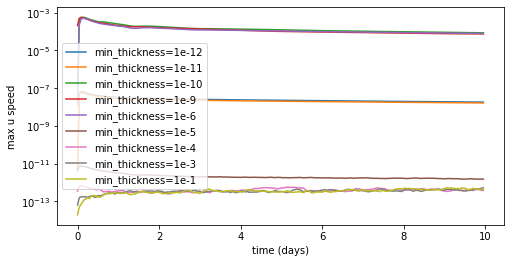

Text(0.5, 1.0, 'Seamount with flat ice shelf on top, scaling with min_thickness')

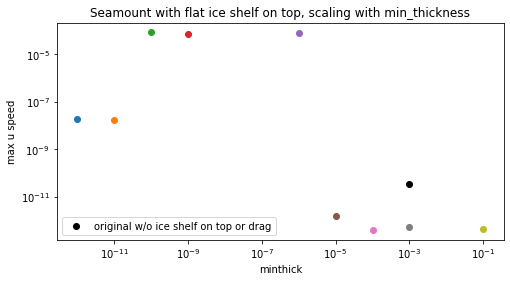

In [17]:
## Plot velocities
fig, axes = plt.subplots( figsize = (8,4))
label = 'zstar-isomip-drag-kvbig-symshelf-topo0'
prog = open_files(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = 'min_thickness=1e-12') 
label = 'zstar-isomip-drag-kvbig-symshelf-topo0-minthick1e-11'
prog = open_files(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = 'min_thickness=1e-11') 
label = 'zstar-isomip-drag-kvbig-symshelf-topo0-minthick1e-10'
prog = open_files(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = 'min_thickness=1e-10') 

label = 'zstar-isomip-drag-kvbig-symshelf-topo0-minthick1e-9'
prog = open_files(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = 'min_thickness=1e-9') 
label = 'zstar-isomip-drag-kvbig-symshelf-topo0-minthick1e-6'
prog = open_files(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = 'min_thickness=1e-6') 
label = 'zstar-isomip-drag-kvbig-symshelf-topo0-minthick1e-5'
prog = open_files(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = 'min_thickness=1e-5') 
label = 'zstar-isomip-drag-kvbig-symshelf-topo0-minthick1e-4'
prog = open_files(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = 'min_thickness=1e-4') 
label = 'zstar-isomip-drag-kvbig-symshelf-topo0-minthick1e-3'
prog = open_files(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = 'min_thickness=1e-3') 
label = 'zstar-isomip-drag-kvbig-symshelf-topo0-minthick1e-1'
prog = open_files(label)
axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
             label = 'min_thickness=1e-1') 
axes.set_ylabel('max u speed')
axes.set_xlabel('time (days)')
axes.set_yscale('log')
axes.legend()
#axes.set_ylim(1e-14,1e-2)
plt.show()
fig, axes = plt.subplots( figsize = (8,4))
label = 'zstar-isomip-drag-kvbig-symshelf-topo0'
prog = open_files(label)
axes.scatter(1e-12,np.abs(prog.u).max(['zl','yh','xq'])[-1]) 
for k in [-11,-10,-9,-6,-5,-4,-3,-1]:
    label = 'zstar-isomip-drag-kvbig-symshelf-topo0-minthick1e'+str(k)
    prog = open_files(label)
    axes.scatter(10**(k),np.abs(prog.u).max(['zl','yh','xq'])[-1]) 
axes.set_ylabel('max u speed')
axes.set_xlabel('minthick')
axes.set_yscale('log')
axes.set_xscale('log')

label = 'zstar-topo'
prog = open_files(label)
axes.scatter(1e-3,np.abs(prog.u).max(['zl','yh','xq'])[-1], color = 'k', label = 'original w/o ice shelf on top or drag')
plt.legend()
plt.title('Seamount with flat ice shelf on top, scaling with min_thickness')

# Try Rayleigh Drag

In [45]:
ave = False ## True means use 5 daily average rather than hourly prog
basee = '/Users/claireyung/mom6/MOM6-examples/ocean_only/ISOMIP/seamount-shelf/rayleigh-archive'
def open_files(label):
    base = basee 
    prog = xr.open_dataset(base + '/prog-'+label+'.nc')
    return prog
def open_IC(label):
    base = basee 
    IC = xr.open_dataset(base + '/MOM_IC-'+label+'.nc')
    return IC
def open_mom(label):
    base = basee 
    IC = xr.open_dataset(base + '/mom-'+label+'.nc')
    return IC
def open_visc(label):
    base = basee 
    IC = xr.open_dataset(base + '/visc-'+label+'.nc')
    return IC

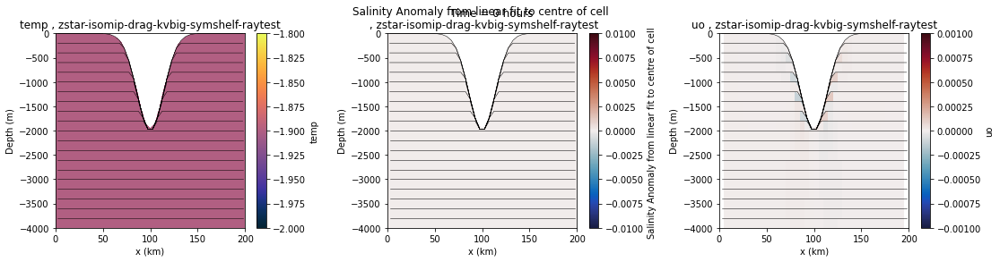

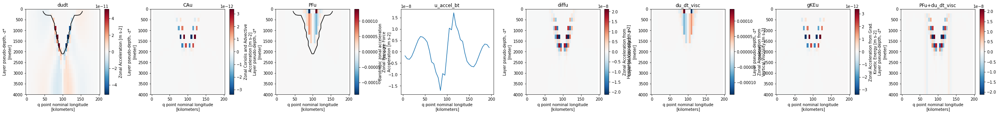

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


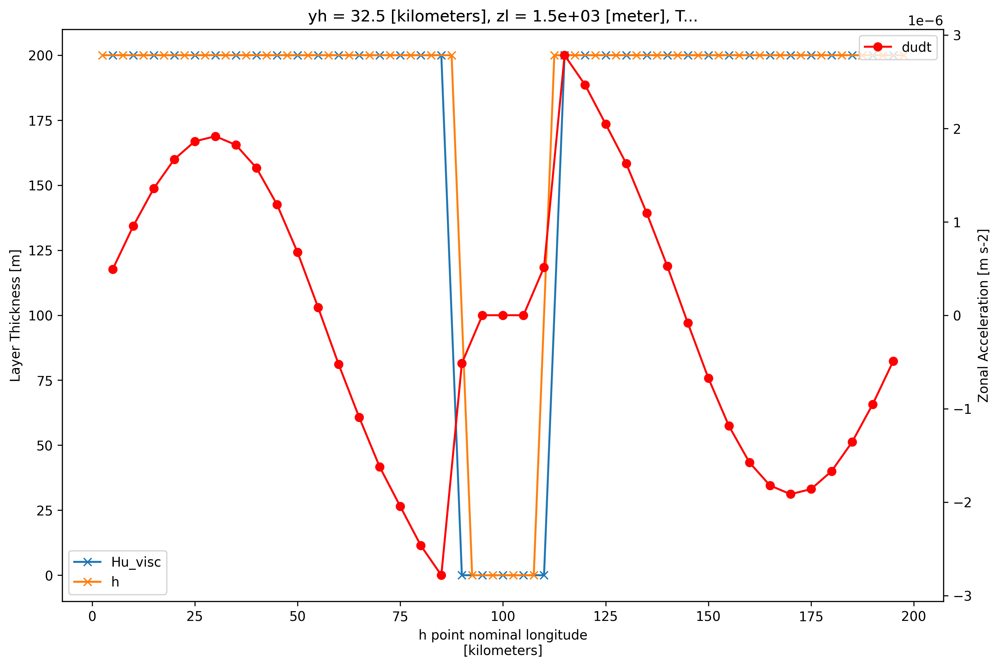

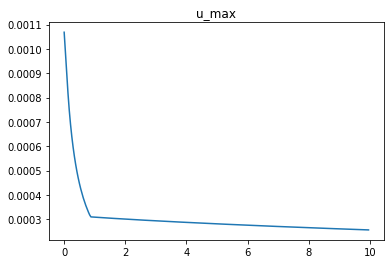

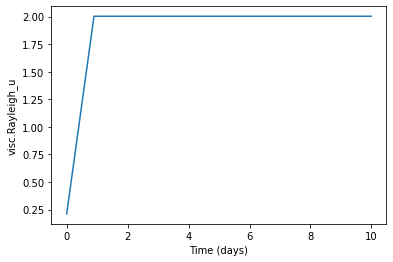

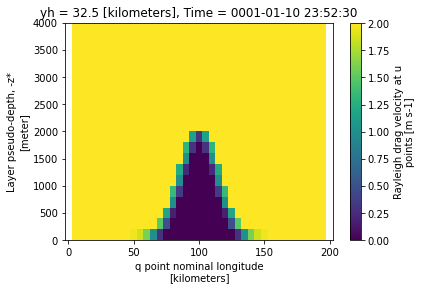

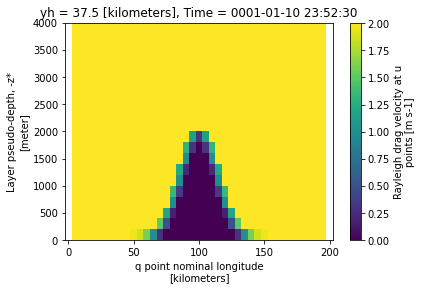

In [4]:


label = 'zstar-isomip-drag-kvbig-symshelf-raytest'

fig, axes = plt.subplots(ncols = 3, figsize = (18,4))
prog = open_files(label)
IC = open_IC(label)
x = 0
time = -1#24*5-1
ymax = 4000
plot(axes[0],x,time,0,prog.temp,"temp",-2,-1.8,cm.cm.thermal,ymax)

prog = open_files(label)
IC = open_IC(label)

#plot(axes[1],x,time,0,prog.salt,"salt",33.7,34.6,cm.cm.haline,ymax)
ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-4000) + 33.8
plot(axes[1],x,time,0,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-2,1e-2,cm.cm.balance,ymax)


prog = open_files(label)
IC = open_IC(label)

plot(axes[2],x,time,0,prog.u,"uo",-1e-3,1e-3,cm.cm.balance,ymax)

fig.subplots_adjust(wspace = 0.4)
fig.suptitle('Time = '+str(time+1)+' hours')
plt.show()

mom = open_mom(label)
prog = open_files(label)
time = -1
y = 0

fig, axes = plt.subplots(ncols = 8, figsize= (44,4))
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[0], yincrease = False, levels = [199], colors = 'k')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[2], yincrease = False, levels = [199], colors = 'k')
mom.dudt.isel(Time = time, yh = y).plot(ax = axes[0], yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
axes[0].set_title('dudt')

mom.CAu.isel(Time = time, yh = y).plot(ax = axes[1], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[1].set_title('CAu')
mom.PFu.isel(Time = time, yh = y).plot(ax = axes[2], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[2].set_title('PFu')
mom.u_accel_bt.isel(Time = time, yh = y).plot(ax = axes[3])
axes[3].set_title('u_accel_bt')
mom.diffu.isel(Time = time, yh = y).plot(ax = axes[4], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[4].set_title('diffu')
mom.du_dt_visc.isel(Time = time, yh = y).plot(ax = axes[5], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[5].set_title('du_dt_visc')
mom.gKEu.isel(Time = time, yh = y).plot(ax = axes[6], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[6].set_title('gKEu')
(mom.du_dt_visc+mom.PFu-(mom.du_dt_visc+mom.PFu).isel(zl=0)).isel(Time = time, yh = y).plot(ax = axes[7], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[7].set_title('PFu+du_dt_visc')


fig.subplots_adjust(wspace = 0.35)
plt.show()

zl = 1500

fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
visc = open_visc(label)
visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = zl, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
prog.h.isel(Time = 0, yh = 0).sel(zl = zl, method = 'nearest').plot(marker = 'x', label = 'h')
ax2 = ax.twinx()
mom.dudt.isel(Time = 0, yh = y).sel(zl = zl, method = 'nearest').plot(ax = ax2, color = 'r', marker = 'o', label = 'dudt')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
#yincrease = False)
ax.legend()
ax2.legend()

plt.show()

# fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
# visc = xr.open_dataset('archive/visc-'+label+'.nc')
# visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = 2000, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
# ax2 = ax.twinx()
# mom.dudt.isel(Time = 0, yh = y).sel(zl = 2000, method = 'nearest').plot(ax = ax2, color = 'r', marker = 'o', label = 'dudt')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
# #yincrease = False)
# ax.legend()
# ax2.legend()
plt.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
plt.title('u_max')
plt.show()

plt.plot(np.arange(len(visc.Time))/(24*4), visc.Rayleigh_u.isel(zl = 0, yh = 0, xq = 1).values)
plt.ylabel('visc.Rayleigh_u')
plt.xlabel('Time (days)')
plt.show()

visc.Rayleigh_u.isel(yh = 0,Time = -1).plot()
plt.show()
visc.Rayleigh_u.isel(yh = 1,Time = -1).plot()
plt.show()


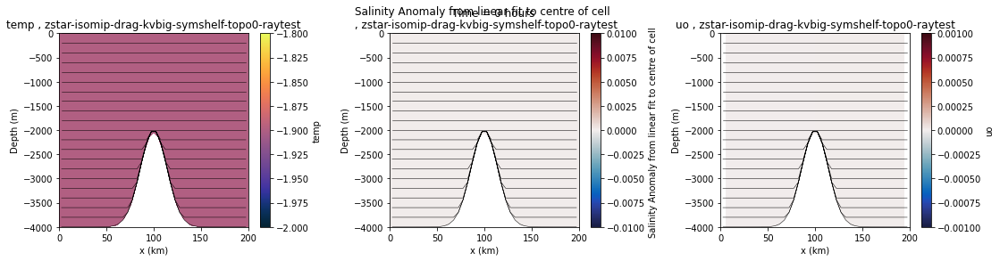

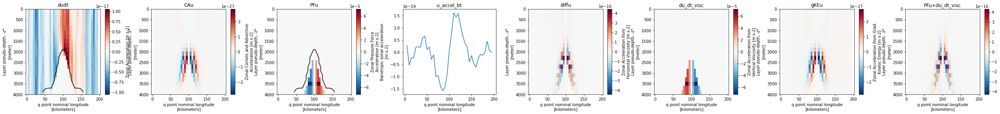

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


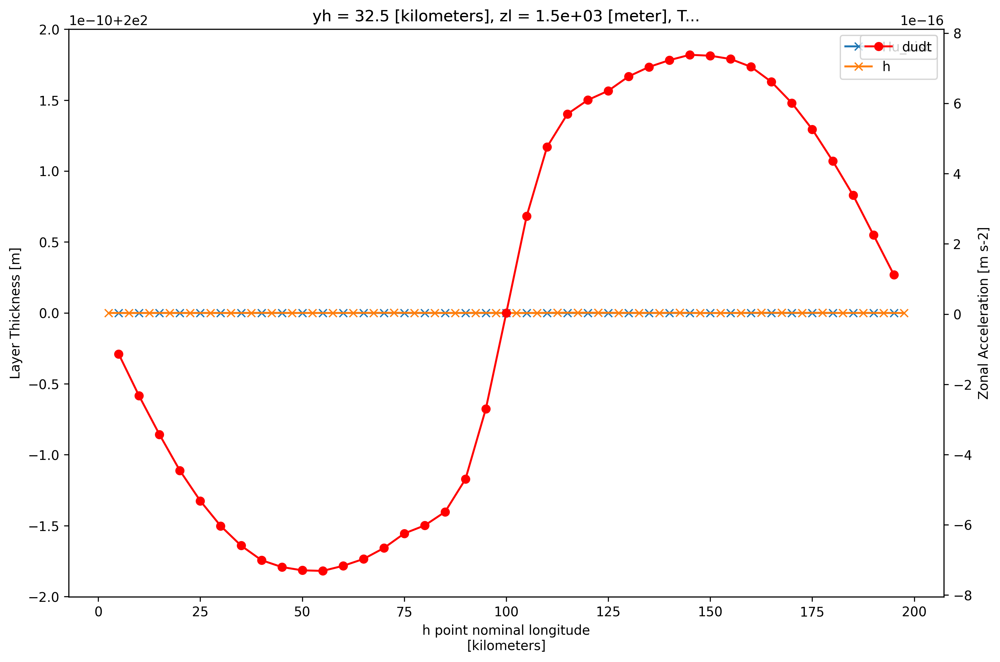

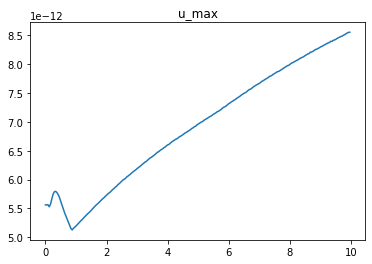

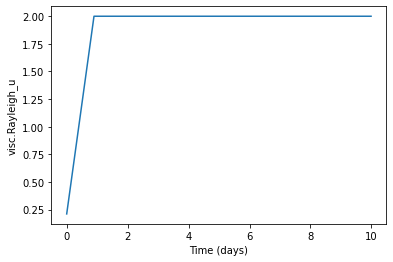

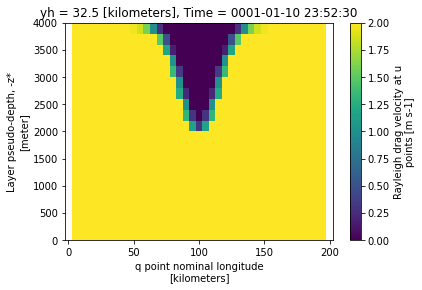

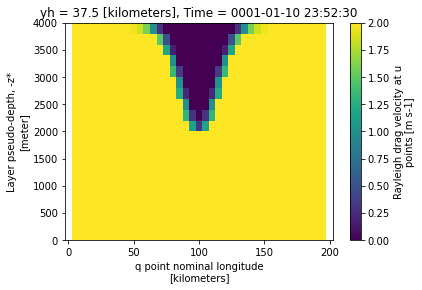

In [5]:


label = 'zstar-isomip-drag-kvbig-symshelf-topo0-raytest'

fig, axes = plt.subplots(ncols = 3, figsize = (18,4))
prog = open_files(label)
IC = open_IC(label)
x = 0
time = -1#24*5-1
ymax = 4000
plot(axes[0],x,time,0,prog.temp,"temp",-2,-1.8,cm.cm.thermal,ymax)

prog = open_files(label)
IC = open_IC(label)

#plot(axes[1],x,time,0,prog.salt,"salt",33.7,34.6,cm.cm.haline,ymax)
ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-4000) + 33.8
plot(axes[1],x,time,0,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-2,1e-2,cm.cm.balance,ymax)


prog = open_files(label)
IC = open_IC(label)

plot(axes[2],x,time,0,prog.u,"uo",-1e-3,1e-3,cm.cm.balance,ymax)

fig.subplots_adjust(wspace = 0.4)
fig.suptitle('Time = '+str(time+1)+' hours')
plt.show()

mom = open_mom(label)
prog = open_files(label)
time = -1
y = 0

fig, axes = plt.subplots(ncols = 8, figsize= (44,4))
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[0], yincrease = False, levels = [199], colors = 'k')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[2], yincrease = False, levels = [199], colors = 'k')
mom.dudt.isel(Time = time, yh = y).plot(ax = axes[0], yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
axes[0].set_title('dudt')

mom.CAu.isel(Time = time, yh = y).plot(ax = axes[1], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[1].set_title('CAu')
mom.PFu.isel(Time = time, yh = y).plot(ax = axes[2], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[2].set_title('PFu')
mom.u_accel_bt.isel(Time = time, yh = y).plot(ax = axes[3])
axes[3].set_title('u_accel_bt')
mom.diffu.isel(Time = time, yh = y).plot(ax = axes[4], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[4].set_title('diffu')
mom.du_dt_visc.isel(Time = time, yh = y).plot(ax = axes[5], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[5].set_title('du_dt_visc')
mom.gKEu.isel(Time = time, yh = y).plot(ax = axes[6], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[6].set_title('gKEu')
(mom.du_dt_visc+mom.PFu-(mom.du_dt_visc+mom.PFu).isel(zl=0)).isel(Time = time, yh = y).plot(ax = axes[7], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[7].set_title('PFu+du_dt_visc')


fig.subplots_adjust(wspace = 0.35)
plt.show()

zl = 1500

fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
visc = open_visc(label)
visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = zl, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
prog.h.isel(Time = 0, yh = 0).sel(zl = zl, method = 'nearest').plot(marker = 'x', label = 'h')
ax2 = ax.twinx()
mom.dudt.isel(Time = 0, yh = y).sel(zl = zl, method = 'nearest').plot(ax = ax2, color = 'r', marker = 'o', label = 'dudt')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
#yincrease = False)
ax.legend()
ax2.legend()

plt.show()

# fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
# visc = xr.open_dataset('archive/visc-'+label+'.nc')
# visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = 2000, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
# ax2 = ax.twinx()
# mom.dudt.isel(Time = 0, yh = y).sel(zl = 2000, method = 'nearest').plot(ax = ax2, color = 'r', marker = 'o', label = 'dudt')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
# #yincrease = False)
# ax.legend()
# ax2.legend()
plt.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
plt.title('u_max')
plt.show()

plt.plot(np.arange(len(visc.Time))/(24*4), visc.Rayleigh_u.isel(zl = 0, yh = 0, xq = 1).values)
plt.ylabel('visc.Rayleigh_u')
plt.xlabel('Time (days)')
plt.show()
visc.Rayleigh_u.isel(yh = 0,Time = -1).plot()
plt.show()
visc.Rayleigh_u.isel(yh = 1,Time = -1).plot()
plt.show()


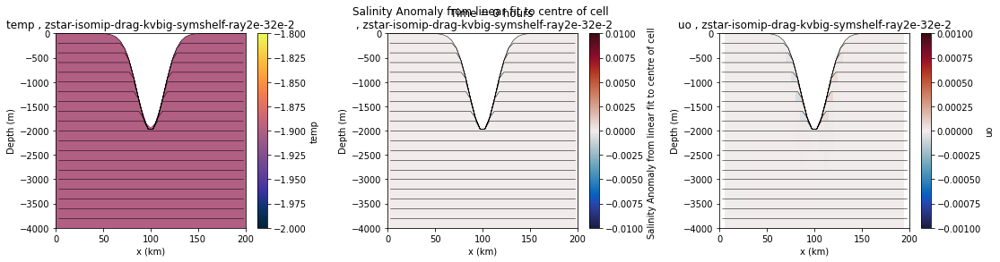

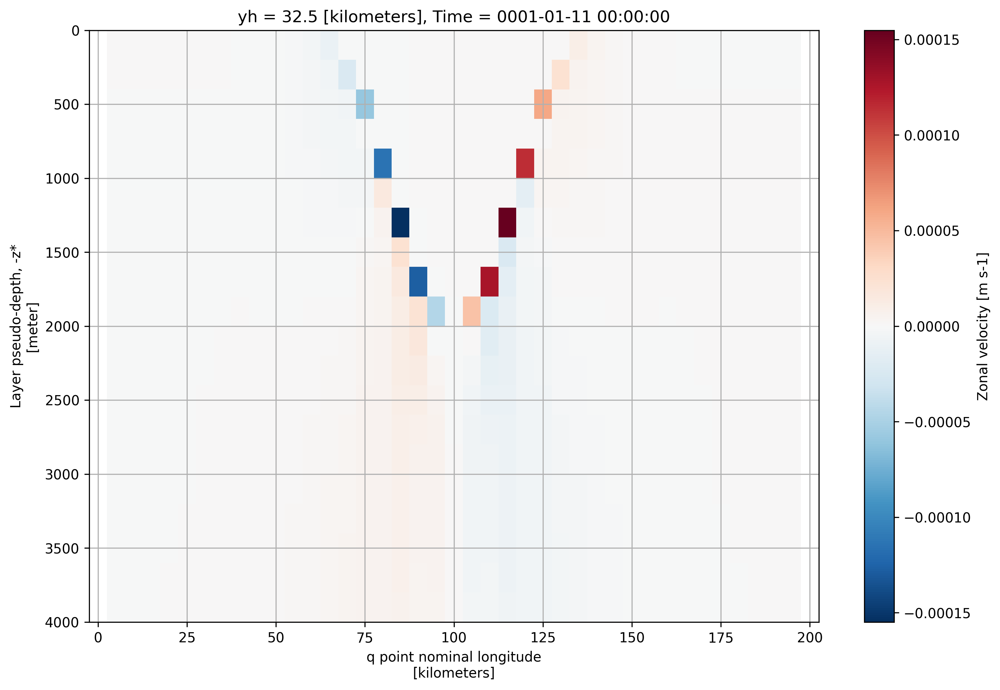

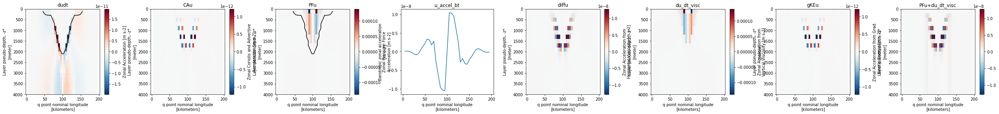

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


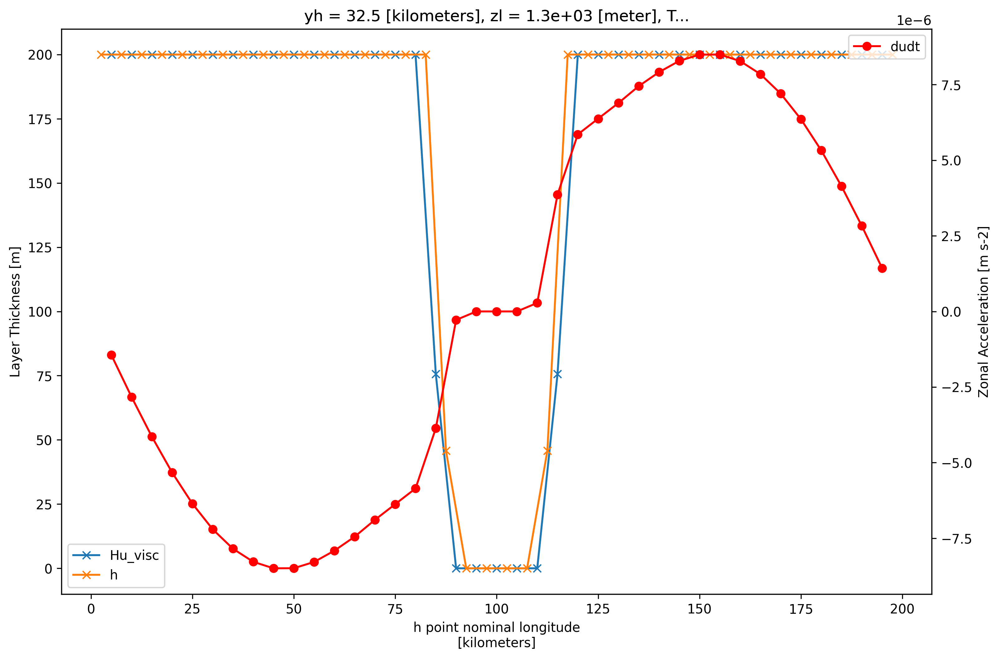

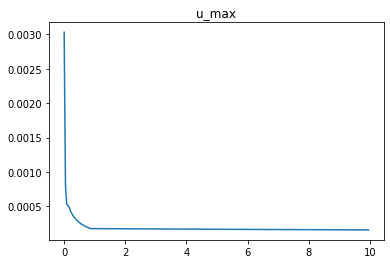

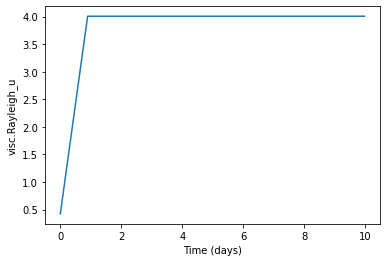

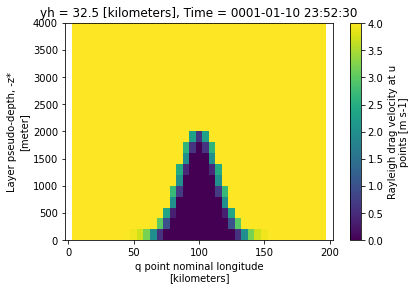

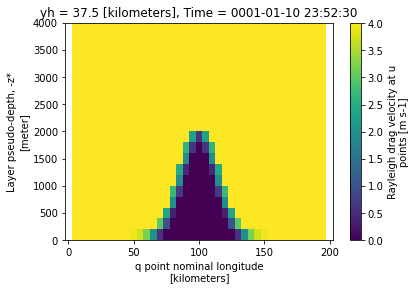

In [55]:


label = 'zstar-isomip-drag-kvbig-symshelf-ray2e-32e-2'

fig, axes = plt.subplots(ncols = 3, figsize = (18,4))
prog = open_files(label)
IC = open_IC(label)
x = 0
time = -1#24*5-1
ymax = 4000
plot(axes[0],x,time,0,prog.temp,"temp",-2,-1.8,cm.cm.thermal,ymax)

prog = open_files(label)
IC = open_IC(label)

#plot(axes[1],x,time,0,prog.salt,"salt",33.7,34.6,cm.cm.haline,ymax)
ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-4000) + 33.8
plot(axes[1],x,time,0,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-2,1e-2,cm.cm.balance,ymax)


prog = open_files(label)
IC = open_IC(label)

plot(axes[2],x,time,0,prog.u,"uo",-1e-3,1e-3,cm.cm.balance,ymax)

fig.subplots_adjust(wspace = 0.4)
fig.suptitle('Time = '+str(time+1)+' hours')
plt.show()

mom = open_mom(label)
prog = open_files(label)
time = -1
y = 0

fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
prog.u.isel(Time = time, yh = y).plot(yincrease = False)
plt.grid()
plt.show()

fig, axes = plt.subplots(ncols = 8, figsize= (44,4))
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[0], yincrease = False, levels = [199], colors = 'k')
prog.h.isel(Time = time, yh = y).plot.contour(ax = axes[2], yincrease = False, levels = [199], colors = 'k')
mom.dudt.isel(Time = time, yh = y).plot(ax = axes[0], yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
axes[0].set_title('dudt')

mom.CAu.isel(Time = time, yh = y).plot(ax = axes[1], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[1].set_title('CAu')
mom.PFu.isel(Time = time, yh = y).plot(ax = axes[2], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[2].set_title('PFu')
mom.u_accel_bt.isel(Time = time, yh = y).plot(ax = axes[3])
axes[3].set_title('u_accel_bt')
mom.diffu.isel(Time = time, yh = y).plot(ax = axes[4], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[4].set_title('diffu')
mom.du_dt_visc.isel(Time = time, yh = y).plot(ax = axes[5], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[5].set_title('du_dt_visc')
mom.gKEu.isel(Time = time, yh = y).plot(ax = axes[6], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[6].set_title('gKEu')
(mom.du_dt_visc+mom.PFu-(mom.du_dt_visc+mom.PFu).isel(zl=0)).isel(Time = time, yh = y).plot(ax = axes[7], yincrease = False)#, cmap = 'RdBu_r', vmin = -1e-12, vmax = 1e-12)
axes[7].set_title('PFu+du_dt_visc')


fig.subplots_adjust(wspace = 0.35)
plt.show()

zl = 1200

fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
visc = open_visc(label)
visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = zl, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
prog.h.isel(Time = 0, yh = 0).sel(zl = zl, method = 'nearest').plot(marker = 'x', label = 'h')
ax2 = ax.twinx()
mom.dudt.isel(Time = 0, yh = y).sel(zl = zl, method = 'nearest').plot(ax = ax2, color = 'r', marker = 'o', label = 'dudt')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
#yincrease = False)
ax.legend()
ax2.legend()

plt.show()

# fig, ax = plt.subplots(figsize = (12,8), dpi = 300)
# visc = xr.open_dataset('archive/visc-'+label+'.nc')
# visc.Hu_visc.isel(Time = 0, yh = 0).sel(zl = 2000, method = 'nearest').plot(marker = 'x', label = 'Hu_visc')
# ax2 = ax.twinx()
# mom.dudt.isel(Time = 0, yh = y).sel(zl = 2000, method = 'nearest').plot(ax = ax2, color = 'r', marker = 'o', label = 'dudt')#ax = axes[0])#, yincrease = False)#, vmin = -1e-12, vmax = 1e-12, cmap = 'RdBu_r')
# #yincrease = False)
# ax.legend()
# ax2.legend()
plt.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
          label = label) 
plt.title('u_max')
plt.show()

plt.plot(np.arange(len(visc.Time))/(24*4), visc.Rayleigh_u.isel(zl = 0, yh = 0, xq = 1).values)
plt.ylabel('visc.Rayleigh_u')
plt.xlabel('Time (days)')
plt.show()
visc.Rayleigh_u.isel(yh = 0,Time = -1).plot()
plt.show()
visc.Rayleigh_u.isel(yh = 1,Time = -1).plot()
plt.show()


# plotting

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


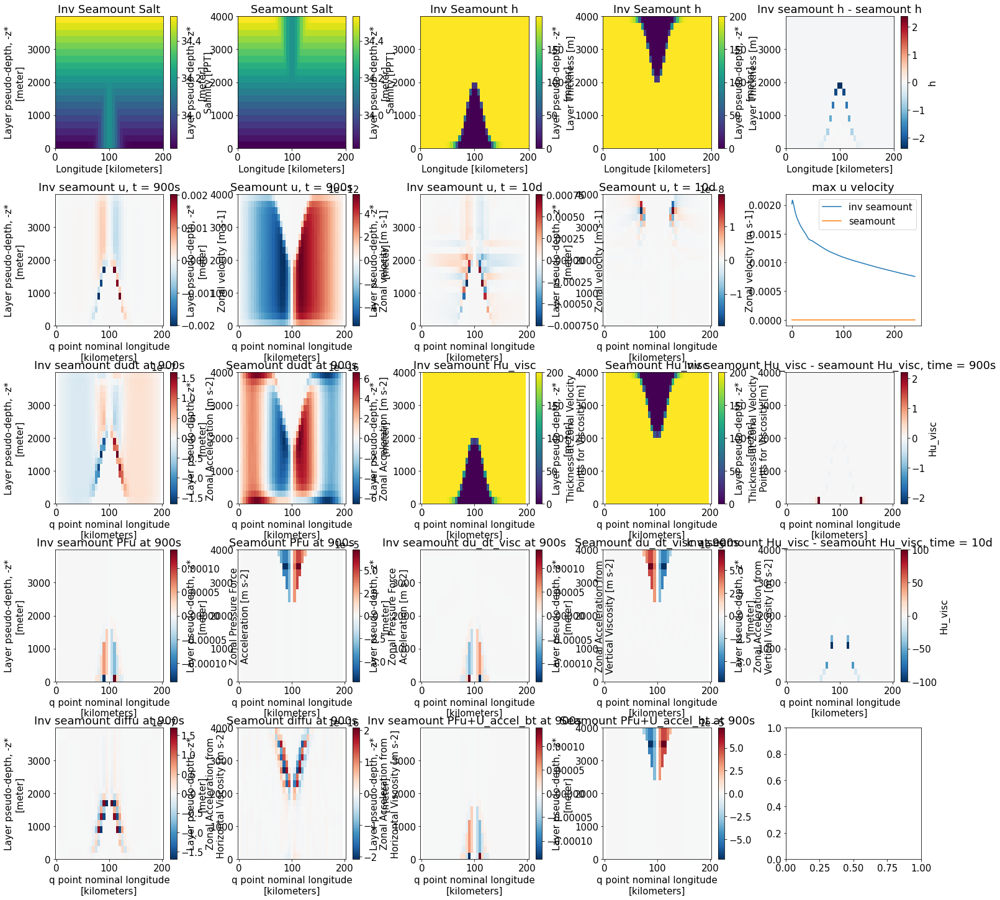

In [14]:
label1 = 'zstar-isomip-hack-drag-kvbig-symshelf'
label2 = 'zstar-isomip-hack-drag-kvbig-symshelf-topo0'

IC1 = open_IC(label1)
IC2 = open_IC(label2)
prog1 = open_files(label1)
prog2 = open_files(label2)
#visc1 = open_visc(label1)
visc2 = open_visc(label2)
mom1 = open_mom(label1)
mom2 = open_mom(label2)

fig, axes = plt.subplots(nrows = 5, ncols = 5, figsize = (25,25))
IC1.Salt.isel(lath = 0).plot(ax = axes[0,0])
axes[0,0].set_title('Inv Seamount Salt')
IC1.h.isel(lath = 0).plot(ax = axes[0,2])
axes[0,2].set_title('Inv Seamount h')
IC2.Salt.isel(lath = 0).plot(ax = axes[0,1])
axes[0,1].set_title('Seamount Salt')
IC2.h.isel(lath = 0).plot(ax = axes[0,3])
axes[0,3].set_title('Inv Seamount h')
(IC1.h.isel(lath = 0,Time = 0)-np.flip(IC2.h.isel(lath = 0,Time = 0).values,axis = 0)).plot(ax = axes[0,4])
axes[0,4].set_title('Inv seamount h - seamount h')

(prog1.u.isel(yh = 0,Time = 0)).plot(ax = axes[1,0])
axes[1,0].set_title('Inv seamount u, t = 900s')

(prog2.u.isel(yh = 0,Time = 0)).plot(ax = axes[1,1])
axes[1,1].set_title('Seamount u, t = 900s')

(prog1.u.isel(yh = 0,Time = -1)).plot(ax = axes[1,2])
axes[1,2].set_title('Inv seamount u, t = 10d')

(prog2.u.isel(yh = 0,Time = -1)).plot(ax = axes[1,3])
axes[1,3].set_title('Seamount u, t = 10d')

axes[1,4].plot(np.arange(len(prog1.Time)),prog1.u.max(['xq','yh','zl']),label = 'inv seamount')
axes[1,4].plot(np.arange(len(prog2.Time)),prog2.u.max(['xq','yh','zl']),label = 'seamount')
axes[1,4].legend()
axes[1,4].set_title('max u velocity')


(visc1.Hu_visc.isel(yh = 0,Time = 0)).plot(ax = axes[2,2])
axes[2,2].set_title('Inv seamount Hu_visc')
(visc2.Hu_visc.isel(yh = 0,Time = 0)).plot(ax = axes[2,3])
axes[2,3].set_title('Seamount Hu_visc')
(visc1.Hu_visc.isel(yh = 0,Time = 0)-np.flip(visc2.Hu_visc.isel(yh = 0,Time = 0).values,axis = 0)).plot(ax = axes[2,4])
axes[2,4].set_title('Inv seamount Hu_visc - seamount Hu_visc, time = 900s')
(visc1.Hu_visc.isel(yh = 0,Time = -1)-np.flip(visc2.Hu_visc.isel(yh = 0,Time = -1).values,axis = 0)).plot(ax = axes[3,4])
axes[3,4].set_title('Inv seamount Hu_visc - seamount Hu_visc, time = 10d')


mom1.dudt.isel(Time = 0, yh = 0).plot(ax = axes[2,0])
axes[2,0].set_title('Inv seamount dudt at 900s')
mom2.dudt.isel(Time = 0, yh = 0).plot(ax = axes[2,1])
axes[2,1].set_title('Seamount dudt at 900s')

mom1.PFu.isel(Time = 0, yh = 0).plot(ax = axes[3,0])
axes[3,0].set_title('Inv seamount PFu at 900s')
mom2.PFu.isel(Time = 0, yh = 0).plot(ax = axes[3,1])
axes[3,1].set_title('Seamount PFu at 900s')

mom1.du_dt_visc.isel(Time = 0, yh = 0).plot(ax = axes[3,2])
axes[3,2].set_title('Inv seamount du_dt_visc at 900s')
mom2.du_dt_visc.isel(Time = 0, yh = 0).plot(ax = axes[3,3])
axes[3,3].set_title('Seamount du_dt_visc at 900s')

mom1.diffu.isel(Time = 0, yh = 0).plot(ax = axes[4,0])
axes[4,0].set_title('Inv seamount diffu at 900s')
mom2.diffu.isel(Time = 0, yh = 0).plot(ax = axes[4,1])
axes[4,1].set_title('Seamount diffu at 900s')

(mom1.PFu+mom1.u_accel_bt).isel(Time = 0, yh = 0).plot(ax = axes[4,2])
axes[4,2].set_title('Inv seamount PFu+U_accel_bt at 900s')
(mom2.PFu+mom2.u_accel_bt).isel(Time = 0, yh = 0).plot(ax = axes[4,3])
axes[4,3].set_title('Seamount PFu+U_accel_bt at 900s')

fig.subplots_adjust(wspace=0.35, hspace=0.35)


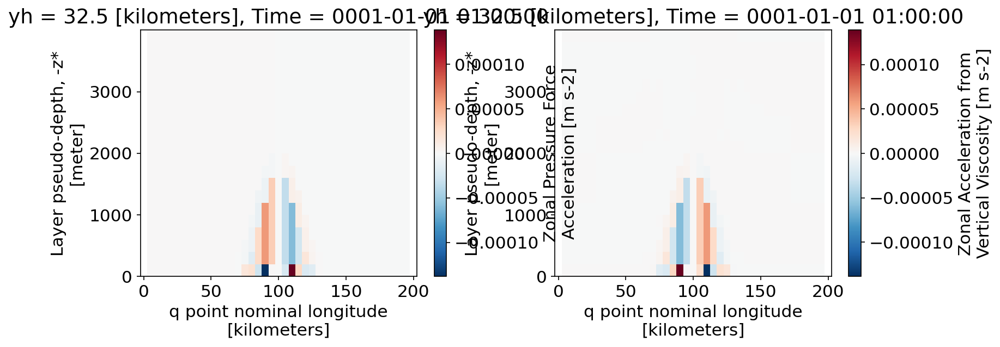

In [15]:
plt.rcParams.update({'font.size': 15})


fig, axes = plt.subplots(ncols = 2, figsize = (12,4),dpi = 150)

mom1.PFu.isel(Time = 0,yh=0).plot(ax = axes[0])
mom1.du_dt_visc.isel(Time = 0,yh=0).plot(ax = axes[1])

# plot(axes[0],x,time,0,prog.u,"uo",-1e-11,1e-11,cm.cm.balance,ymax)
# plot(axes[1],x,-1,0,prog.u,"uo",-5e-4,5e-4,cm.cm.balance,ymax)

# axes[1].set_ylabel('')
# axes[0].set_title('u, time = 15 min')
# axes[1].set_title('u, time = 10 days')
# fig.subplots_adjust(wspace = 0.3)
# plt.show()
